# 📦 Import Library

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import sys
# Arahkan Python untuk mencari library di folder Drive Anda
sys.path.insert(0, '/content/drive/My Drive/Bayi Jamur/Work - Forecasting')

# Impor seperti biasa, sekarang Python akan mengambil dari Drive
import pandas as pd
from anfis import ANFIS  # or from src.anfis import ANFIS if you have local module
import pickle
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import numpy as np

In [ ]:
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import mean_squared_error

# ===================================================================
# LANGKAH 1: IMPOR LIBRARY ANFIS KUSTOM ANDA DARI GOOGLE DRIVE
# ===================================================================
# Arahkan Python ke folder INDUK dari library anfis Anda
sys.path.insert(0, '/content/drive/My Drive/Bayi Jamur/Work - Forecasting/')

# Impor kelas ANFIS yang sudah kita siapkan
from anfis import ANFIS
print("✅ Library ANFIS berhasil diimpor dari Google Drive.")


✅ Library ANFIS berhasil diimpor dari Google Drive.


In [ ]:
# BARU (Tambahkan mean_absolute_percentage_error)
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error, mean_absolute_error

# 📒 Dataset Description

The dataset used in this study is sourced from the **Yahoo Finance** and contains **weekly U.S. retail gasoline prices** (in dollars per gallon) across **all grades and formulations**.

### 🗓️ Time Span
- **Start Date:** January 1, 2005  
- **End Date:** September 30, 2025

### 🗃️ Stock Market Data
- **JKSE**
- **EURO STOXX 50**
- **NASDAQ Composite**
- **LQ45**

### 📈 Data Characteristics
- **Frequency:** Weekly (one sample per week)
- **Type:** Univariate time series (only Close price is considered in this analysis)
- **Coverage:** Stock market indices for various state

This dataset captures long-term historical trends and short-term fluctuations in gasoline prices, making it suitable for time series modeling and predictive analytics.

> 📎 *Note: The dataset is publicly available from the Yahoo Finance website and can be accessed at:*  
> [Yahoo Finance - Historical Data](https://finance.yahoo.com/quote/%5EJKSE/history/)

We will use this dataset to build and evaluate an GA ANFIS-based regression model to forecast future stock prices.


## ➡️📋 Tabel Parameter

| Model | Parameter | Nilai / Ruang Pencarian | Keterangan |
| :--- | :--- | :--- | :--- |
| **ANFIS (Manual)** | Jumlah *Membership Functions* (`n_mfs`) | `[1, 2, 3, 4, 5]` | Diuji secara individual |
| | Jumlah `epochs` | `[50, 100, 150]` | Nilai tetap selama pengujian `n_mfs` |
| | `learning_rate` | `[0.1, 0.05, 0.01, 0.005, 0.001]` | Nilai tetap selama pengujian `n_mfs` |
| **GA-ANFIS** | **Parameter ANFIS yang dicari:** | | |
| | `n_mfs` | `[1, 2, 3]` | *Output* dari proses optimasi GA |
| | `epochs` | `[50 - 200]` | *Output* dari proses optimasi GA |
| | `learning_rate` | `[0.001 - 0.01]` | *Output* dari proses optimasi GA |
| | **Parameter Genetic Algorithm:** | | |
| | Ukuran Populasi (`population_size`) | 10 | |
| | Jumlah Generasi (`ngen`) | 20 | |
| | Probabilitas Crossover (`cxpb`) | 0.6 | |
| | Probabilitas Mutasi (`mutpb`) | 0.2 | |



## 🗃️ LQ45

In [ ]:
import yfinance as yf
import datetime


# Mengambil data Indeks LQ45
print("\nMengunduh data Indeks LQ45...")
lq45_ticker = yf.Ticker('^JKLQ45')
lq45_df = lq45_ticker.history(start="2010-01-01", end="2025-09-30")
lq45_df.to_csv('LQ45.csv')
print("✅ Data LQ45 berhasil disimpan ke LQ45.csv")

# Menampilkan 5 baris terakhir dari data
print("\n5 data terakhir Indeks LQ45:")
print(lq45_df.tail())


Mengunduh data Indeks LQ45...
✅ Data LQ45 berhasil disimpan ke LQ45.csv

5 data terakhir Indeks LQ45:
                                 Open        High         Low       Close  \
Date                                                                        
2025-09-23 00:00:00+07:00  805.289978  810.580017  801.219971  810.580017   
2025-09-24 00:00:00+07:00  813.520020  814.190002  804.599976  808.770020   
2025-09-25 00:00:00+07:00  808.030029  810.169983  795.700012  795.700012   
2025-09-26 00:00:00+07:00  793.859985  802.609985  793.190002  802.609985   
2025-09-29 00:00:00+07:00  806.390015  807.969971  800.659973  802.450012   

                               Volume  Dividends  Stock Splits  
Date                                                            
2025-09-23 00:00:00+07:00  6791700000        0.0           0.0  
2025-09-24 00:00:00+07:00  3932500000        0.0           0.0  
2025-09-25 00:00:00+07:00  9499100000        0.0           0.0  
2025-09-26 00:00:00+07:00  74579

#### 📈 Plot Closing Price Trends Over Time

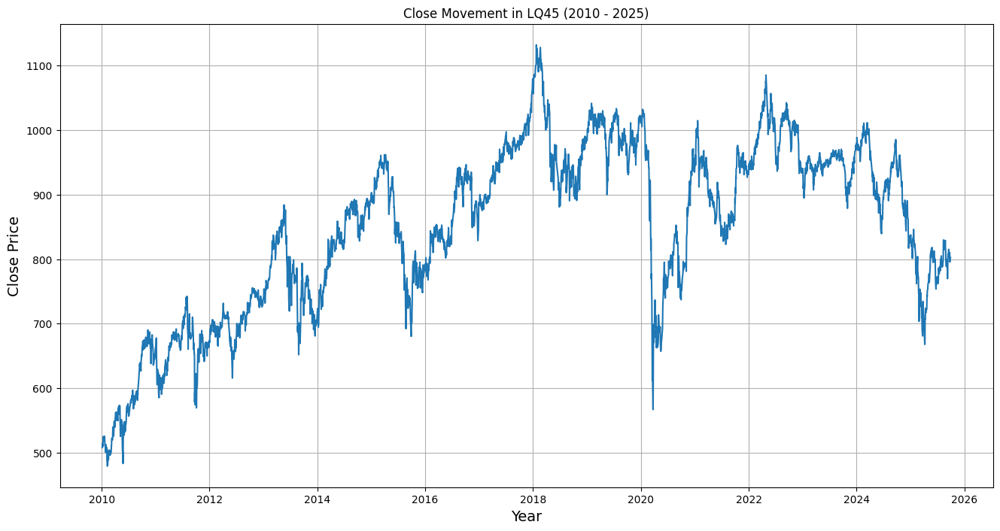

In [ ]:
plt.figure(figsize=(16, 8))
plt.title('Close Movement in LQ45 (2010 - 2025)')
plt.plot(lq45_df['Close'])
plt.xlabel('Year', fontsize=14)
plt.ylabel('Close Price', fontsize=14)
plt.grid(True)
plt.show()

### Lagged Features for Forecasting Model
Peramalan menggunakan data historis dalam urutan waktu tertentu untuk memperkirakan nilai di masa depan.

* (t-n), .. ,(t-2), (t-1), (t)
* Input features are (t-n), ..., (t-1)
* Output or label is (t)

In [ ]:
def create_lagged_features_with_date(data, n_lags=5):
    """
    Membuat fitur lagged dan menyimpan kolom 'Date' yang sesuai.
    """
    # ==== INI BAGIAN PERBAIKANNYA ====
    # Ubah indeks menjadi kolom 'Date'.
    df_with_date_col = data.reset_index()

    df_lagged = pd.DataFrame()
    # Membuat kolom fitur lagged (t-1, t-2, ..., t-n)
    for lag in range(1, n_lags + 1):
        df_lagged[f"Close(t-{lag})"] = df_with_date_col['Close'].shift(lag)

    # Menambahkan kolom target (t) dan kolom tanggal
    df_lagged['Close(t)'] = df_with_date_col['Close']
    df_lagged['Date'] = df_with_date_col['Date'] # Sekarang kode ini bisa berjalan

    # Buang baris NaN yang muncul akibat proses shift
    df_lagged = df_lagged.dropna().reset_index(drop=True)

    return df_lagged

# Terapkan fungsi baru
N_LAGS = 3
lagged_df = create_lagged_features_with_date(lq45_df, n_lags=N_LAGS)

print("\n--- Data setelah dibuat 3 fitur lagged (dengan kolom Date) ---")
print(lagged_df.head())



--- Data setelah dibuat 3 fitur lagged (dengan kolom Date) ---
   Close(t-1)  Close(t-2)  Close(t-3)    Close(t)                      Date
0  513.210022  514.270020  507.910004  509.450012 2010-01-07 00:00:00+07:00
1  509.450012  513.210022  514.270020  515.190002 2010-01-08 00:00:00+07:00
2  515.190002  509.450012  513.210022  518.760010 2010-01-11 00:00:00+07:00
3  518.760010  515.190002  509.450012  525.090027 2010-01-12 00:00:00+07:00
4  525.090027  518.760010  515.190002  518.520020 2010-01-13 00:00:00+07:00


### 🧹 Data Preprocessing & Data Splitting

In [ ]:
# ===================================================================
# FINAL DATA PREPARATION PIPELINE
# ===================================================================

def create_modeling_pipeline(dataframe, split_ratio=0.8):
    """
    A unified function to prepare data for modeling. It splits the data,
    verifies date ranges, scales features and target, and returns
    all necessary components.

    Args:
        dataframe (pd.DataFrame): The input dataframe with lagged features and a 'Date' column.
        split_ratio (float): The proportion of data to be used for the training set.

    Returns:
        tuple: A tuple containing:
            - x_train_scaled (np.array)
            - x_test_scaled (np.array)
            - y_train_scaled (np.array)
            - y_train_original (np.array)
            - y_test_original (np.array)
            - scaler_y (MinMaxScaler object)
    """
    # Ensure the 'Date' column is in datetime format
    dataframe['Date'] = pd.to_datetime(dataframe['Date'])

    # --- 1. Chronological Splitting ---
    split_index = int(len(dataframe) * split_ratio)
    train_df = dataframe.iloc[:split_index]
    test_df = dataframe.iloc[split_index:]

    print(f"Data split chronologically:")
    print(f" - Training set contains: {len(train_df)} rows")
    print(f" - Testing set contains:  {len(test_df)} rows")

    # --- 2. Date Range Verification ---
    start_date_train = train_df['Date'].iloc[0].strftime('%d %B %Y')
    end_date_train = train_df['Date'].iloc[-1].strftime('%d %B %Y')
    start_date_test = test_df['Date'].iloc[0].strftime('%d %B %Y')
    end_date_test = test_df['Date'].iloc[-1].strftime('%d %B %Y')

    print("\n--- 📅 Date Range Verification (80/20 Split) ---")
    print(f"Training data spans from: {start_date_train} to {end_date_train}")
    print(f"Testing data spans from:  {start_date_test} to {end_date_test}")
    print("-" * 60)

    # --- 3. Feature and Target Separation ---
    X_train_df = train_df.drop(columns=["Close(t)", "Date"])
    y_train_original = train_df["Close(t)"].values

    X_test_df = test_df.drop(columns=["Close(t)", "Date"])
    y_test_original = test_df["Close(t)"].values

    # --- 4. Scaling ---
    # Scalers are fitted ONLY on the training data to prevent data leakage
    scaler_x = MinMaxScaler().fit(X_train_df)
    scaler_y = MinMaxScaler().fit(y_train_original.reshape(-1, 1))

    x_train_scaled = scaler_x.transform(X_train_df)
    x_test_scaled = scaler_x.transform(X_test_df)
    y_train_scaled = scaler_y.transform(y_train_original.reshape(-1, 1)).ravel()

    # --- 5. Final Dimension Check ---
    print("\n--- Final Data Dimensions for Model ---")
    print(f"x_train_scaled shape: {x_train_scaled.shape}")
    print(f"y_train_scaled shape: {y_train_scaled.shape}")
    print(f"x_test_scaled shape:  {x_test_scaled.shape}")
    print(f"y_test_original shape: {y_test_original.shape}")
    print("\n✅ Data preparation is complete and ready for the GA-ANFIS model.")

    return x_train_scaled, x_test_scaled, y_train_scaled, y_train_original, y_test_original, scaler_y

# HOW TO USE:
# Assuming 'lagged_df' is your dataframe from the previous step
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

Data split chronologically:
 - Training set contains: 3055 rows
 - Testing set contains:  764 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 20 July 2022
Testing data spans from:  21 July 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3055, 3)
y_train_scaled shape: (3055,)
x_test_scaled shape:  (764, 3)
y_test_original shape: (764,)

✅ Data preparation is complete and ready for the GA-ANFIS model.


In [ ]:
from datetime import datetime

## ANFIS

## Pengujian Membership Functions
Menentukan seberapa kompleks model ANFIS

### n_mfs = 1

Data split chronologically:
 - Training set contains: 3055 rows
 - Testing set contains:  764 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 20 July 2022
Testing data spans from:  21 July 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3055, 3)
y_train_scaled shape: (3055,)
x_test_scaled shape:  (764, 3)
y_test_original shape: (764,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3055, 3), y=(3055,)
Testing data shape: X=(764, 3), y=(764,)

--- ANFIS Training Process ---
Epoch 1/50 completed.
Epoch 2/50 completed.
Epoch 3/50 completed.
Epoch 4/50 completed.
Epoch 5/50 completed.
Epoch 6/50 completed.
Epoch 7/50 completed.
Epoch 8/50 completed.
Epoch 9/50 completed.
Epoch 10/50 completed.
Epoch 11/50 completed.
Epoch 12/50 completed.
Epoch 13/50 completed.
Epoch 14/50 completed.
Epoch 15/50 c

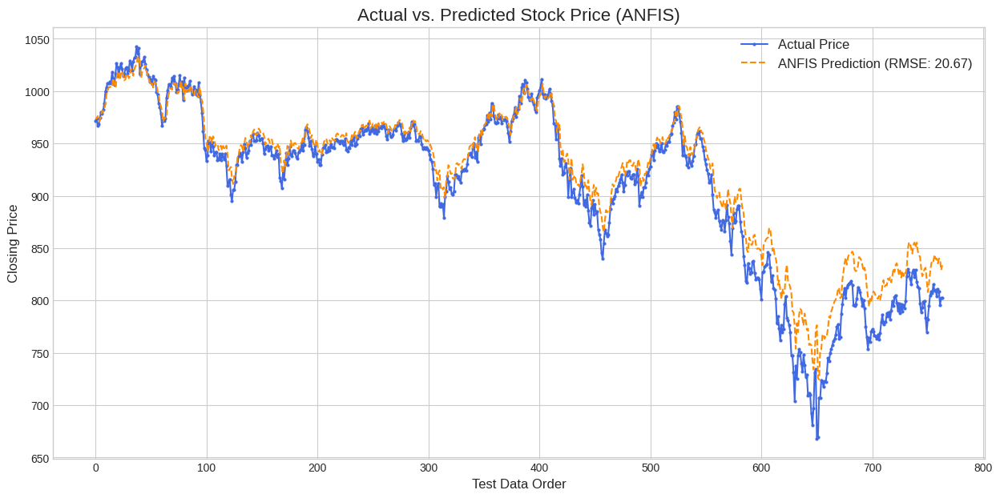

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=1,
    epochs=50,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

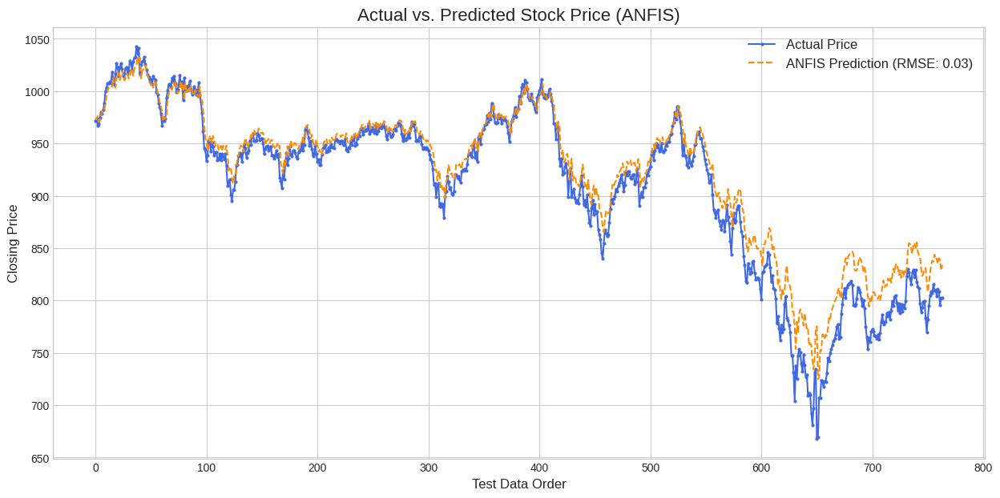

In [ ]:
# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 20.6698 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi   Selisih
0    971.549988      974.304874  2.754886
1    974.039978      973.822937  0.217041
2    967.130005      976.118730  8.988725
3    968.479980      970.916326  2.436346
4    974.460022      971.669588  2.790434

--- Statistik Selisih (Error) ---
count    764.000000
mean      15.179016
std       14.039135
min        0.064849
25%        4.765690
50%       10.346772
75%       23.633755
max      108.529670
Name: Selisih, dtype: float64


### n_mfs = 2

Data split chronologically:
 - Training set contains: 3055 rows
 - Testing set contains:  764 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 20 July 2022
Testing data spans from:  21 July 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3055, 3)
y_train_scaled shape: (3055,)
x_test_scaled shape:  (764, 3)
y_test_original shape: (764,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3055, 3), y=(3055,)
Testing data shape: X=(764, 3), y=(764,)

--- ANFIS Training Process ---
Epoch 1/50 completed.
Epoch 2/50 completed.
Epoch 3/50 completed.
Epoch 4/50 completed.
Epoch 5/50 completed.
Epoch 6/50 completed.
Epoch 7/50 completed.
Epoch 8/50 completed.
Epoch 9/50 completed.
Epoch 10/50 completed.
Epoch 11/50 completed.
Epoch 12/50 completed.
Epoch 13/50 completed.
Epoch 14/50 completed.
Epoch 15/50 c

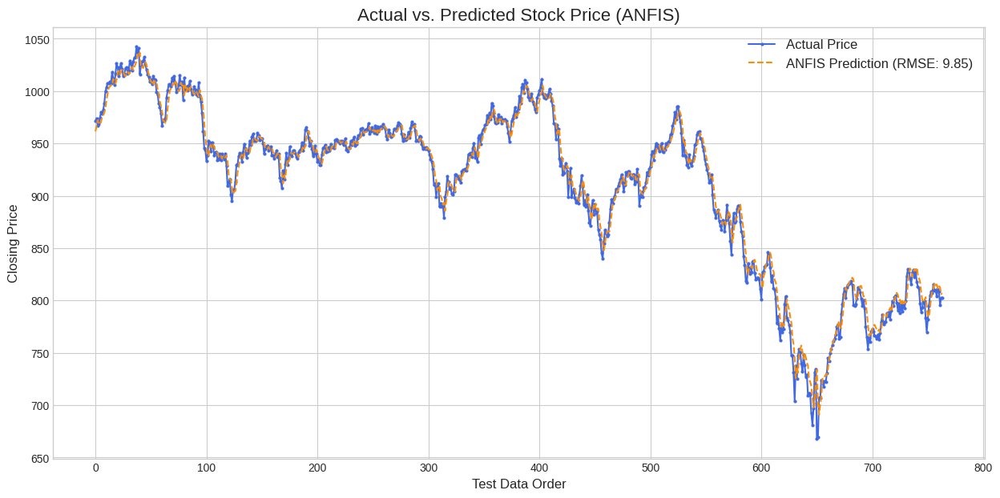

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=50,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

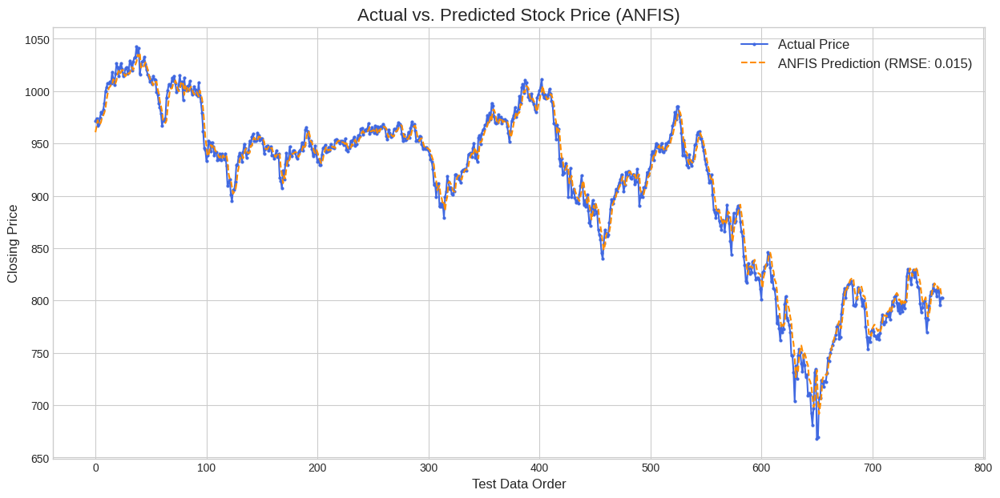

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 9.8471 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0    971.549988      961.471965  10.078023
1    974.039978      966.594447   7.445531
2    967.130005      972.294234   5.164229
3    968.479980      968.343226   0.136754
4    974.460022      968.230401   6.229621

--- Statistik Selisih (Error) ---
count    764.000000
mean       7.317793
std        6.593374
min        0.017759
25%        2.468332
50%        5.704286
75%       10.082218
max       65.926915
Name: Selisih, dtype: float64


### n_mfs = 3

Data split chronologically:
 - Training set contains: 3055 rows
 - Testing set contains:  764 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 20 July 2022
Testing data spans from:  21 July 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3055, 3)
y_train_scaled shape: (3055,)
x_test_scaled shape:  (764, 3)
y_test_original shape: (764,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3055, 3), y=(3055,)
Testing data shape: X=(764, 3), y=(764,)

--- ANFIS Training Process ---
Epoch 1/50 completed.
Epoch 2/50 completed.
Epoch 3/50 completed.
Epoch 4/50 completed.
Epoch 5/50 completed.
Epoch 6/50 completed.
Epoch 7/50 completed.
Epoch 8/50 completed.
Epoch 9/50 completed.
Epoch 10/50 completed.
Epoch 11/50 completed.
Epoch 12/50 completed.
Epoch 13/50 completed.
Epoch 14/50 completed.
Epoch 15/50 c

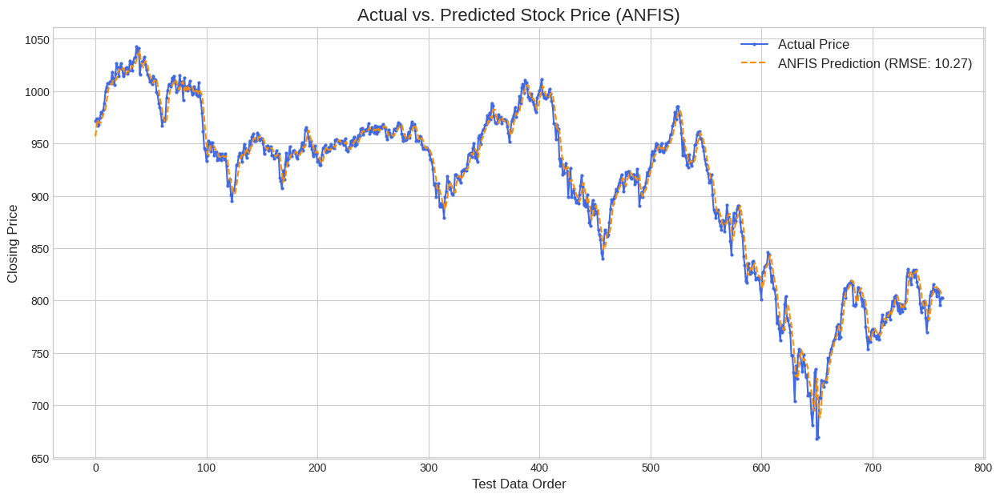

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=3,
    epochs=50,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

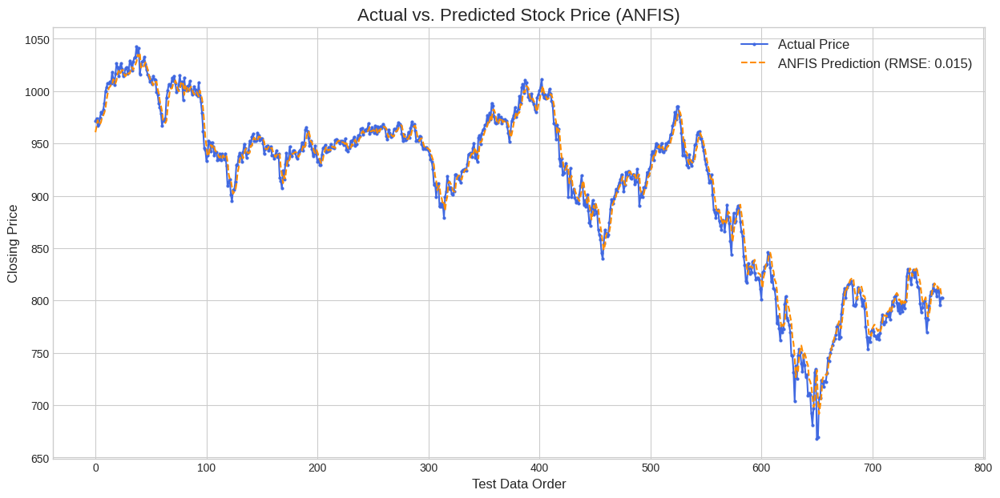

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 10.2715 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0    971.549988      956.730953  14.819035
1    974.039978      965.322266   8.717712
2    967.130005      972.855019   5.725014
3    968.479980      970.055298   1.575318
4    974.460022      969.341110   5.118912

--- Statistik Selisih (Error) ---
count    764.000000
mean       7.745834
std        6.750231
min        0.005633
25%        2.933863
50%        5.834718
75%       10.854230
max       57.737886
Name: Selisih, dtype: float64


### n_mfs = 4

Data split chronologically:
 - Training set contains: 3055 rows
 - Testing set contains:  764 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 20 July 2022
Testing data spans from:  21 July 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3055, 3)
y_train_scaled shape: (3055,)
x_test_scaled shape:  (764, 3)
y_test_original shape: (764,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3055, 3), y=(3055,)
Testing data shape: X=(764, 3), y=(764,)

--- ANFIS Training Process ---
Epoch 1/50 completed.
Epoch 2/50 completed.
Epoch 3/50 completed.
Epoch 4/50 completed.
Epoch 5/50 completed.
Epoch 6/50 completed.
Epoch 7/50 completed.
Epoch 8/50 completed.
Epoch 9/50 completed.
Epoch 10/50 completed.
Epoch 11/50 completed.
Epoch 12/50 completed.
Epoch 13/50 completed.
Epoch 14/50 completed.
Epoch 15/50 c

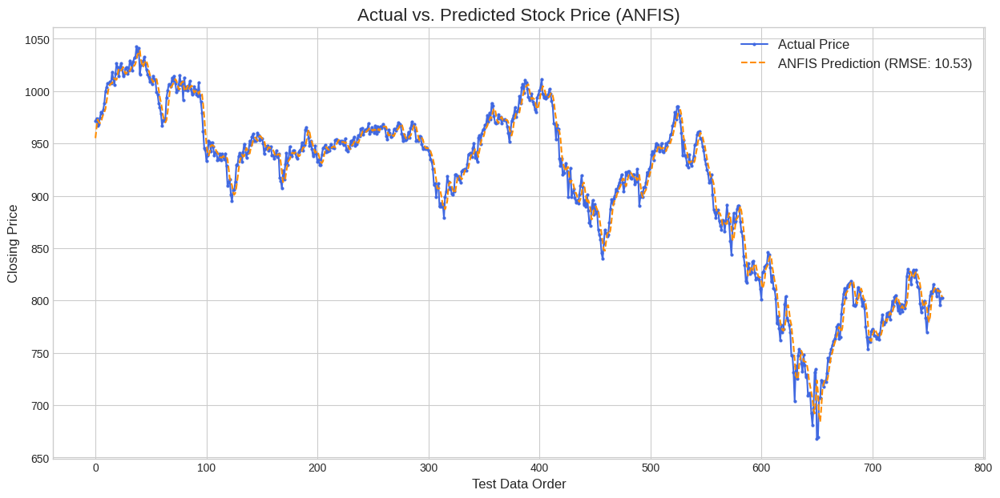

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=4,
    epochs=50,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

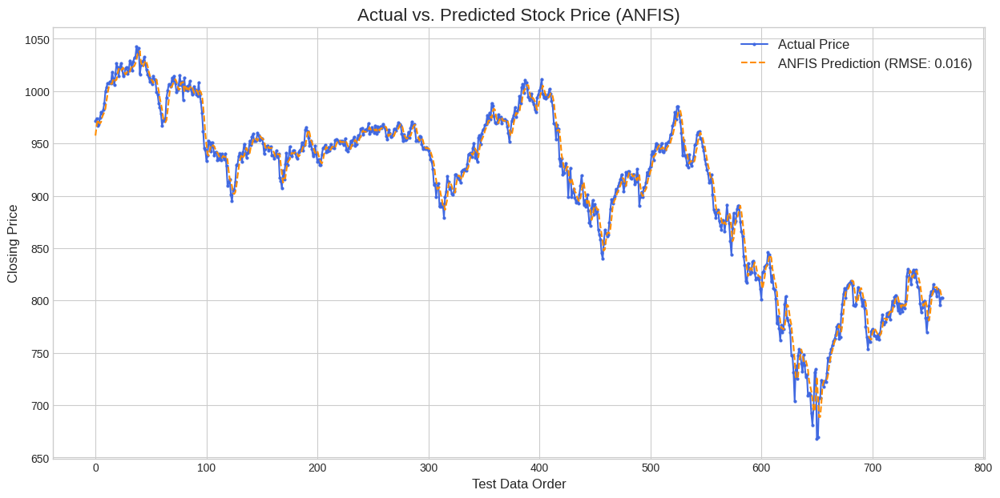

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 10.5316 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0    971.549988      955.112156  16.437831
1    974.039978      965.306131   8.733847
2    967.130005      972.874015   5.744010
3    968.479980      970.603358   2.123378
4    974.460022      969.462819   4.997203

--- Statistik Selisih (Error) ---
count    764.000000
mean       7.954561
std        6.906627
min        0.014293
25%        2.916925
50%        6.083898
75%       11.169998
max       55.860975
Name: Selisih, dtype: float64


### n_mfs = 5

Data split chronologically:
 - Training set contains: 3055 rows
 - Testing set contains:  764 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 20 July 2022
Testing data spans from:  21 July 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3055, 3)
y_train_scaled shape: (3055,)
x_test_scaled shape:  (764, 3)
y_test_original shape: (764,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3055, 3), y=(3055,)
Testing data shape: X=(764, 3), y=(764,)

--- ANFIS Training Process ---
Epoch 1/50 completed.
Epoch 2/50 completed.
Epoch 3/50 completed.
Epoch 4/50 completed.
Epoch 5/50 completed.
Epoch 6/50 completed.
Epoch 7/50 completed.
Epoch 8/50 completed.
Epoch 9/50 completed.
Epoch 10/50 completed.
Epoch 11/50 completed.
Epoch 12/50 completed.
Epoch 13/50 completed.
Epoch 14/50 completed.
Epoch 15/50 c

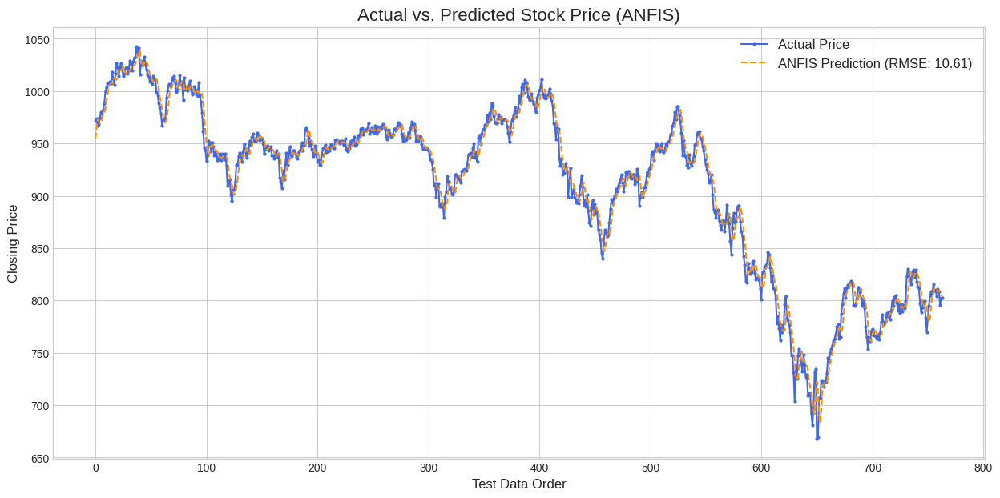

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=5,
    epochs=50,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

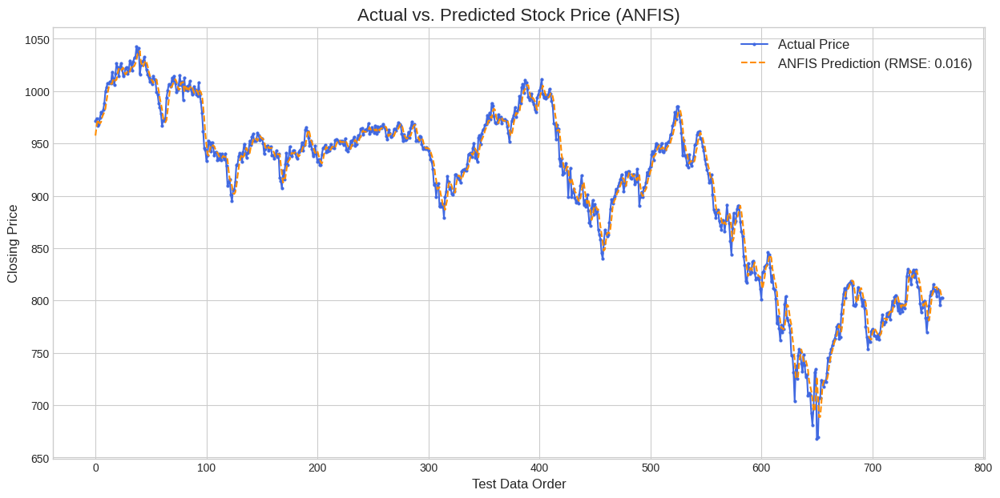

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 10.6122 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0    971.549988      954.572739  16.977249
1    974.039978      964.885370   9.154608
2    967.130005      972.872659   5.742654
3    968.479980      970.646365   2.166385
4    974.460022      969.550367   4.909655

--- Statistik Selisih (Error) ---
count    764.000000
mean       8.023763
std        6.949953
min        0.000815
25%        3.006773
50%        6.108635
75%       11.110338
max       54.760404
Name: Selisih, dtype: float64


## Pengujian Nilai Epoch
Menentukan seberapa "keras" atau seberapa lama model ANFIS berlatih.

### epoch = 50

Data split chronologically:
 - Training set contains: 3055 rows
 - Testing set contains:  764 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 20 July 2022
Testing data spans from:  21 July 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3055, 3)
y_train_scaled shape: (3055,)
x_test_scaled shape:  (764, 3)
y_test_original shape: (764,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3055, 3), y=(3055,)
Testing data shape: X=(764, 3), y=(764,)

--- ANFIS Training Process ---
Epoch 1/50 completed.
Epoch 2/50 completed.
Epoch 3/50 completed.
Epoch 4/50 completed.
Epoch 5/50 completed.
Epoch 6/50 completed.
Epoch 7/50 completed.
Epoch 8/50 completed.
Epoch 9/50 completed.
Epoch 10/50 completed.
Epoch 11/50 completed.
Epoch 12/50 completed.
Epoch 13/50 completed.
Epoch 14/50 completed.
Epoch 15/50 c

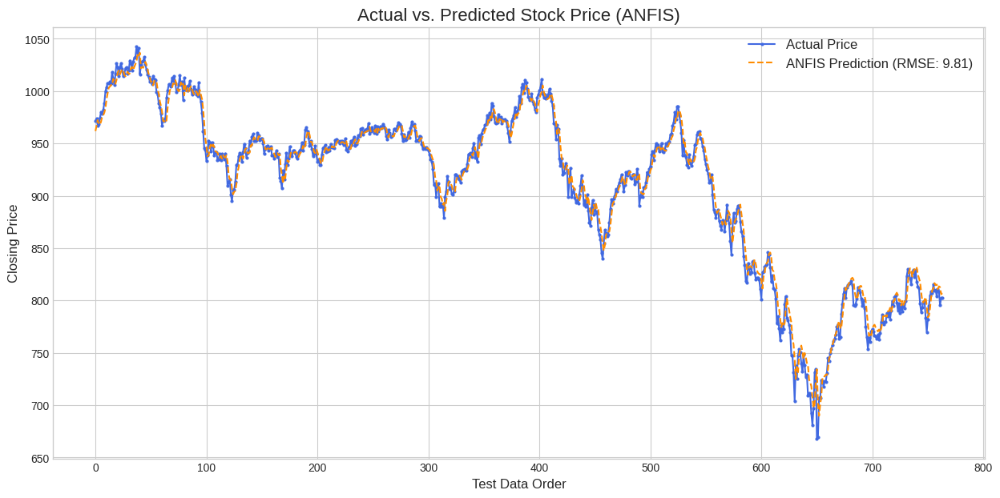

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=50,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

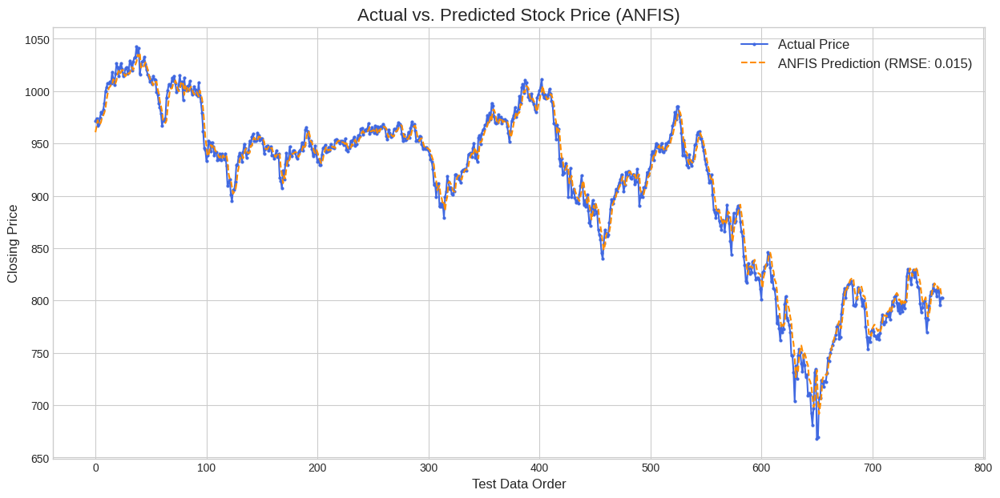

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 9.8120 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi   Selisih
0    971.549988      961.804971  9.745017
1    974.039978      966.940808  7.099170
2    967.130005      972.314959  5.184954
3    968.479980      968.356305  0.123675
4    974.460022      968.180735  6.279287

--- Statistik Selisih (Error) ---
count    764.000000
mean       7.287193
std        6.574817
min        0.002846
25%        2.491712
50%        5.638288
75%       10.041296
max       66.374190
Name: Selisih, dtype: float64


### epoch = 100



Data split chronologically:
 - Training set contains: 3055 rows
 - Testing set contains:  764 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 20 July 2022
Testing data spans from:  21 July 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3055, 3)
y_train_scaled shape: (3055,)
x_test_scaled shape:  (764, 3)
y_test_original shape: (764,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3055, 3), y=(3055,)
Testing data shape: X=(764, 3), y=(764,)

--- ANFIS Training Process ---
Epoch 1/100 completed.
Epoch 2/100 completed.
Epoch 3/100 completed.
Epoch 4/100 completed.
Epoch 5/100 completed.
Epoch 6/100 completed.
Epoch 7/100 completed.
Epoch 8/100 completed.
Epoch 9/100 completed.
Epoch 10/100 completed.
Epoch 11/100 completed.
Epoch 12/100 completed.
Epoch 13/100 completed.
Epoch 14/100 completed.

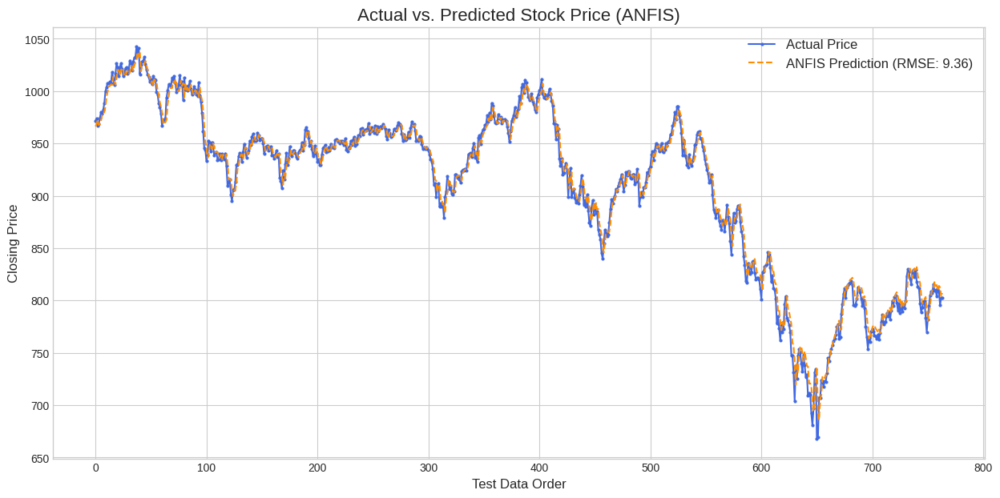

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=100,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

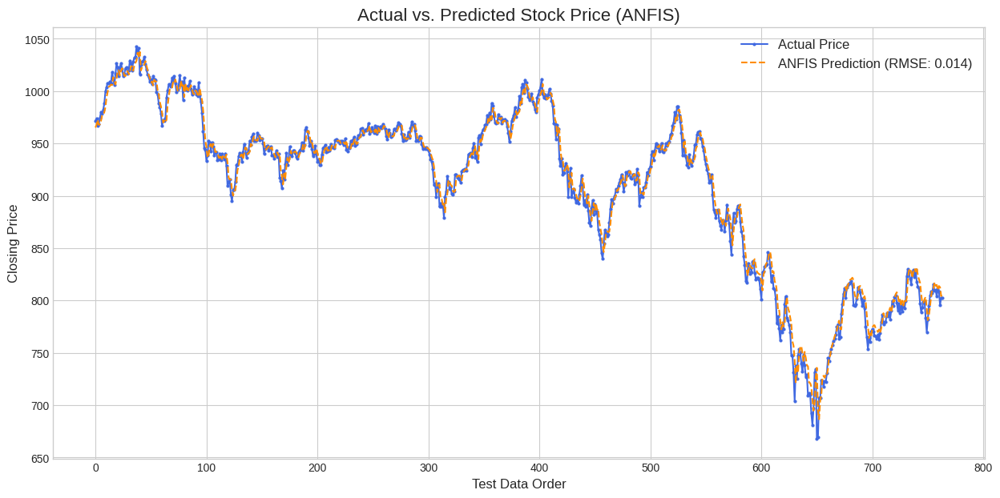

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 9.3637 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi   Selisih
0    971.549988      966.280590  5.269398
1    974.039978      968.210465  5.829513
2    967.130005      972.855550  5.725545
3    968.479980      967.725909  0.754071
4    974.460022      968.287118  6.172904

--- Statistik Selisih (Error) ---
count    764.000000
mean       6.960050
std        6.268043
min        0.014846
25%        2.370801
50%        5.447470
75%        9.416582
max       68.205788
Name: Selisih, dtype: float64


### epoch = 150

Data split chronologically:
 - Training set contains: 3055 rows
 - Testing set contains:  764 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 20 July 2022
Testing data spans from:  21 July 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3055, 3)
y_train_scaled shape: (3055,)
x_test_scaled shape:  (764, 3)
y_test_original shape: (764,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3055, 3), y=(3055,)
Testing data shape: X=(764, 3), y=(764,)

--- ANFIS Training Process ---
Epoch 1/150 completed.
Epoch 2/150 completed.
Epoch 3/150 completed.
Epoch 4/150 completed.
Epoch 5/150 completed.
Epoch 6/150 completed.
Epoch 7/150 completed.
Epoch 8/150 completed.
Epoch 9/150 completed.
Epoch 10/150 completed.
Epoch 11/150 completed.
Epoch 12/150 completed.
Epoch 13/150 completed.
Epoch 14/150 completed.

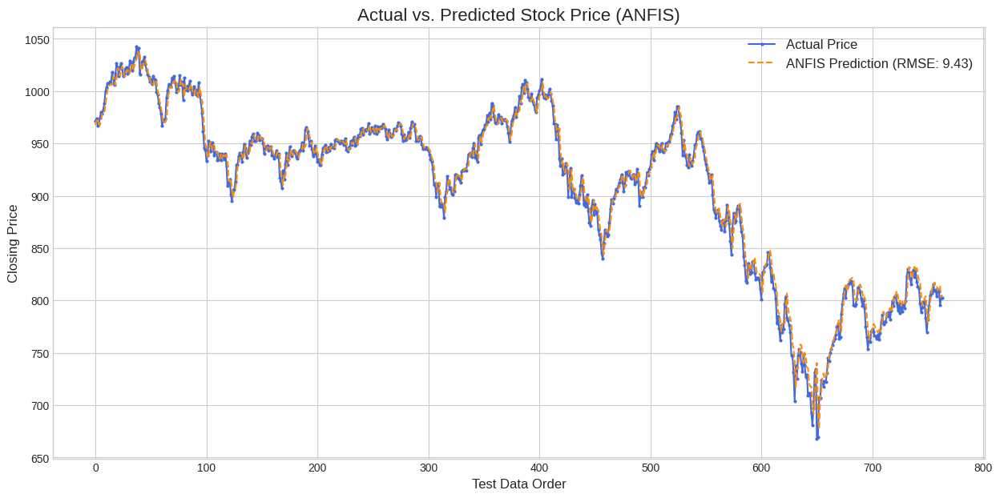

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=150,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

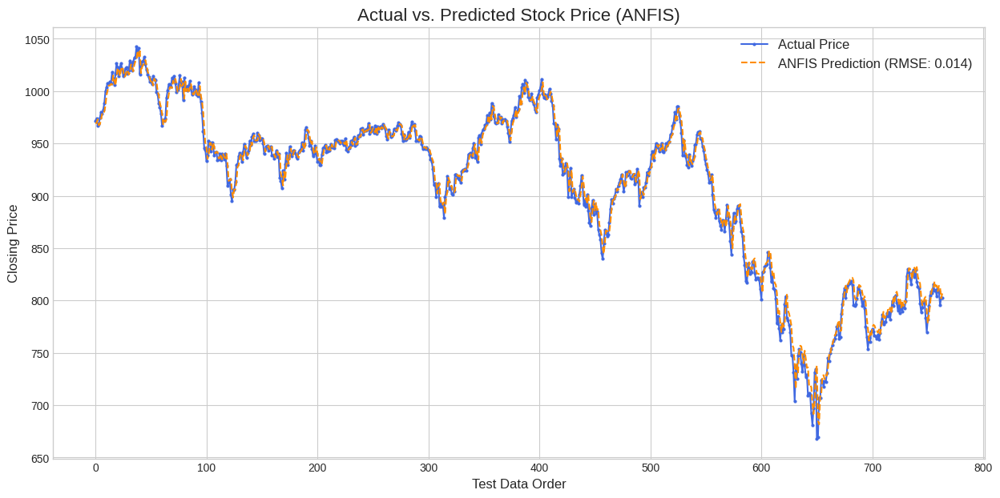

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 9.4287 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi   Selisih
0    971.549988      967.411107  4.138881
1    974.039978      971.632058  2.407920
2    967.130005      972.752072  5.622067
3    968.479980      968.305091  0.174890
4    974.460022      967.605145  6.854877

--- Statistik Selisih (Error) ---
count    764.000000
mean       6.989982
std        6.331894
min        0.006360
25%        2.551782
50%        5.492843
75%        9.411405
max       72.496907
Name: Selisih, dtype: float64


## Pengujian Nilai Learning Rate
Pengaturan seberapa cepat model ANFIS belajar di setiap langkah.

[0.1, 0.05, 0.01, 0.005, 0.001]

### lr = 0.1

Data split chronologically:
 - Training set contains: 3055 rows
 - Testing set contains:  764 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 20 July 2022
Testing data spans from:  21 July 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3055, 3)
y_train_scaled shape: (3055,)
x_test_scaled shape:  (764, 3)
y_test_original shape: (764,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3055, 3), y=(3055,)
Testing data shape: X=(764, 3), y=(764,)

--- ANFIS Training Process ---
Epoch 1/100 completed.
Epoch 2/100 completed.
Epoch 3/100 completed.
Epoch 4/100 completed.
Epoch 5/100 completed.
Epoch 6/100 completed.
Epoch 7/100 completed.
Epoch 8/100 completed.
Epoch 9/100 completed.
Epoch 10/100 completed.
Epoch 11/100 completed.
Epoch 12/100 completed.
Epoch 13/100 completed.
Epoch 14/100 completed.

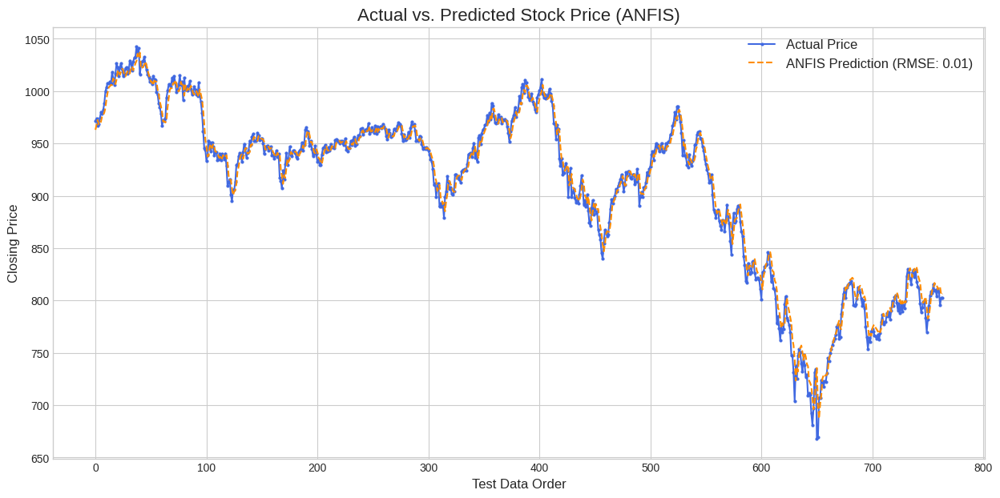

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=150,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

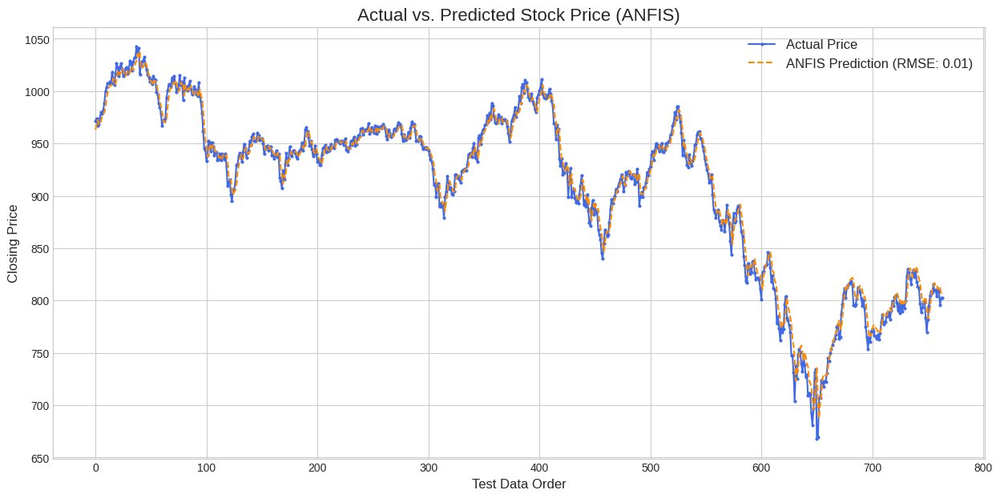

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 9.6892 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi   Selisih
0    971.549988      963.025356  8.524632
1    974.039978      967.928865  6.111113
2    967.130005      972.412680  5.282675
3    968.479980      968.337258  0.142722
4    974.460022      968.063018  6.397004

--- Statistik Selisih (Error) ---
count    764.000000
mean       7.191226
std        6.497809
min        0.013675
25%        2.544675
50%        5.545962
75%        9.948458
max       67.666077
Name: Selisih, dtype: float64


### lr = 0.05

Data split chronologically:
 - Training set contains: 3055 rows
 - Testing set contains:  764 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 20 July 2022
Testing data spans from:  21 July 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3055, 3)
y_train_scaled shape: (3055,)
x_test_scaled shape:  (764, 3)
y_test_original shape: (764,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3055, 3), y=(3055,)
Testing data shape: X=(764, 3), y=(764,)

--- ANFIS Training Process ---
Epoch 1/100 completed.
Epoch 2/100 completed.
Epoch 3/100 completed.
Epoch 4/100 completed.
Epoch 5/100 completed.
Epoch 6/100 completed.
Epoch 7/100 completed.
Epoch 8/100 completed.
Epoch 9/100 completed.
Epoch 10/100 completed.
Epoch 11/100 completed.
Epoch 12/100 completed.
Epoch 13/100 completed.
Epoch 14/100 completed.

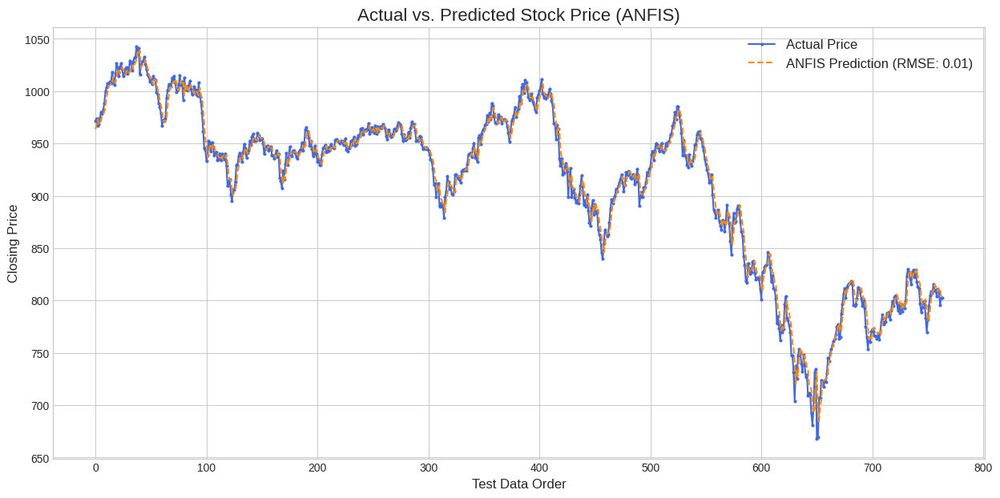

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=100,
    learning_rate=0.05
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

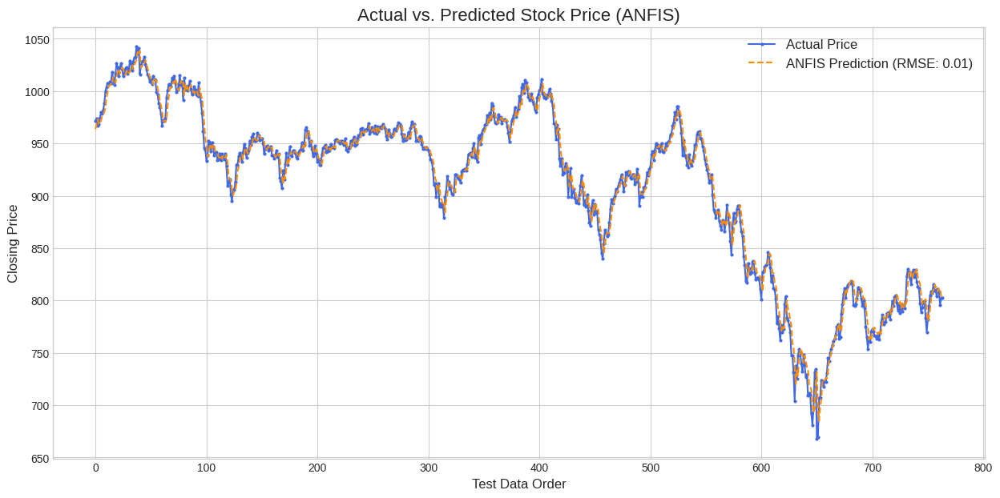

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 9.3709 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi   Selisih
0    971.549988      963.670629  7.879359
1    974.039978      967.785875  6.254103
2    967.130005      973.030268  5.900263
3    968.479980      968.611429  0.131448
4    974.460022      968.692657  5.767365

--- Statistik Selisih (Error) ---
count    764.000000
mean       7.002632
std        6.231183
min        0.012007
25%        2.535502
50%        5.717542
75%        9.370259
max       63.853915
Name: Selisih, dtype: float64


### lr = 0.01

Data split chronologically:
 - Training set contains: 3055 rows
 - Testing set contains:  764 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 20 July 2022
Testing data spans from:  21 July 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3055, 3)
y_train_scaled shape: (3055,)
x_test_scaled shape:  (764, 3)
y_test_original shape: (764,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3055, 3), y=(3055,)
Testing data shape: X=(764, 3), y=(764,)

--- ANFIS Training Process ---
Epoch 1/100 completed.
Epoch 2/100 completed.
Epoch 3/100 completed.
Epoch 4/100 completed.
Epoch 5/100 completed.
Epoch 6/100 completed.
Epoch 7/100 completed.
Epoch 8/100 completed.
Epoch 9/100 completed.
Epoch 10/100 completed.
Epoch 11/100 completed.
Epoch 12/100 completed.
Epoch 13/100 completed.
Epoch 14/100 completed.

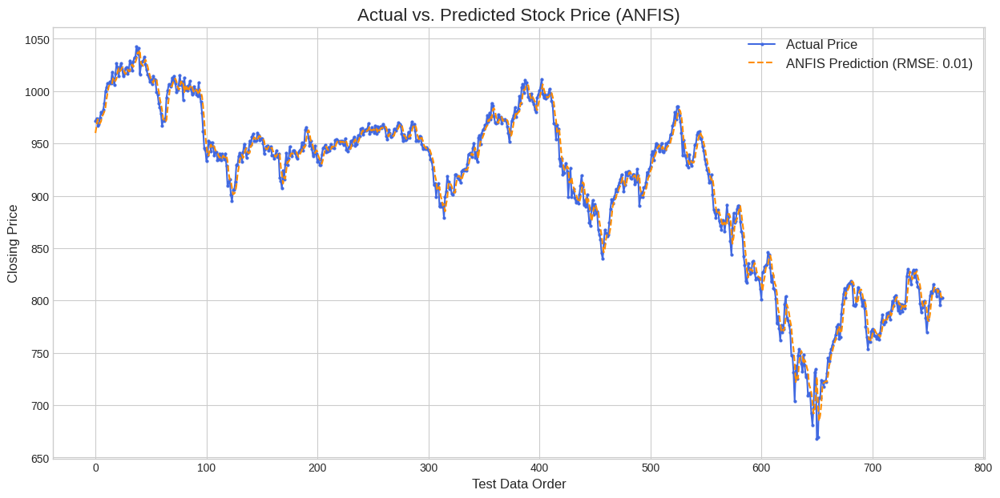

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=100,
    learning_rate= 0.01
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

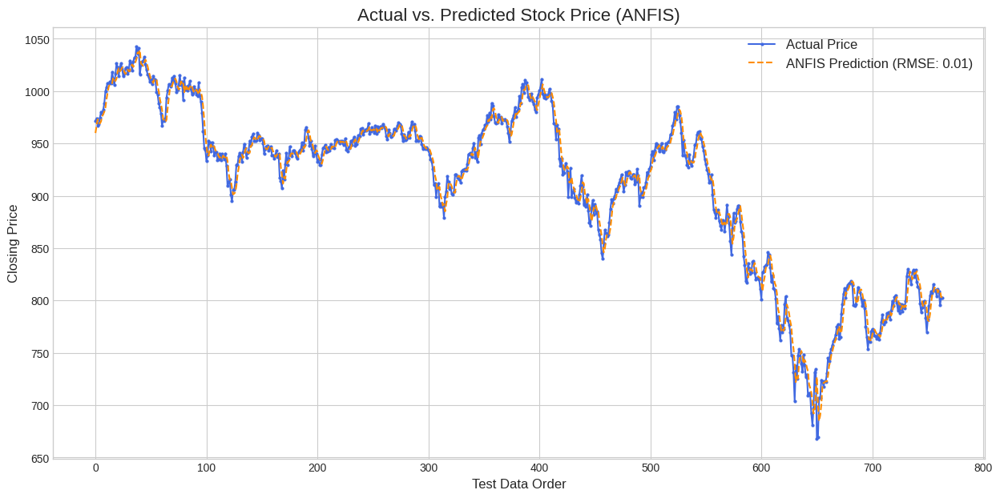

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 9.7422 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0    971.549988      959.948321  11.601667
1    974.039978      967.119515   6.920463
2    967.130005      973.098444   5.968439
3    968.479980      969.706042   1.226061
4    974.460022      969.095823   5.364199

--- Statistik Selisih (Error) ---
count    764.000000
mean       7.349187
std        6.399425
min        0.034731
25%        2.878462
50%        5.596806
75%       10.060231
max       59.129166
Name: Selisih, dtype: float64


### lr = 0.005

Data split chronologically:
 - Training set contains: 3055 rows
 - Testing set contains:  764 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 20 July 2022
Testing data spans from:  21 July 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3055, 3)
y_train_scaled shape: (3055,)
x_test_scaled shape:  (764, 3)
y_test_original shape: (764,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3055, 3), y=(3055,)
Testing data shape: X=(764, 3), y=(764,)

--- ANFIS Training Process ---
Epoch 1/100 completed.
Epoch 2/100 completed.
Epoch 3/100 completed.
Epoch 4/100 completed.
Epoch 5/100 completed.
Epoch 6/100 completed.
Epoch 7/100 completed.
Epoch 8/100 completed.
Epoch 9/100 completed.
Epoch 10/100 completed.
Epoch 11/100 completed.
Epoch 12/100 completed.
Epoch 13/100 completed.
Epoch 14/100 completed.

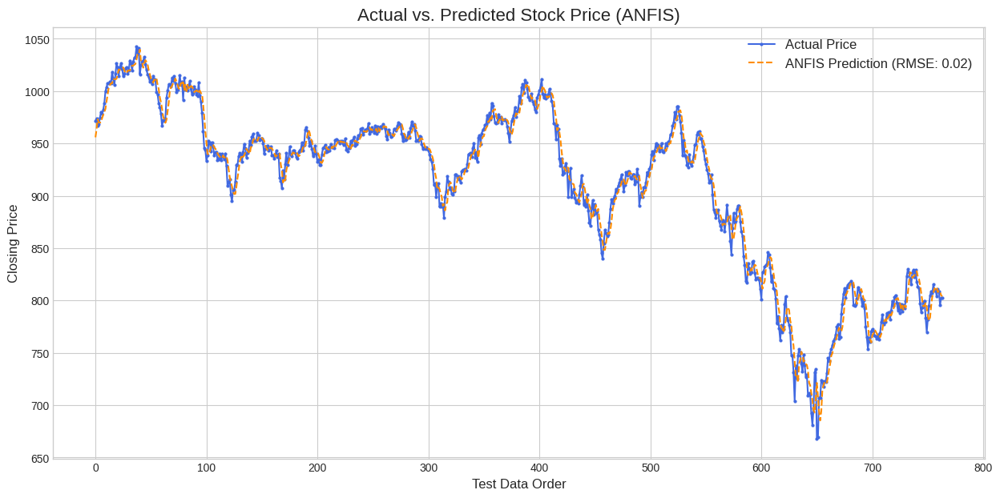

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=100,
    learning_rate= 0.005
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

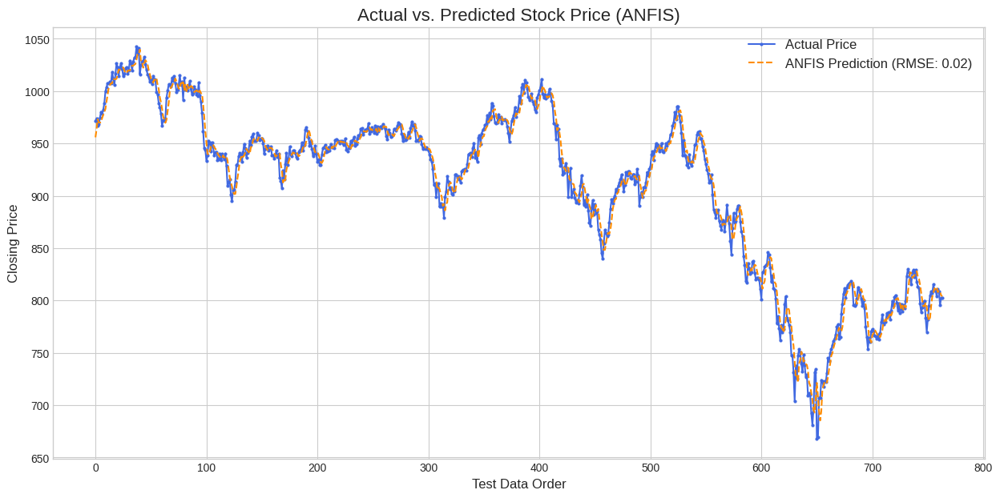

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 10.3750 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0    971.549988      955.867171  15.682817
1    974.039978      963.683535  10.356443
2    967.130005      973.144353   6.014348
3    968.479980      970.085388   1.605408
4    974.460022      969.933630   4.526392

--- Statistik Selisih (Error) ---
count    764.000000
mean       7.869558
std        6.765401
min        0.027308
25%        3.011900
50%        6.040343
75%       10.882854
max       53.405824
Name: Selisih, dtype: float64


### lr = 0.001

Data split chronologically:
 - Training set contains: 3055 rows
 - Testing set contains:  764 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 20 July 2022
Testing data spans from:  21 July 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3055, 3)
y_train_scaled shape: (3055,)
x_test_scaled shape:  (764, 3)
y_test_original shape: (764,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3055, 3), y=(3055,)
Testing data shape: X=(764, 3), y=(764,)

--- ANFIS Training Process ---
Epoch 1/100 completed.
Epoch 2/100 completed.
Epoch 3/100 completed.
Epoch 4/100 completed.
Epoch 5/100 completed.
Epoch 6/100 completed.
Epoch 7/100 completed.
Epoch 8/100 completed.
Epoch 9/100 completed.
Epoch 10/100 completed.
Epoch 11/100 completed.
Epoch 12/100 completed.
Epoch 13/100 completed.
Epoch 14/100 completed.

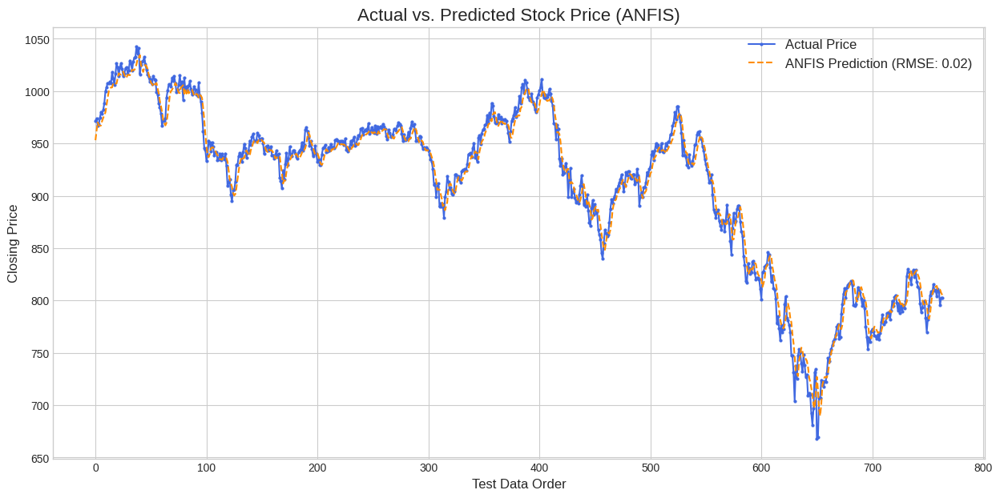

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=100,
    learning_rate=0.001
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

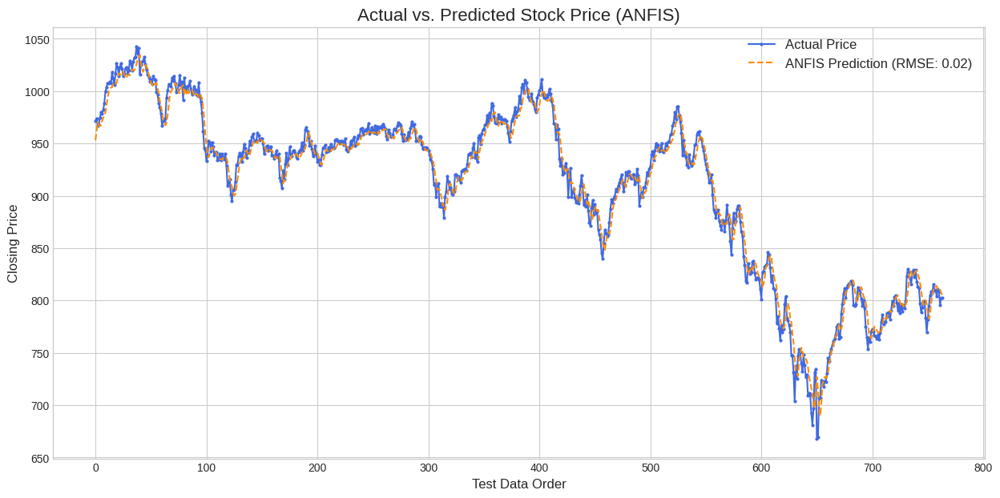

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 10.7323 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0    971.549988      953.107758  18.442229
1    974.039978      962.233813  11.806165
2    967.130005      970.108788   2.978783
3    968.479980      967.635620   0.844361
4    974.460022      966.833658   7.626364

--- Statistik Selisih (Error) ---
count    764.000000
mean       8.170885
std        6.962983
min        0.009905
25%        3.188119
50%        6.455345
75%       11.143673
max       59.210772
Name: Selisih, dtype: float64


## GA ANFIS (`n_pop` = 10;`ngen`=10)

In [ ]:
pip install deap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 136.0/136.0 kB 9.8 MB/s eta 0:00:00


In [ ]:
# ===================================================================
# CELL 1: UNIFIED DATA PREPARATION PIPELINE
# ===================================================================

def create_modeling_pipeline(dataframe, split_ratio=0.8):
    """
    A unified function to prepare data for modeling. It splits the data,
    verifies date ranges, scales features and target, and returns
    all necessary components.
    """
    # Ensure the 'Date' column is in datetime format
    dataframe['Date'] = pd.to_datetime(dataframe['Date'])

    # --- 1. Chronological Splitting ---
    split_index = int(len(dataframe) * split_ratio)
    train_df = dataframe.iloc[:split_index]
    test_df = dataframe.iloc[split_index:]

    print(f"Data split chronologically:")
    print(f" - Training set contains: {len(train_df)} rows")
    print(f" - Testing set contains:  {len(test_df)} rows")

    # --- 2. Date Range Verification ---
    start_date_train = train_df['Date'].iloc[0].strftime('%d %B %Y')
    end_date_train = train_df['Date'].iloc[-1].strftime('%d %B %Y')
    start_date_test = test_df['Date'].iloc[0].strftime('%d %B %Y')
    end_date_test = test_df['Date'].iloc[-1].strftime('%d %B %Y')

    print("\n--- 📅 Date Range Verification (80/20 Split) ---")
    print(f"Training data spans from: {start_date_train} to {end_date_train}")
    print(f"Testing data spans from:  {start_date_test} to {end_date_test}")
    print("-" * 60)

    # --- 3. Feature and Target Separation ---
    X_train_df = train_df.drop(columns=["Close(t)", "Date"])
    y_train_original = train_df["Close(t)"].values
    X_test_df = test_df.drop(columns=["Close(t)", "Date"])
    y_test_original = test_df["Close(t)"].values

    # --- 4. Scaling ---
    scaler_x = MinMaxScaler().fit(X_train_df)
    scaler_y = MinMaxScaler().fit(y_train_original.reshape(-1, 1))
    x_train_scaled = scaler_x.transform(X_train_df)
    x_test_scaled = scaler_x.transform(X_test_df)
    y_train_scaled = scaler_y.transform(y_train_original.reshape(-1, 1)).ravel()

    # --- 5. Final Dimension Check ---
    print("\n--- Final Data Dimensions for Model ---")
    print(f"x_train_scaled shape: {x_train_scaled.shape}")
    print(f"y_train_scaled shape: {y_train_scaled.shape}")
    print(f"x_test_scaled shape:  {x_test_scaled.shape}")
    print(f"y_test_original shape: {y_test_original.shape}")
    print("\n✅ Data preparation is complete and ready for the GA-ANFIS model.")

    return x_train_scaled, x_test_scaled, y_train_scaled, y_train_original, y_test_original, scaler_y

# --- HOW TO USE ---
# Assuming 'lagged_df' is your dataframe from the previous step
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

Data split chronologically:
 - Training set contains: 3055 rows
 - Testing set contains:  764 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 20 July 2022
Testing data spans from:  21 July 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3055, 3)
y_train_scaled shape: (3055,)
x_test_scaled shape:  (764, 3)
y_test_original shape: (764,)

✅ Data preparation is complete and ready for the GA-ANFIS model.


In [ ]:
# ===================================================================
# CELL 2: GA FITNESS FUNCTION & CONFIGURATION
# ===================================================================
import random
from deap import base, creator, tools, algorithms
from datetime import datetime

# Create a scaled version of the test target for fitness evaluation
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

def evaluate_anfis(individual):
    """
    Fitness function for the GA. It evaluates a set of hyperparameters
    by training an ANFIS model and returning its SCALED RMSE on the test set.
    """
    n_mfs, epochs, learning_rate = int(individual[0]), int(individual[1]), individual[2]
    print(f"Trying: n_mfs={n_mfs}, epochs={epochs}, lr={learning_rate:.4f}")

    model = ANFIS(n_inputs=x_train.shape[1], n_mfs=n_mfs, epochs=epochs, learning_rate=learning_rate)
    model.fit(x_train, y_train_scaled)

    predictions_scaled = model.predict(x_test)
    rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))
    print(f"--> Resulting Scaled RMSE: {rmse_scaled:.4f}\n")
    return (rmse_scaled,) # Return as a tuple for DEAP

# --- Configure the Genetic Algorithm ---
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individual", list, fitness=creator.FitnessMin)
toolbox = base.Toolbox()

# Define the search space for hyperparameters (CHROMOSOME)
LOWER_BOUNDS = [1, 50, 0.0005]
UPPER_BOUNDS = [5, 150, 0.01]

# Register attribute generators
toolbox.register("attr_n_mfs", random.randint, LOWER_BOUNDS[0], UPPER_BOUNDS[0])
toolbox.register("attr_epochs", random.randint, LOWER_BOUNDS[1], UPPER_BOUNDS[1])
toolbox.register("attr_lr", random.uniform, LOWER_BOUNDS[2], UPPER_BOUNDS[2])

# Register individual and population generators
toolbox.register("individual", tools.initCycle, creator.Individual,
                 (toolbox.attr_n_mfs, toolbox.attr_epochs, toolbox.attr_lr), n=1)
toolbox.register("population", tools.initRepeat, list, toolbox.individual)

# Custom mutation function to handle mixed integer/float types
def customMutation(individual, indpb):
    if random.random() < indpb: individual[0] = random.randint(LOWER_BOUNDS[0], UPPER_BOUNDS[0])
    if random.random() < indpb: individual[1] = random.randint(LOWER_BOUNDS[1], UPPER_BOUNDS[1])
    if random.random() < indpb: individual[2] = random.uniform(LOWER_BOUNDS[2], UPPER_BOUNDS[2])
    return individual,

# Register genetic operators
toolbox.register("evaluate", evaluate_anfis)
toolbox.register("mate", tools.cxTwoPoint)
toolbox.register("mutate", customMutation, indpb=0.2)
toolbox.register("select", tools.selTournament, tournsize=3)

In [ ]:
# ===================================================================
# CELL 3: RUN GENETIC ALGORITHM OPTIMIZATION
# ===================================================================
print("🚀 Starting ANFIS Optimization with Genetic Algorithm...")
start_time_ga = datetime.now()

# Initialize population and tools
pop = toolbox.population(n=10) # Population size
hof = tools.HallOfFame(1)      # Stores the single best individual
stats = tools.Statistics(lambda ind: ind.fitness.values)
stats.register("avg", np.mean)
stats.register("min", np.min)

# Run the evolutionary algorithm
algorithms.eaSimple(pop, toolbox, cxpb=0.6, mutpb=0.2, ngen=10, # Number of generations
                    stats=stats, halloffame=hof, verbose=True)

print(f"\nGA Optimization Time: {datetime.now() - start_time_ga}")

# --- Extract and Display Best Results ---
best_params = hof[0]
best_n_mfs, best_epochs, best_lr = int(best_params[0]), int(best_params[1]), best_params[2]
best_scaled_rmse = hof[0].fitness.values[0]

print("\n--- BEST OPTIMIZATION RESULTS ---")
print(f"Best Scaled RMSE Found: {best_scaled_rmse:.4f}")
print(f"Best Hyperparameter Combination:")
print(f"  - n_mfs: {best_n_mfs}")
print(f"  - epochs: {best_epochs}")
print(f"  - learning_rate: {best_lr:.4f}")

Streaming output truncated to the last 5000 lines.
Epoch 3/73 completed.
Epoch 4/73 completed.
Epoch 5/73 completed.
Epoch 6/73 completed.
Epoch 7/73 completed.
Epoch 8/73 completed.
Epoch 9/73 completed.
Epoch 10/73 completed.
Epoch 11/73 completed.
Epoch 12/73 completed.
Epoch 13/73 completed.
Epoch 14/73 completed.
Epoch 15/73 completed.
Epoch 16/73 completed.
Epoch 17/73 completed.
Epoch 18/73 completed.
Epoch 19/73 completed.
Epoch 20/73 completed.
Epoch 21/73 completed.
Epoch 22/73 completed.
Epoch 23/73 completed.
Epoch 24/73 completed.
Epoch 25/73 completed.
Epoch 26/73 completed.
Epoch 27/73 completed.
Epoch 28/73 completed.
Epoch 29/73 completed.
Epoch 30/73 completed.
Epoch 31/73 completed.
Epoch 32/73 completed.
Epoch 33/73 completed.
Epoch 34/73 completed.
Epoch 35/73 completed.
Epoch 36/73 completed.
Epoch 37/73 completed.
Epoch 38/73 completed.
Epoch 39/73 completed.
Epoch 40/73 completed.
Epoch 41/73 completed.
Epoch 42/73 completed.
Epoch 43/73 completed.
Epoch 44/73 c

In [ ]:
# ===================================================================
# CELL 4: TRAIN FINAL MODEL & COMPREHENSIVE EVALUATION (Corrected)
# ===================================================================
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error
import numpy as np

print("\n--- Training Final Model with Best Parameters ---")
final_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=1,
    epochs=138,
    learning_rate=0.0095
)
final_model.fit(x_train, y_train_scaled)

# Make final predictions (scaled) and revert to the original price scale (unscaled)
final_predictions_scaled = final_model.predict(x_test)
final_predictions_original = scaler_y.inverse_transform(final_predictions_scaled.reshape(-1, 1)).ravel()

# ======================= METRIC CALCULATION STARTS HERE =======================

# --- Calculate Metrics on the SCALED Data ---
# BARU: Siapkan y_test versi scaled untuk perbandingan
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, final_predictions_scaled))


# --- Calculate All Metrics on the Original (UNSCALED) Data ---
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, final_predictions_original))
mape = mean_absolute_percentage_error(y_test_original, final_predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, final_predictions_original)

# NRMSE Calculation
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# MASE Calculation
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= DISPLAY ALL METRICS =======================

# --- Display All Final Performance Metrics ---
print("\n\n--- Final Model Performance (On Normalized Scale) ---")
print(f"Test RMSE (Scaled)  : {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Final Model Performance (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


--- Training Final Model with Best Parameters ---
Epoch 1/137 completed.
Epoch 2/137 completed.
Epoch 3/137 completed.
Epoch 4/137 completed.
Epoch 5/137 completed.
Epoch 6/137 completed.
Epoch 7/137 completed.
Epoch 8/137 completed.
Epoch 9/137 completed.
Epoch 10/137 completed.
Epoch 11/137 completed.
Epoch 12/137 completed.
Epoch 13/137 completed.
Epoch 14/137 completed.
Epoch 15/137 completed.
Epoch 16/137 completed.
Epoch 17/137 completed.
Epoch 18/137 completed.
Epoch 19/137 completed.
Epoch 20/137 completed.
Epoch 21/137 completed.
Epoch 22/137 completed.
Epoch 23/137 completed.
Epoch 24/137 completed.
Epoch 25/137 completed.
Epoch 26/137 completed.
Epoch 27/137 completed.
Epoch 28/137 completed.
Epoch 29/137 completed.
Epoch 30/137 completed.
Epoch 31/137 completed.
Epoch 32/137 completed.
Epoch 33/137 completed.
Epoch 34/137 completed.
Epoch 35/137 completed.
Epoch 36/137 completed.
Epoch 37/137 completed.
Epoch 38/137 completed.
Epoch 39/137 completed.
Epoch 40/137 completed

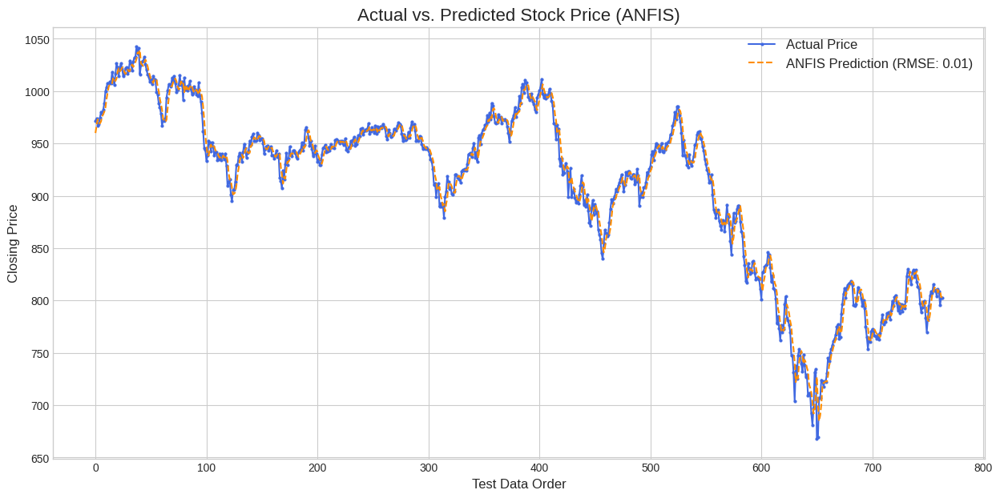


--- Comparison Table: Actual vs. Predicted Prices ---
    Actual_Price  Predicted_Price      Error
0     971.549988       969.005295   2.544693
1     974.039978       969.596425   4.443553
2     967.130005       973.352734   6.222729
3     968.479980       967.656113   0.823867
4     974.460022       968.421132   6.038890
5     980.250000       972.941390   7.308610
6     978.630005       978.294308   0.335697
7     981.989990       977.862857   4.127133
8     988.609985       980.952442   7.657544
9     999.950012       986.560618  13.389395
10   1003.770020       996.701433   7.068587
11   1007.799988      1001.246204   6.553784
12   1007.140015      1005.736135   1.403880
13   1008.710022      1005.796094   2.913928
14   1007.799988      1007.348048   0.451940

--- Statistics of Prediction Error ---
count    764.000000
mean       6.726442
std        6.046551
min        0.030946
25%        2.424671
50%        5.304660
75%        9.092639
max       67.866291
Name: Error, dtype: float

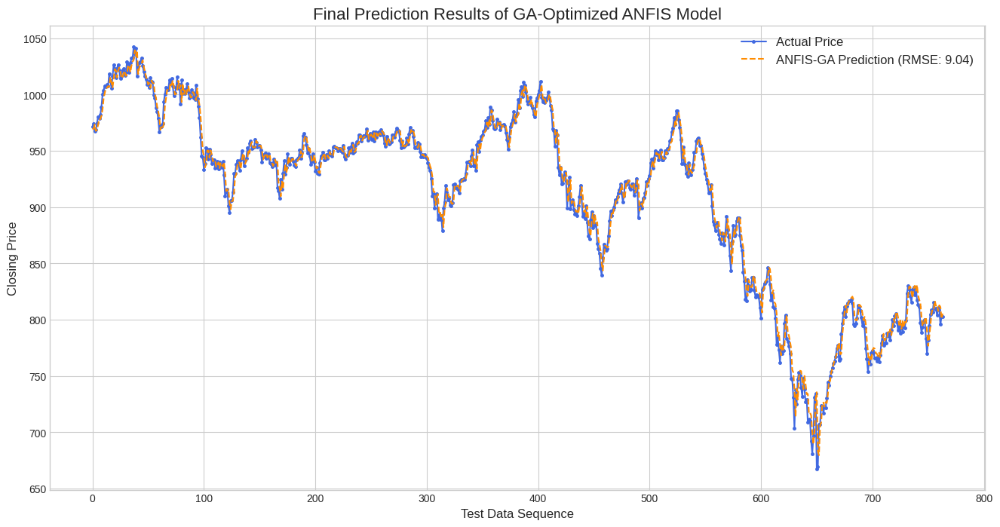

In [ ]:
# ===================================================================
# CELL 5: PREDICTION COMPARISON TABLE & PLOTTING
# ===================================================================
import matplotlib.pyplot as plt

# Create a DataFrame for easy comparison
comparison_df = pd.DataFrame({
    'Actual_Price': y_test_original,
    'Predicted_Price': final_predictions_original
})
comparison_df['Error'] = abs(comparison_df['Actual_Price'] - comparison_df['Predicted_Price'])

print("\n--- Comparison Table: Actual vs. Predicted Prices ---")
print(comparison_df.head(15))

print("\n--- Statistics of Prediction Error ---")
print(comparison_df['Error'].describe())

# --- Plot the Final Results ---
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(16, 8))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=5, linestyle='-')
plt.plot(final_predictions_original, label=f'ANFIS-GA Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Final Prediction Results of GA-Optimized ANFIS Model', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Sequence', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()

## GA ANFIS (`n_pop` = 20;`ngen`=30)

In [ ]:
pip install deap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 136.0/136.0 kB 4.6 MB/s eta 0:00:00


In [ ]:
# ===================================================================
# CELL 1: UNIFIED DATA PREPARATION PIPELINE
# ===================================================================

def create_modeling_pipeline(dataframe, split_ratio=0.8):
    """
    A unified function to prepare data for modeling. It splits the data,
    verifies date ranges, scales features and target, and returns
    all necessary components.
    """
    # Ensure the 'Date' column is in datetime format
    dataframe['Date'] = pd.to_datetime(dataframe['Date'])

    # --- 1. Chronological Splitting ---
    split_index = int(len(dataframe) * split_ratio)
    train_df = dataframe.iloc[:split_index]
    test_df = dataframe.iloc[split_index:]

    print(f"Data split chronologically:")
    print(f" - Training set contains: {len(train_df)} rows")
    print(f" - Testing set contains:  {len(test_df)} rows")

    # --- 2. Date Range Verification ---
    start_date_train = train_df['Date'].iloc[0].strftime('%d %B %Y')
    end_date_train = train_df['Date'].iloc[-1].strftime('%d %B %Y')
    start_date_test = test_df['Date'].iloc[0].strftime('%d %B %Y')
    end_date_test = test_df['Date'].iloc[-1].strftime('%d %B %Y')

    print("\n--- 📅 Date Range Verification (80/20 Split) ---")
    print(f"Training data spans from: {start_date_train} to {end_date_train}")
    print(f"Testing data spans from:  {start_date_test} to {end_date_test}")
    print("-" * 60)

    # --- 3. Feature and Target Separation ---
    X_train_df = train_df.drop(columns=["Close(t)", "Date"])
    y_train_original = train_df["Close(t)"].values
    X_test_df = test_df.drop(columns=["Close(t)", "Date"])
    y_test_original = test_df["Close(t)"].values

    # --- 4. Scaling ---
    scaler_x = MinMaxScaler().fit(X_train_df)
    scaler_y = MinMaxScaler().fit(y_train_original.reshape(-1, 1))
    x_train_scaled = scaler_x.transform(X_train_df)
    x_test_scaled = scaler_x.transform(X_test_df)
    y_train_scaled = scaler_y.transform(y_train_original.reshape(-1, 1)).ravel()

    # --- 5. Final Dimension Check ---
    print("\n--- Final Data Dimensions for Model ---")
    print(f"x_train_scaled shape: {x_train_scaled.shape}")
    print(f"y_train_scaled shape: {y_train_scaled.shape}")
    print(f"x_test_scaled shape:  {x_test_scaled.shape}")
    print(f"y_test_original shape: {y_test_original.shape}")
    print("\n✅ Data preparation is complete and ready for the GA-ANFIS model.")

    return x_train_scaled, x_test_scaled, y_train_scaled, y_train_original, y_test_original, scaler_y

# --- HOW TO USE ---
# Assuming 'lagged_df' is your dataframe from the previous step
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

Data split chronologically:
 - Training set contains: 3055 rows
 - Testing set contains:  764 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 20 July 2022
Testing data spans from:  21 July 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3055, 3)
y_train_scaled shape: (3055,)
x_test_scaled shape:  (764, 3)
y_test_original shape: (764,)

✅ Data preparation is complete and ready for the GA-ANFIS model.


In [ ]:
# ===================================================================
# CELL 2: GA FITNESS FUNCTION & CONFIGURATION
# ===================================================================
import random
from deap import base, creator, tools, algorithms
from datetime import datetime

# Create a scaled version of the test target for fitness evaluation
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

def evaluate_anfis(individual):
    """
    Fitness function for the GA. It evaluates a set of hyperparameters
    by training an ANFIS model and returning its SCALED RMSE on the test set.
    """
    n_mfs, epochs, learning_rate = int(individual[0]), int(individual[1]), individual[2]
    print(f"Trying: n_mfs={n_mfs}, epochs={epochs}, lr={learning_rate:.4f}")

    model = ANFIS(n_inputs=x_train.shape[1], n_mfs=n_mfs, epochs=epochs, learning_rate=learning_rate)
    model.fit(x_train, y_train_scaled)

    predictions_scaled = model.predict(x_test)
    rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))
    print(f"--> Resulting Scaled RMSE: {rmse_scaled:.4f}\n")
    return (rmse_scaled,) # Return as a tuple for DEAP

# --- Configure the Genetic Algorithm ---
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individual", list, fitness=creator.FitnessMin)
toolbox = base.Toolbox()

# Define the search space for hyperparameters (CHROMOSOME)
LOWER_BOUNDS = [1, 50, 0.0005]
UPPER_BOUNDS = [3, 200, 0.01]

# Register attribute generators
toolbox.register("attr_n_mfs", random.randint, LOWER_BOUNDS[0], UPPER_BOUNDS[0])
toolbox.register("attr_epochs", random.randint, LOWER_BOUNDS[1], UPPER_BOUNDS[1])
toolbox.register("attr_lr", random.uniform, LOWER_BOUNDS[2], UPPER_BOUNDS[2])

# Register individual and population generators
toolbox.register("individual", tools.initCycle, creator.Individual,
                 (toolbox.attr_n_mfs, toolbox.attr_epochs, toolbox.attr_lr), n=1)
toolbox.register("population", tools.initRepeat, list, toolbox.individual)

# Custom mutation function to handle mixed integer/float types
def customMutation(individual, indpb):
    if random.random() < indpb: individual[0] = random.randint(LOWER_BOUNDS[0], UPPER_BOUNDS[0])
    if random.random() < indpb: individual[1] = random.randint(LOWER_BOUNDS[1], UPPER_BOUNDS[1])
    if random.random() < indpb: individual[2] = random.uniform(LOWER_BOUNDS[2], UPPER_BOUNDS[2])
    return individual,

# Register genetic operators
toolbox.register("evaluate", evaluate_anfis)
toolbox.register("mate", tools.cxTwoPoint)
toolbox.register("mutate", customMutation, indpb=0.2)
toolbox.register("select", tools.selTournament, tournsize=3)

In [ ]:
# ===================================================================
# CELL 3: RUN GENETIC ALGORITHM OPTIMIZATION
# ===================================================================
print("🚀 Starting ANFIS Optimization with Genetic Algorithm...")
start_time_ga = datetime.now()

# Initialize population and tools
pop = toolbox.population(n=20) # Population size
hof = tools.HallOfFame(1)      # Stores the single best individual
stats = tools.Statistics(lambda ind: ind.fitness.values)
stats.register("avg", np.mean)
stats.register("min", np.min)

# Run the evolutionary algorithm
algorithms.eaSimple(pop, toolbox, cxpb=0.6, mutpb=0.2, ngen=30, # Number of generations
                    stats=stats, halloffame=hof, verbose=True)

print(f"\nGA Optimization Time: {datetime.now() - start_time_ga}")

# --- Extract and Display Best Results ---
best_params = hof[0]
best_n_mfs, best_epochs, best_lr = int(best_params[0]), int(best_params[1]), best_params[2]
best_scaled_rmse = hof[0].fitness.values[0]

print("\n--- BEST OPTIMIZATION RESULTS ---")
print(f"Best Scaled RMSE Found: {best_scaled_rmse:.4f}")
print(f"Best Hyperparameter Combination:")
print(f"  - n_mfs: {best_n_mfs}")
print(f"  - epochs: {best_epochs}")
print(f"  - learning_rate: {best_lr:.4f}")

Streaming output truncated to the last 5000 lines.
Epoch 11/197 completed.
Epoch 12/197 completed.
Epoch 13/197 completed.
Epoch 14/197 completed.
Epoch 15/197 completed.
Epoch 16/197 completed.
Epoch 17/197 completed.
Epoch 18/197 completed.
Epoch 19/197 completed.
Epoch 20/197 completed.
Epoch 21/197 completed.
Epoch 22/197 completed.
Epoch 23/197 completed.
Epoch 24/197 completed.
Epoch 25/197 completed.
Epoch 26/197 completed.
Epoch 27/197 completed.
Epoch 28/197 completed.
Epoch 29/197 completed.
Epoch 30/197 completed.
Epoch 31/197 completed.
Epoch 32/197 completed.
Epoch 33/197 completed.
Epoch 34/197 completed.
Epoch 35/197 completed.
Epoch 36/197 completed.
Epoch 37/197 completed.
Epoch 38/197 completed.
Epoch 39/197 completed.
Epoch 40/197 completed.
Epoch 41/197 completed.
Epoch 42/197 completed.
Epoch 43/197 completed.
Epoch 44/197 completed.
Epoch 45/197 completed.
Epoch 46/197 completed.
Epoch 47/197 completed.
Epoch 48/197 completed.
Epoch 49/197 completed.
Epoch 50/197 

In [ ]:
# ===================================================================
# CELL 4: TRAIN FINAL MODEL & COMPREHENSIVE EVALUATION (Corrected)
# ===================================================================
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error
import numpy as np

print("\n--- Training Final Model with Best Parameters ---")
final_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=1,
    epochs=178,
    learning_rate=0.0011
)
final_model.fit(x_train, y_train_scaled)

# Make final predictions (scaled) and revert to the original price scale (unscaled)
final_predictions_scaled = final_model.predict(x_test)
final_predictions_original = scaler_y.inverse_transform(final_predictions_scaled.reshape(-1, 1)).ravel()

# ======================= METRIC CALCULATION STARTS HERE =======================

# --- Calculate Metrics on the SCALED Data ---
# BARU: Siapkan y_test versi scaled untuk perbandingan
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, final_predictions_scaled))


# --- Calculate All Metrics on the Original (UNSCALED) Data ---
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, final_predictions_original))
mape = mean_absolute_percentage_error(y_test_original, final_predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, final_predictions_original)

# NRMSE Calculation
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# MASE Calculation
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= DISPLAY ALL METRICS =======================

# --- Display All Final Performance Metrics ---
print("\n\n--- Final Model Performance (On Normalized Scale) ---")
print(f"Test RMSE (Scaled)  : {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Final Model Performance (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


--- Training Final Model with Best Parameters ---
Epoch 1/178 completed.
Epoch 2/178 completed.
Epoch 3/178 completed.
Epoch 4/178 completed.
Epoch 5/178 completed.
Epoch 6/178 completed.
Epoch 7/178 completed.
Epoch 8/178 completed.
Epoch 9/178 completed.
Epoch 10/178 completed.
Epoch 11/178 completed.
Epoch 12/178 completed.
Epoch 13/178 completed.
Epoch 14/178 completed.
Epoch 15/178 completed.
Epoch 16/178 completed.
Epoch 17/178 completed.
Epoch 18/178 completed.
Epoch 19/178 completed.
Epoch 20/178 completed.
Epoch 21/178 completed.
Epoch 22/178 completed.
Epoch 23/178 completed.
Epoch 24/178 completed.
Epoch 25/178 completed.
Epoch 26/178 completed.
Epoch 27/178 completed.
Epoch 28/178 completed.
Epoch 29/178 completed.
Epoch 30/178 completed.
Epoch 31/178 completed.
Epoch 32/178 completed.
Epoch 33/178 completed.
Epoch 34/178 completed.
Epoch 35/178 completed.
Epoch 36/178 completed.
Epoch 37/178 completed.
Epoch 38/178 completed.
Epoch 39/178 completed.
Epoch 40/178 completed

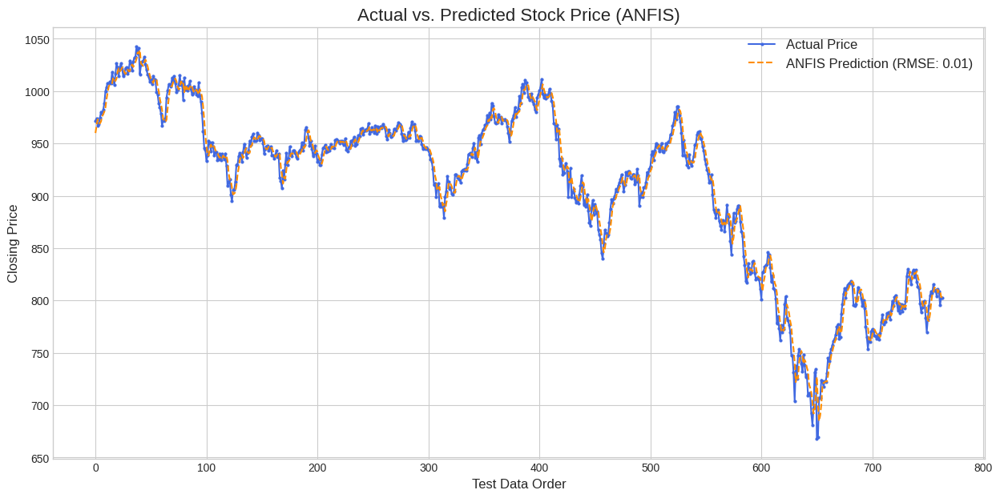


--- Comparison Table: Actual vs. Predicted Prices ---
    Actual_Price  Predicted_Price      Error
0     971.549988       946.237312  25.312676
1     974.039978       957.034474  17.005505
2     967.130005       973.102391   5.972386
3     968.479980       971.318591   2.838610
4     974.460022       971.559933   2.900089
5     980.250000       967.972499  12.277501
6     978.630005       970.837229   7.792776
7     981.989990       975.890730   6.099260
8     988.609985       979.709499   8.900487
9     999.950012       980.124408  19.825604
10   1003.770020       985.066842  18.703178
11   1007.799988       992.382931  15.417056
12   1007.140015      1001.146130   5.993885
13   1008.710022      1004.489726   4.220296
14   1007.799988      1007.167645   0.632343

--- Statistics of Prediction Error ---
count    764.000000
mean       9.523058
std        8.205003
min        0.004740
25%        3.501237
50%        7.362631
75%       13.294156
max       57.119451
Name: Error, dtype: float

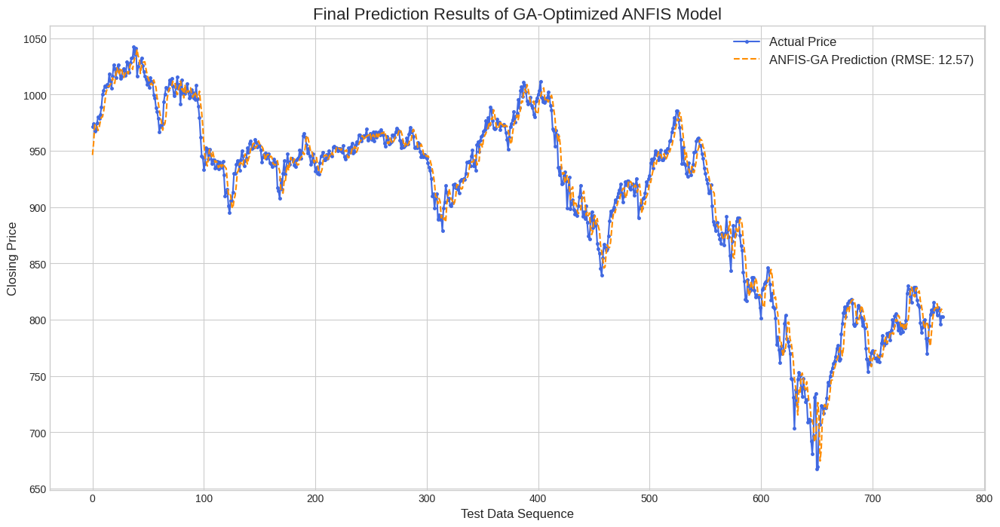

In [ ]:
# ===================================================================
# CELL 5: PREDICTION COMPARISON TABLE & PLOTTING
# ===================================================================
import matplotlib.pyplot as plt

# Create a DataFrame for easy comparison
comparison_df = pd.DataFrame({
    'Actual_Price': y_test_original,
    'Predicted_Price': final_predictions_original
})
comparison_df['Error'] = abs(comparison_df['Actual_Price'] - comparison_df['Predicted_Price'])

print("\n--- Comparison Table: Actual vs. Predicted Prices ---")
print(comparison_df.head(15))

print("\n--- Statistics of Prediction Error ---")
print(comparison_df['Error'].describe())

# --- Plot the Final Results ---
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(16, 8))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=5, linestyle='-')
plt.plot(final_predictions_original, label=f'ANFIS-GA Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Final Prediction Results of GA-Optimized ANFIS Model', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Sequence', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()

## 🗃️ EURO STOXX 50

In [ ]:
import yfinance as yf
import datetime

# 1. Mengambil data EURO STOXX 50
print("Mengunduh data EURO STOXX 50...")
stoxx_ticker = yf.Ticker('^STOXX50E')
euro_df = stoxx_ticker.history(start="2010-01-01", end="2025-09-30")
euro_df.to_csv('EURO_STOXX_50.csv')
print("✅ Data EURO STOXX 50 berhasil disimpan ke EURO_STOXX_50.csv")

Mengunduh data EURO STOXX 50...
✅ Data EURO STOXX 50 berhasil disimpan ke EURO_STOXX_50.csv


In [ ]:
euro_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3949 entries, 2010-01-04 00:00:00+01:00 to 2025-09-29 00:00:00+02:00
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Open          3949 non-null   float64
 1   High          3949 non-null   float64
 2   Low           3949 non-null   float64
 3   Close         3949 non-null   float64
 4   Volume        3949 non-null   int64  
 5   Dividends     3949 non-null   float64
 6   Stock Splits  3949 non-null   float64
dtypes: float64(6), int64(1)
memory usage: 246.8 KB


In [ ]:
euro_df

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2010-01-04 00:00:00+01:00,2974.860107,3017.800049,2974.860107,3017.800049,0,0.0,0.0
2010-01-05 00:00:00+01:00,3016.639893,3025.600098,3006.469971,3012.360107,0,0.0,0.0
2010-01-06 00:00:00+01:00,3010.889893,3016.830078,2997.050049,3009.659912,0,0.0,0.0
2010-01-07 00:00:00+01:00,3000.139893,3013.899902,2979.800049,3007.340088,0,0.0,0.0
2010-01-08 00:00:00+01:00,3012.969971,3024.580078,2993.729980,3017.850098,0,0.0,0.0
...,...,...,...,...,...,...,...
2025-09-23 00:00:00+02:00,5445.830078,5495.020020,5445.830078,5472.390137,16867200,0.0,0.0
2025-09-24 00:00:00+02:00,5472.089844,5481.930176,5450.120117,5464.560059,19178300,0.0,0.0
2025-09-25 00:00:00+02:00,5463.549805,5463.549805,5415.310059,5444.890137,17378500,0.0,0.0


#### 📈 Plot Closing Price Trends Over Time


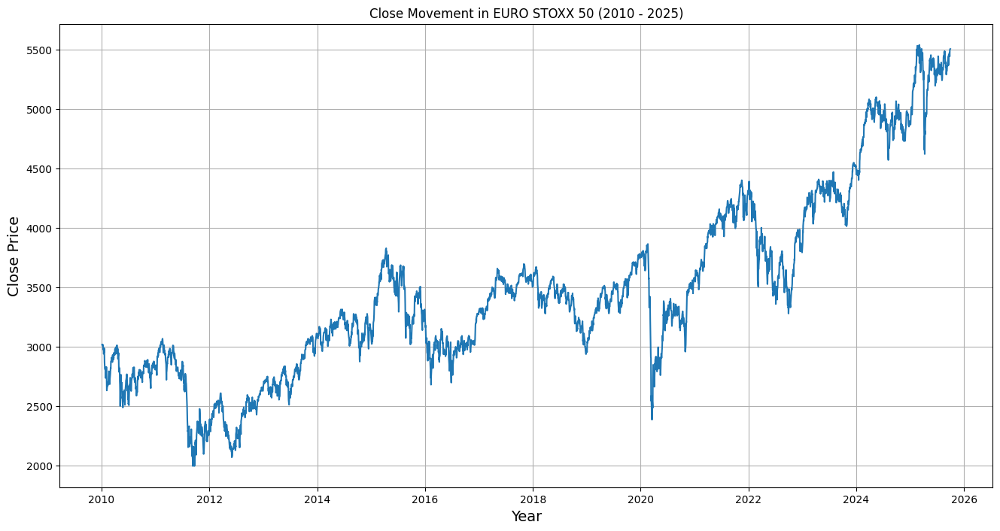

In [ ]:
plt.figure(figsize=(16, 8))
plt.title('Close Movement in EURO STOXX 50 (2010 - 2025)')
plt.plot(euro_df['Close'])
plt.xlabel('Year', fontsize=14)
plt.ylabel('Close Price', fontsize=14)
plt.grid(True)
plt.show()

### Lagged Features for Forecasting Model

Peramalan menggunakan data historis dalam urutan waktu tertentu untuk memperkirakan nilai di masa depan.

* (t-n), .. ,(t-2), (t-1), (t)
* Input features are (t-n), ..., (t-1)
* Output or label is (t)

In [ ]:
def create_lagged_features_with_date(data, n_lags=5):
    """
    Membuat fitur lagged dan menyimpan kolom 'Date' yang sesuai.
    """
    # ==== INI BAGIAN PERBAIKANNYA ====
    # Ubah indeks menjadi kolom 'Date'.
    df_with_date_col = data.reset_index()

    df_lagged = pd.DataFrame()
    # Membuat kolom fitur lagged (t-1, t-2, ..., t-n)
    for lag in range(1, n_lags + 1):
        df_lagged[f"Close(t-{lag})"] = df_with_date_col['Close'].shift(lag)

    # Menambahkan kolom target (t) dan kolom tanggal
    df_lagged['Close(t)'] = df_with_date_col['Close']
    df_lagged['Date'] = df_with_date_col['Date'] # Sekarang kode ini bisa berjalan

    # Buang baris NaN yang muncul akibat proses shift
    df_lagged = df_lagged.dropna().reset_index(drop=True)

    return df_lagged

# Terapkan fungsi baru
N_LAGS = 3
lagged_df = create_lagged_features_with_date(euro_df, n_lags=N_LAGS)

print("\n--- Data setelah dibuat 3 fitur lagged (dengan kolom Date) ---")
print(lagged_df.head())



--- Data setelah dibuat 3 fitur lagged (dengan kolom Date) ---
    Close(t-1)   Close(t-2)   Close(t-3)     Close(t)  \
0  3009.659912  3012.360107  3017.800049  3007.340088   
1  3007.340088  3009.659912  3012.360107  3017.850098   
2  3017.850098  3007.340088  3009.659912  3010.239990   
3  3010.239990  3017.850098  3007.340088  2976.889893   
4  2976.889893  3010.239990  3017.850098  2978.409912   

                       Date  
0 2010-01-07 00:00:00+01:00  
1 2010-01-08 00:00:00+01:00  
2 2010-01-11 00:00:00+01:00  
3 2010-01-12 00:00:00+01:00  
4 2010-01-13 00:00:00+01:00  


### 🧹 Data Preprocessing & Data Splitting

In [ ]:
# ===================================================================
# FINAL DATA PREPARATION PIPELINE
# ===================================================================

def create_modeling_pipeline(dataframe, split_ratio=0.8):
    """
    A unified function to prepare data for modeling. It splits the data,
    verifies date ranges, scales features and target, and returns
    all necessary components.

    Args:
        dataframe (pd.DataFrame): The input dataframe with lagged features and a 'Date' column.
        split_ratio (float): The proportion of data to be used for the training set.

    Returns:
        tuple: A tuple containing:
            - x_train_scaled (np.array)
            - x_test_scaled (np.array)
            - y_train_scaled (np.array)
            - y_train_original (np.array)
            - y_test_original (np.array)
            - scaler_y (MinMaxScaler object)
    """
    # Ensure the 'Date' column is in datetime format
    dataframe['Date'] = pd.to_datetime(dataframe['Date'])

    # --- 1. Chronological Splitting ---
    split_index = int(len(dataframe) * split_ratio)
    train_df = dataframe.iloc[:split_index]
    test_df = dataframe.iloc[split_index:]

    print(f"Data split chronologically:")
    print(f" - Training set contains: {len(train_df)} rows")
    print(f" - Testing set contains:  {len(test_df)} rows")

    # --- 2. Date Range Verification ---
    start_date_train = train_df['Date'].iloc[0].strftime('%d %B %Y')
    end_date_train = train_df['Date'].iloc[-1].strftime('%d %B %Y')
    start_date_test = test_df['Date'].iloc[0].strftime('%d %B %Y')
    end_date_test = test_df['Date'].iloc[-1].strftime('%d %B %Y')

    print("\n--- 📅 Date Range Verification (80/20 Split) ---")
    print(f"Training data spans from: {start_date_train} to {end_date_train}")
    print(f"Testing data spans from:  {start_date_test} to {end_date_test}")
    print("-" * 60)

    # --- 3. Feature and Target Separation ---
    X_train_df = train_df.drop(columns=["Close(t)", "Date"])
    y_train_original = train_df["Close(t)"].values

    X_test_df = test_df.drop(columns=["Close(t)", "Date"])
    y_test_original = test_df["Close(t)"].values

    # --- 4. Scaling ---
    # Scalers are fitted ONLY on the training data to prevent data leakage
    scaler_x = MinMaxScaler().fit(X_train_df)
    scaler_y = MinMaxScaler().fit(y_train_original.reshape(-1, 1))

    x_train_scaled = scaler_x.transform(X_train_df)
    x_test_scaled = scaler_x.transform(X_test_df)
    y_train_scaled = scaler_y.transform(y_train_original.reshape(-1, 1)).ravel()

    # --- 5. Final Dimension Check ---
    print("\n--- Final Data Dimensions for Model ---")
    print(f"x_train_scaled shape: {x_train_scaled.shape}")
    print(f"y_train_scaled shape: {y_train_scaled.shape}")
    print(f"x_test_scaled shape:  {x_test_scaled.shape}")
    print(f"y_test_original shape: {y_test_original.shape}")
    print("\n✅ Data preparation is complete and ready for the GA-ANFIS model.")

    return x_train_scaled, x_test_scaled, y_train_scaled, y_train_original, y_test_original, scaler_y

# HOW TO USE:
# Assuming 'lagged_df' is your dataframe from the previous step
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

Data split chronologically:
 - Training set contains: 3156 rows
 - Testing set contains:  790 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 08 August 2022
Testing data spans from:  09 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3156, 3)
y_train_scaled shape: (3156,)
x_test_scaled shape:  (790, 3)
y_test_original shape: (790,)

✅ Data preparation is complete and ready for the GA-ANFIS model.


In [ ]:
from datetime import datetime

## ANFIS

### n_mfs = 1

Data split chronologically:
 - Training set contains: 3156 rows
 - Testing set contains:  790 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 08 August 2022
Testing data spans from:  09 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3156, 3)
y_train_scaled shape: (3156,)
x_test_scaled shape:  (790, 3)
y_test_original shape: (790,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3156, 3), y=(3156,)
Testing data shape: X=(790, 3), y=(790,)

--- ANFIS Training Process ---
Epoch 1/50 completed.
Epoch 2/50 completed.
Epoch 3/50 completed.
Epoch 4/50 completed.
Epoch 5/50 completed.
Epoch 6/50 completed.
Epoch 7/50 completed.
Epoch 8/50 completed.
Epoch 9/50 completed.
Epoch 10/50 completed.
Epoch 11/50 completed.
Epoch 12/50 completed.
Epoch 13/50 completed.
Epoch 14/50 completed.
Epoch 15/

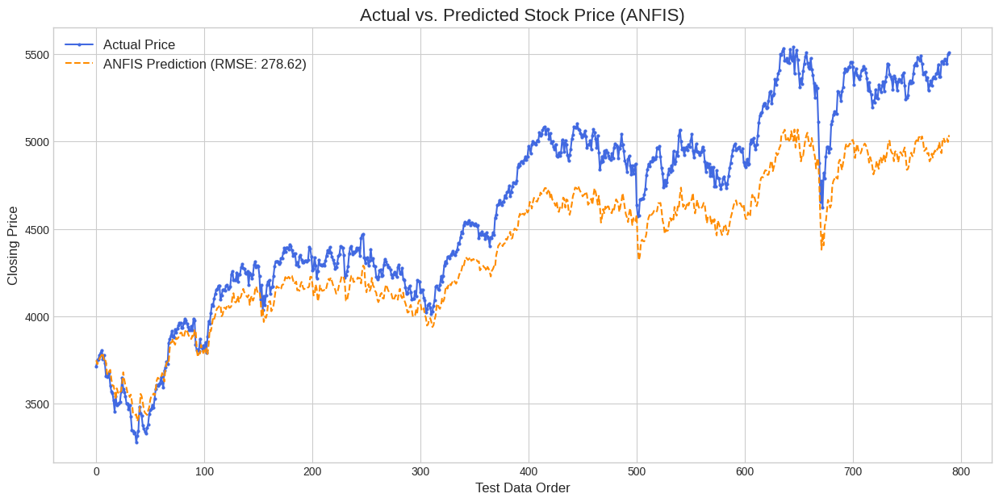

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=1,
    epochs=50,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

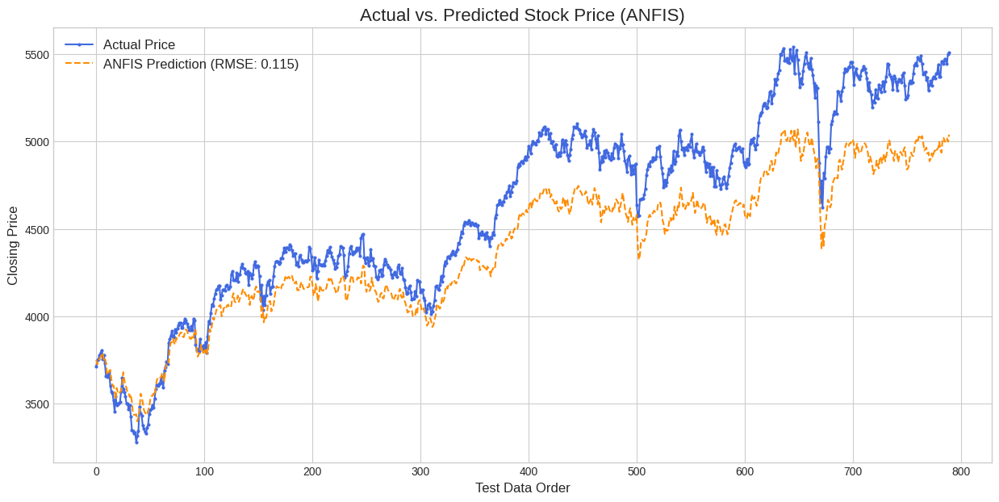

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 278.6170 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0   3715.370117     3748.769229  33.399112
1   3749.350098     3725.631394  23.718704
2   3757.050049     3741.215462  15.834586
3   3776.810059     3757.229444  19.580614
4   3789.620117     3768.261841  21.358276

--- Statistik Selisih (Error) ---
count    790.000000
mean     243.689702
std      135.151260
min        0.336689
25%      129.738446
50%      243.129132
75%      352.110034
max      536.944118
Name: Selisih, dtype: float64


### n_mfs = 2

Data split chronologically:
 - Training set contains: 3156 rows
 - Testing set contains:  790 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 08 August 2022
Testing data spans from:  09 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3156, 3)
y_train_scaled shape: (3156,)
x_test_scaled shape:  (790, 3)
y_test_original shape: (790,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3156, 3), y=(3156,)
Testing data shape: X=(790, 3), y=(790,)

--- ANFIS Training Process ---
Epoch 1/50 completed.
Epoch 2/50 completed.
Epoch 3/50 completed.
Epoch 4/50 completed.
Epoch 5/50 completed.
Epoch 6/50 completed.
Epoch 7/50 completed.
Epoch 8/50 completed.
Epoch 9/50 completed.
Epoch 10/50 completed.
Epoch 11/50 completed.
Epoch 12/50 completed.
Epoch 13/50 completed.
Epoch 14/50 completed.
Epoch 15/

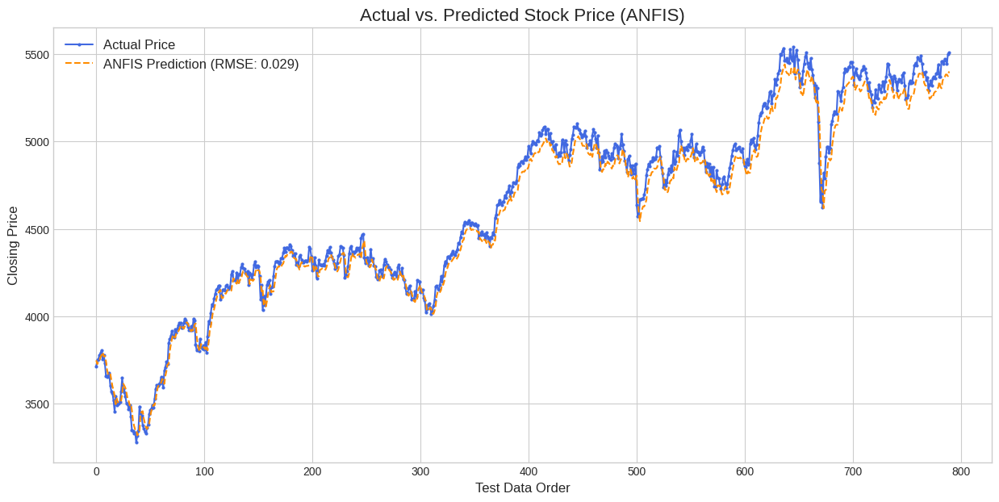

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=50,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

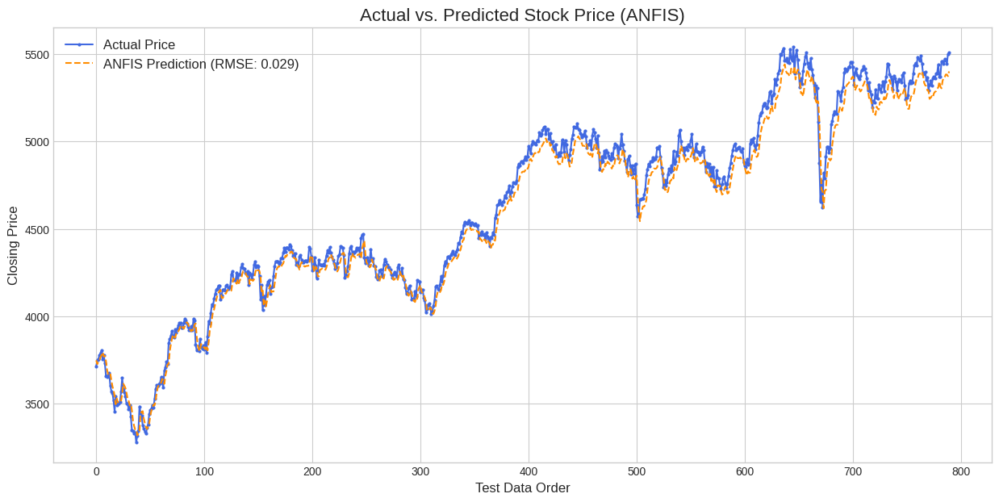

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 70.5078 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0   3715.370117     3748.387551  33.017434
1   3749.350098     3726.267379  23.082718
2   3757.050049     3741.893844  15.156205
3   3776.810059     3747.964720  28.845339
4   3789.620117     3766.190617  23.429501

--- Statistik Selisih (Error) ---
count    790.000000
mean      57.804806
std       40.398231
min        0.045137
25%       27.268672
50%       51.239582
75%       81.740815
max      279.301265
Name: Selisih, dtype: float64


### n_mfs = 3

Data split chronologically:
 - Training set contains: 3156 rows
 - Testing set contains:  790 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 08 August 2022
Testing data spans from:  09 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3156, 3)
y_train_scaled shape: (3156,)
x_test_scaled shape:  (790, 3)
y_test_original shape: (790,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3156, 3), y=(3156,)
Testing data shape: X=(790, 3), y=(790,)

--- ANFIS Training Process ---
Epoch 1/50 completed.
Epoch 2/50 completed.
Epoch 3/50 completed.
Epoch 4/50 completed.
Epoch 5/50 completed.
Epoch 6/50 completed.
Epoch 7/50 completed.
Epoch 8/50 completed.
Epoch 9/50 completed.
Epoch 10/50 completed.
Epoch 11/50 completed.
Epoch 12/50 completed.
Epoch 13/50 completed.
Epoch 14/50 completed.
Epoch 15/

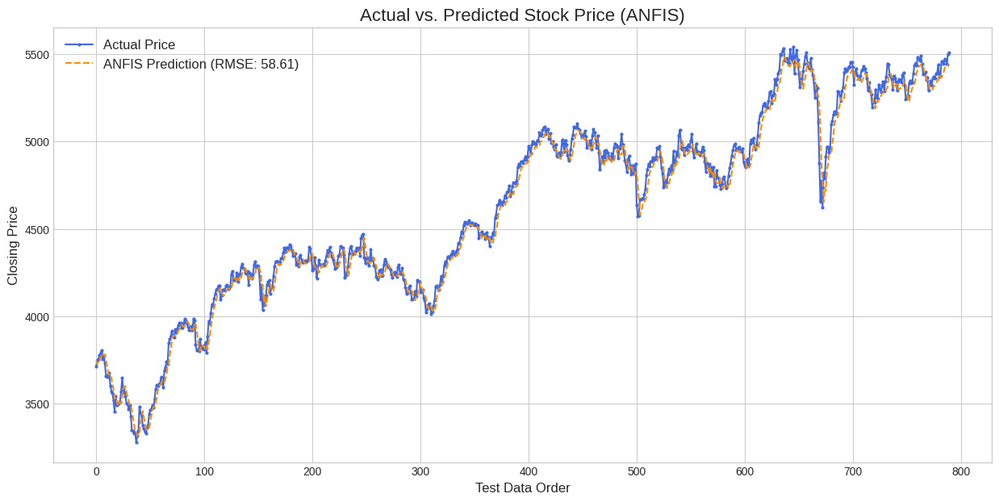

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=3,
    epochs=50,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

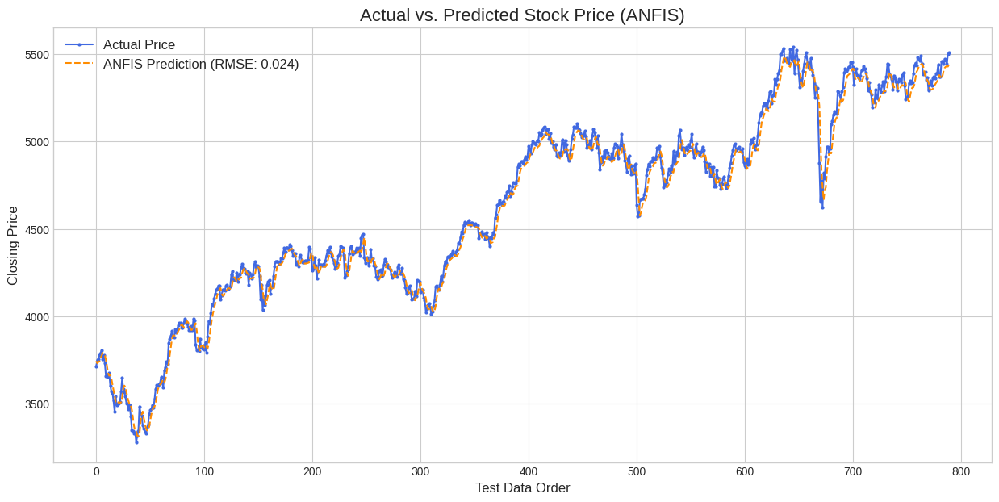

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 58.6141 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0   3715.370117     3747.324004  31.953887
1   3749.350098     3727.458439  21.891659
2   3757.050049     3742.746775  14.303274
3   3776.810059     3739.092297  37.717762
4   3789.620117     3760.698151  28.921966

--- Statistik Selisih (Error) ---
count    790.000000
mean      44.888388
std       37.715286
min        0.014512
25%       17.123650
50%       36.472993
75%       62.795623
max      402.752166
Name: Selisih, dtype: float64


### n_mfs = 4

Data split chronologically:
 - Training set contains: 3156 rows
 - Testing set contains:  790 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 08 August 2022
Testing data spans from:  09 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3156, 3)
y_train_scaled shape: (3156,)
x_test_scaled shape:  (790, 3)
y_test_original shape: (790,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3156, 3), y=(3156,)
Testing data shape: X=(790, 3), y=(790,)

--- ANFIS Training Process ---
Epoch 1/50 completed.
Epoch 2/50 completed.
Epoch 3/50 completed.
Epoch 4/50 completed.
Epoch 5/50 completed.
Epoch 6/50 completed.
Epoch 7/50 completed.
Epoch 8/50 completed.
Epoch 9/50 completed.
Epoch 10/50 completed.
Epoch 11/50 completed.
Epoch 12/50 completed.
Epoch 13/50 completed.
Epoch 14/50 completed.
Epoch 15/

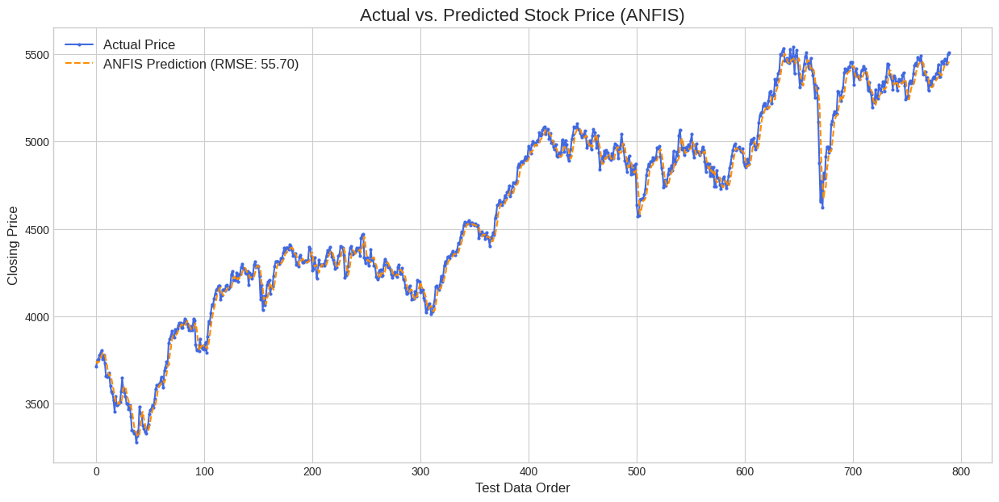

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=4,
    epochs=50,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

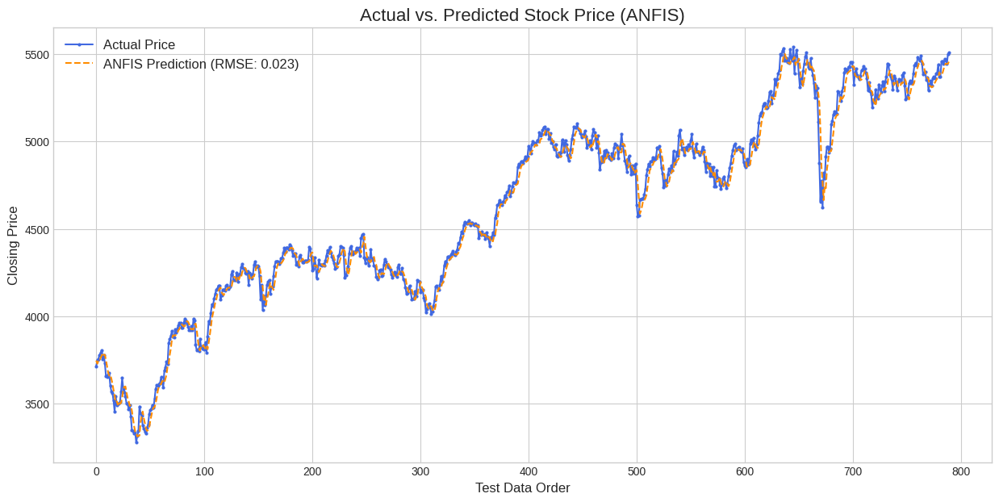

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 55.6953 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0   3715.370117     3745.375700  30.005583
1   3749.350098     3730.831094  18.519004
2   3757.050049     3740.036190  17.013859
3   3776.810059     3741.100389  35.709670
4   3789.620117     3761.160696  28.459421

--- Statistik Selisih (Error) ---
count    790.000000
mean      41.453395
std       37.220142
min        0.110658
25%       14.114423
50%       32.754104
75%       59.274035
max      412.848478
Name: Selisih, dtype: float64


### n_mfs = 5

Data split chronologically:
 - Training set contains: 3156 rows
 - Testing set contains:  790 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 08 August 2022
Testing data spans from:  09 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3156, 3)
y_train_scaled shape: (3156,)
x_test_scaled shape:  (790, 3)
y_test_original shape: (790,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3156, 3), y=(3156,)
Testing data shape: X=(790, 3), y=(790,)

--- ANFIS Training Process ---
Epoch 1/50 completed.
Epoch 2/50 completed.
Epoch 3/50 completed.
Epoch 4/50 completed.
Epoch 5/50 completed.
Epoch 6/50 completed.
Epoch 7/50 completed.
Epoch 8/50 completed.
Epoch 9/50 completed.
Epoch 10/50 completed.
Epoch 11/50 completed.
Epoch 12/50 completed.
Epoch 13/50 completed.
Epoch 14/50 completed.
Epoch 15/

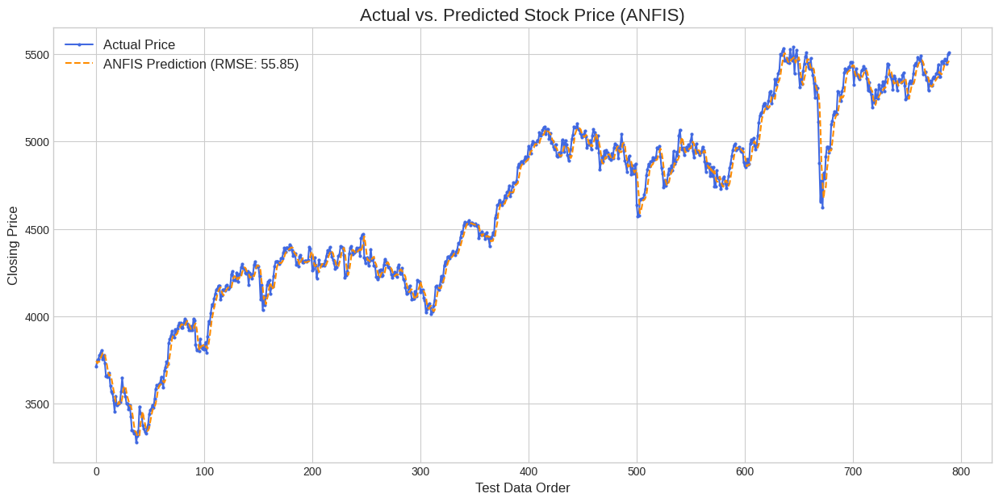

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=5,
    epochs=50,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 55.8466 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0   3715.370117     3745.516862  30.146745
1   3749.350098     3731.072621  18.277476
2   3757.050049     3740.407625  16.642424
3   3776.810059     3740.281529  36.528529
4   3789.620117     3760.751626  28.868491

--- Statistik Selisih (Error) ---
count    790.000000
mean      41.209827
std       37.714678
min        0.040866
25%       14.393034
50%       32.540914
75%       58.134610
max      426.151217
Name: Selisih, dtype: float64


## Pengujian Nilai Epoch
Menentukan seberapa "keras" atau seberapa lama model ANFIS berlatih.

### epoch = 50

Data split chronologically:
 - Training set contains: 3156 rows
 - Testing set contains:  790 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 08 August 2022
Testing data spans from:  09 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3156, 3)
y_train_scaled shape: (3156,)
x_test_scaled shape:  (790, 3)
y_test_original shape: (790,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3156, 3), y=(3156,)
Testing data shape: X=(790, 3), y=(790,)

--- ANFIS Training Process ---
Epoch 1/50 completed.
Epoch 2/50 completed.
Epoch 3/50 completed.
Epoch 4/50 completed.
Epoch 5/50 completed.
Epoch 6/50 completed.
Epoch 7/50 completed.
Epoch 8/50 completed.
Epoch 9/50 completed.
Epoch 10/50 completed.
Epoch 11/50 completed.
Epoch 12/50 completed.
Epoch 13/50 completed.
Epoch 14/50 completed.
Epoch 15/

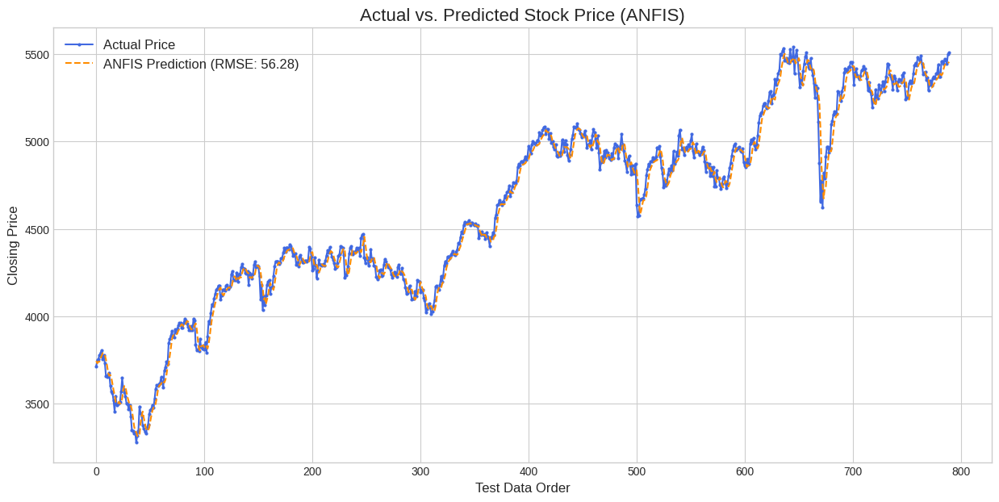

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=4,
    epochs=50,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

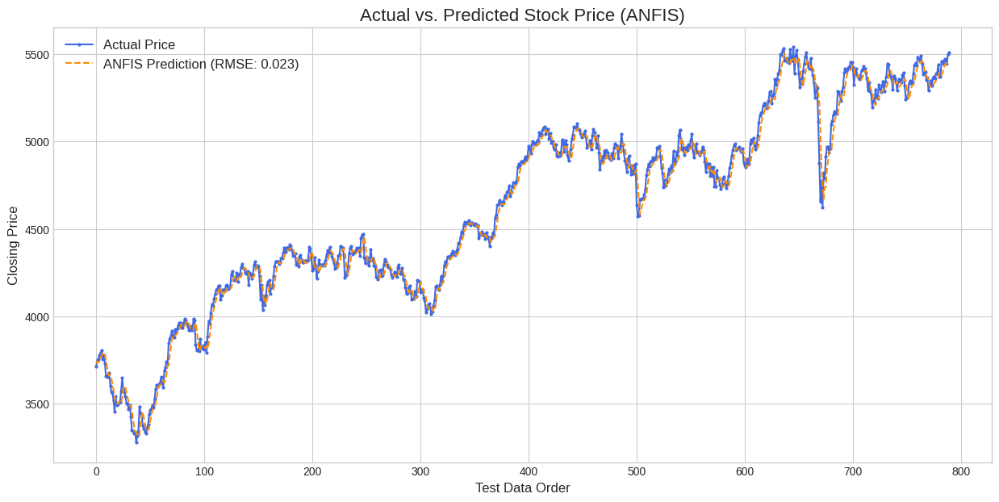

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 56.2826 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0   3715.370117     3744.948299  29.578182
1   3749.350098     3731.417623  17.932475
2   3757.050049     3739.676487  17.373561
3   3776.810059     3740.619685  36.190374
4   3789.620117     3760.658009  28.962108

--- Statistik Selisih (Error) ---
count    790.000000
mean      41.893123
std       37.609746
min        0.023675
25%       14.438292
50%       33.201437
75%       59.493297
max      419.402003
Name: Selisih, dtype: float64


### epoch = 100



Data split chronologically:
 - Training set contains: 3156 rows
 - Testing set contains:  790 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 08 August 2022
Testing data spans from:  09 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3156, 3)
y_train_scaled shape: (3156,)
x_test_scaled shape:  (790, 3)
y_test_original shape: (790,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3156, 3), y=(3156,)
Testing data shape: X=(790, 3), y=(790,)

--- ANFIS Training Process ---
Epoch 1/100 completed.
Epoch 2/100 completed.
Epoch 3/100 completed.
Epoch 4/100 completed.
Epoch 5/100 completed.
Epoch 6/100 completed.
Epoch 7/100 completed.
Epoch 8/100 completed.
Epoch 9/100 completed.
Epoch 10/100 completed.
Epoch 11/100 completed.
Epoch 12/100 completed.
Epoch 13/100 completed.
Epoch 14/100 comple

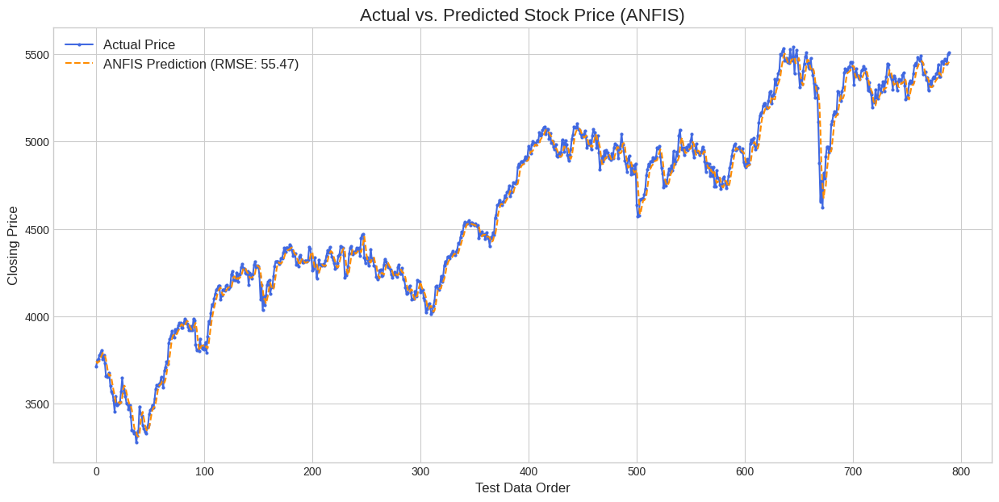

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=4,
    epochs=100,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

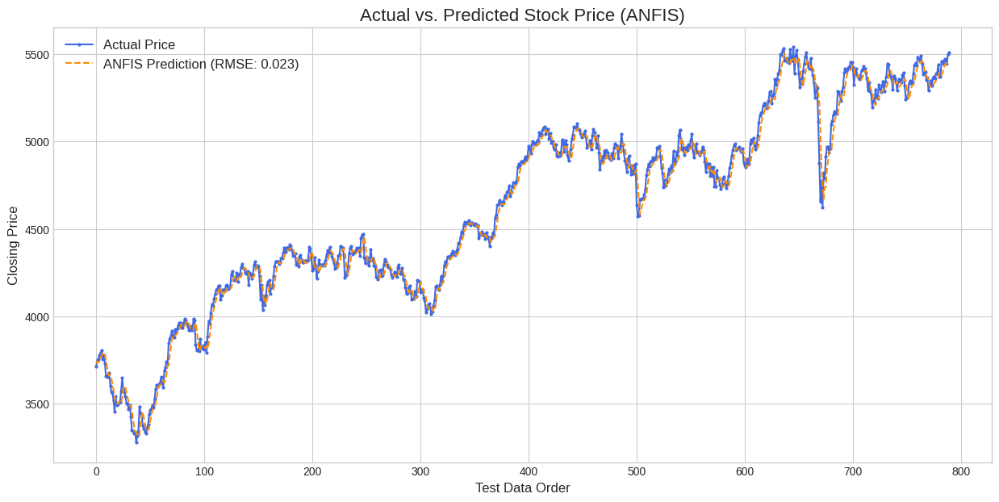

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 55.4675 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0   3715.370117     3744.196399  28.826282
1   3749.350098     3732.184457  17.165641
2   3757.050049     3738.425827  18.624221
3   3776.810059     3742.171771  34.638287
4   3789.620117     3761.281386  28.338731

--- Statistik Selisih (Error) ---
count    790.000000
mean      41.278911
std       37.073306
min        0.067021
25%       14.391389
50%       32.349495
75%       58.777635
max      408.237144
Name: Selisih, dtype: float64


### epoch = 150

Data split chronologically:
 - Training set contains: 3156 rows
 - Testing set contains:  790 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 08 August 2022
Testing data spans from:  09 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3156, 3)
y_train_scaled shape: (3156,)
x_test_scaled shape:  (790, 3)
y_test_original shape: (790,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3156, 3), y=(3156,)
Testing data shape: X=(790, 3), y=(790,)

--- ANFIS Training Process ---
Epoch 1/150 completed.
Epoch 2/150 completed.
Epoch 3/150 completed.
Epoch 4/150 completed.
Epoch 5/150 completed.
Epoch 6/150 completed.
Epoch 7/150 completed.
Epoch 8/150 completed.
Epoch 9/150 completed.
Epoch 10/150 completed.
Epoch 11/150 completed.
Epoch 12/150 completed.
Epoch 13/150 completed.
Epoch 14/150 comple

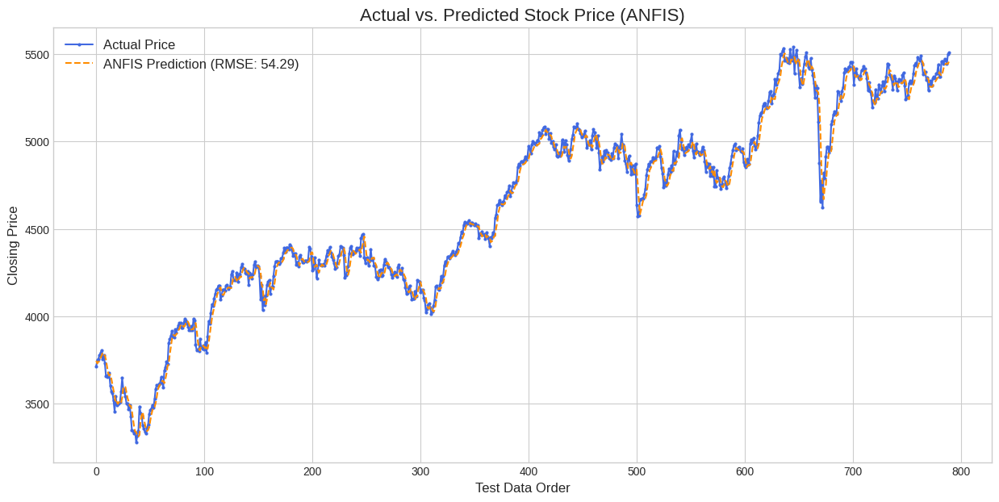

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=4,
    epochs=150,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

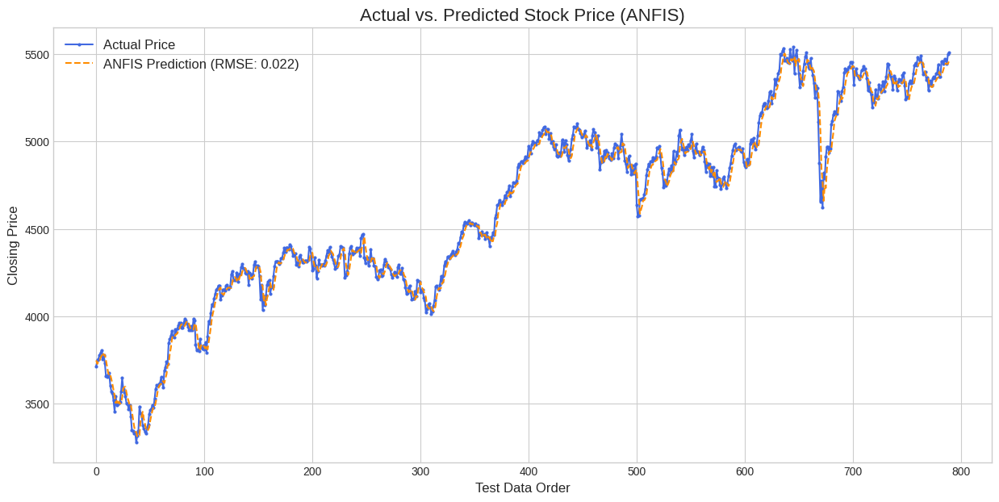

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 53.5349 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0   3715.370117     3745.358625  29.988508
1   3749.350098     3730.524666  18.825432
2   3757.050049     3739.252759  17.797290
3   3776.810059     3744.065730  32.744329
4   3789.620117     3763.017312  26.602806

--- Statistik Selisih (Error) ---
count    790.000000
mean      39.860968
std       35.758998
min        0.022118
25%       14.586103
50%       30.907875
75%       56.999231
max      384.862456
Name: Selisih, dtype: float64


## Pengujian Nilai Learning Rate
Pengaturan seberapa cepat model ANFIS belajar di setiap langkah.

[0.1, 0.05, 0.01, 0.005, 0.001]

### lr = 0.1

Data split chronologically:
 - Training set contains: 3156 rows
 - Testing set contains:  790 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 08 August 2022
Testing data spans from:  09 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3156, 3)
y_train_scaled shape: (3156,)
x_test_scaled shape:  (790, 3)
y_test_original shape: (790,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3156, 3), y=(3156,)
Testing data shape: X=(790, 3), y=(790,)

--- ANFIS Training Process ---
Epoch 1/150 completed.
Epoch 2/150 completed.
Epoch 3/150 completed.
Epoch 4/150 completed.
Epoch 5/150 completed.
Epoch 6/150 completed.
Epoch 7/150 completed.
Epoch 8/150 completed.
Epoch 9/150 completed.
Epoch 10/150 completed.
Epoch 11/150 completed.
Epoch 12/150 completed.
Epoch 13/150 completed.
Epoch 14/150 comple

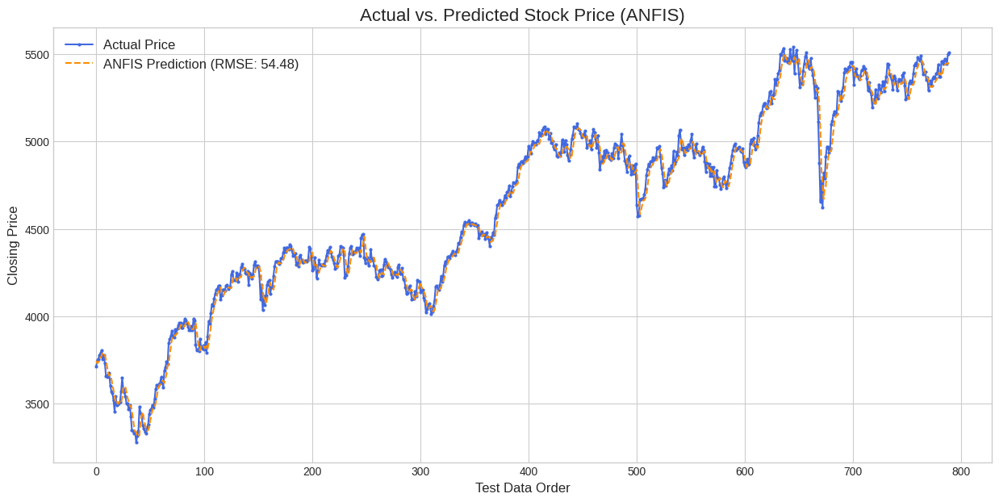

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=4,
    epochs=150,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

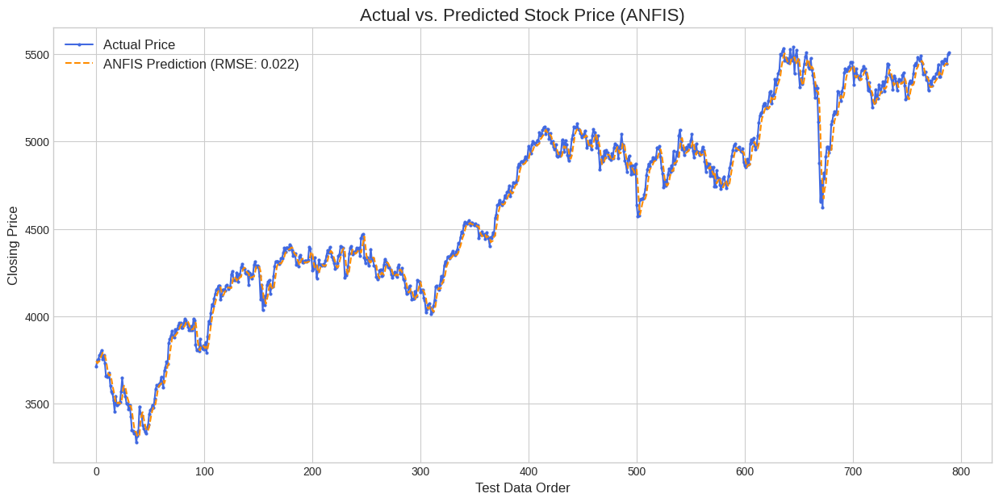

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 54.2205 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0   3715.370117     3745.443914  30.073796
1   3749.350098     3730.532222  18.817876
2   3757.050049     3739.614987  17.435061
3   3776.810059     3743.034496  33.775563
4   3789.620117     3762.408857  27.211260

--- Statistik Selisih (Error) ---
count    790.000000
mean      40.357150
std       36.232972
min        0.008556
25%       14.319901
50%       31.642104
75%       57.539402
max      394.222903
Name: Selisih, dtype: float64


### **lr = 0.05**

Data split chronologically:
 - Training set contains: 3156 rows
 - Testing set contains:  790 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 08 August 2022
Testing data spans from:  09 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3156, 3)
y_train_scaled shape: (3156,)
x_test_scaled shape:  (790, 3)
y_test_original shape: (790,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3156, 3), y=(3156,)
Testing data shape: X=(790, 3), y=(790,)

--- ANFIS Training Process ---
Epoch 1/150 completed.
Epoch 2/150 completed.
Epoch 3/150 completed.
Epoch 4/150 completed.
Epoch 5/150 completed.
Epoch 6/150 completed.
Epoch 7/150 completed.
Epoch 8/150 completed.
Epoch 9/150 completed.
Epoch 10/150 completed.
Epoch 11/150 completed.
Epoch 12/150 completed.
Epoch 13/150 completed.
Epoch 14/150 comple

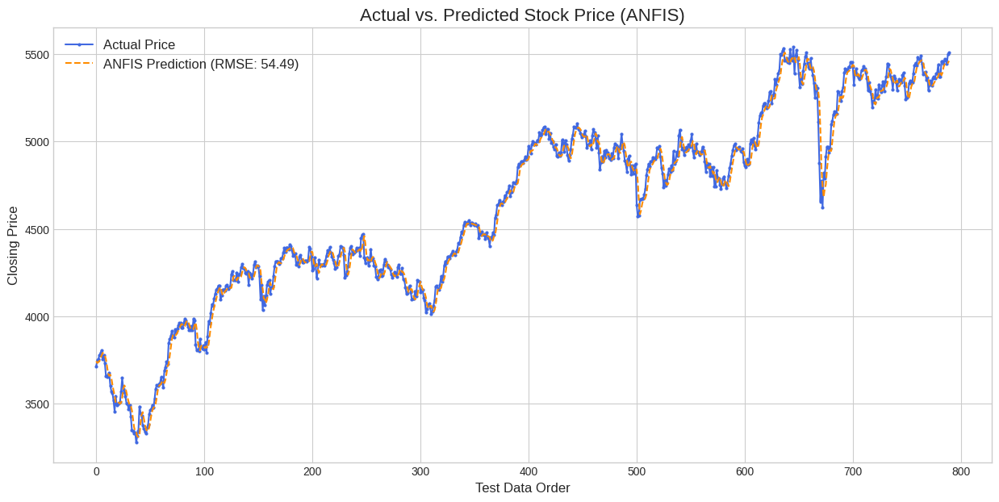

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=4,
    epochs=150,
    learning_rate=0.05
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

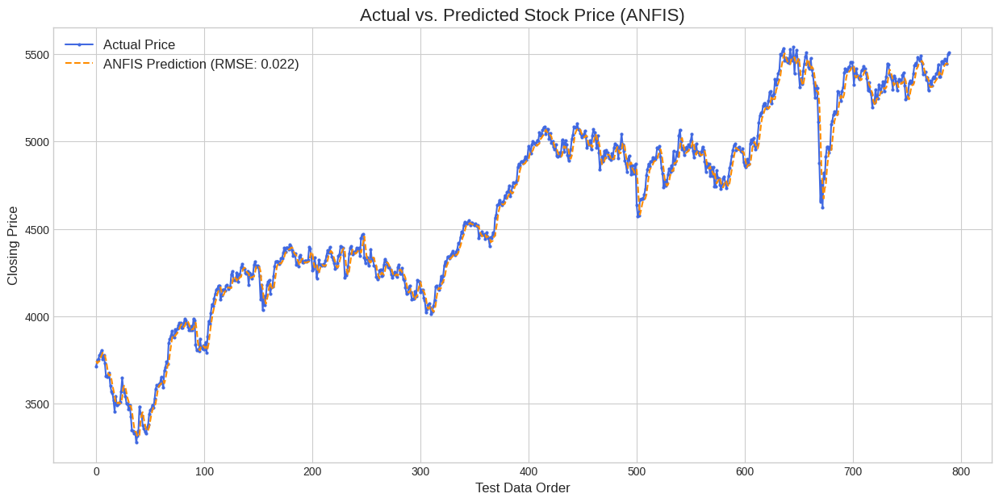

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 54.4943 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0   3715.370117     3743.830632  28.460514
1   3749.350098     3732.754255  16.595843
2   3757.050049     3737.767522  19.282527
3   3776.810059     3743.100439  33.709619
4   3789.620117     3761.737846  27.882271

--- Statistik Selisih (Error) ---
count    790.000000
mean      40.223948
std       36.788285
min        0.069674
25%       14.515342
50%       30.942958
75%       57.572152
max      406.644847
Name: Selisih, dtype: float64


### lr = 0.01

Data split chronologically:
 - Training set contains: 3156 rows
 - Testing set contains:  790 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 08 August 2022
Testing data spans from:  09 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3156, 3)
y_train_scaled shape: (3156,)
x_test_scaled shape:  (790, 3)
y_test_original shape: (790,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3156, 3), y=(3156,)
Testing data shape: X=(790, 3), y=(790,)

--- ANFIS Training Process ---
Epoch 1/150 completed.
Epoch 2/150 completed.
Epoch 3/150 completed.
Epoch 4/150 completed.
Epoch 5/150 completed.
Epoch 6/150 completed.
Epoch 7/150 completed.
Epoch 8/150 completed.
Epoch 9/150 completed.
Epoch 10/150 completed.
Epoch 11/150 completed.
Epoch 12/150 completed.
Epoch 13/150 completed.
Epoch 14/150 comple

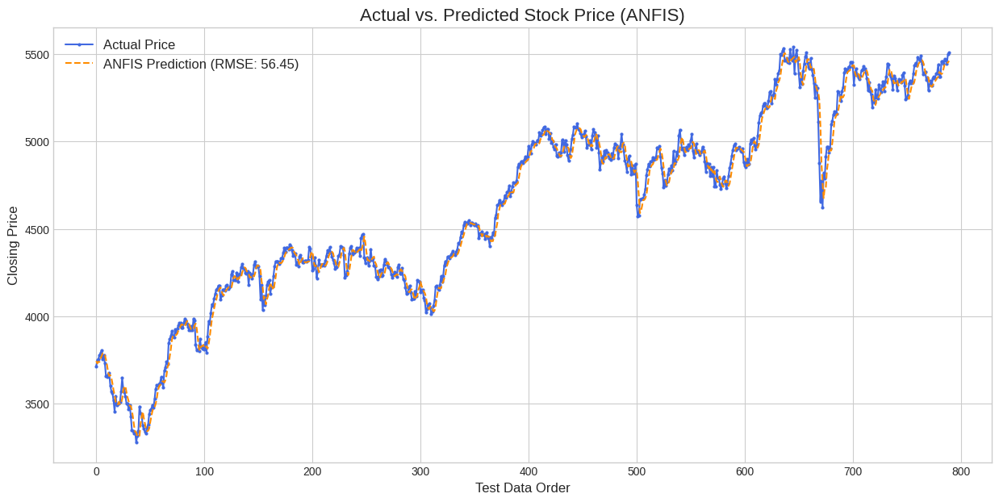

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=4,
    epochs=150,
    learning_rate= 0.01
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

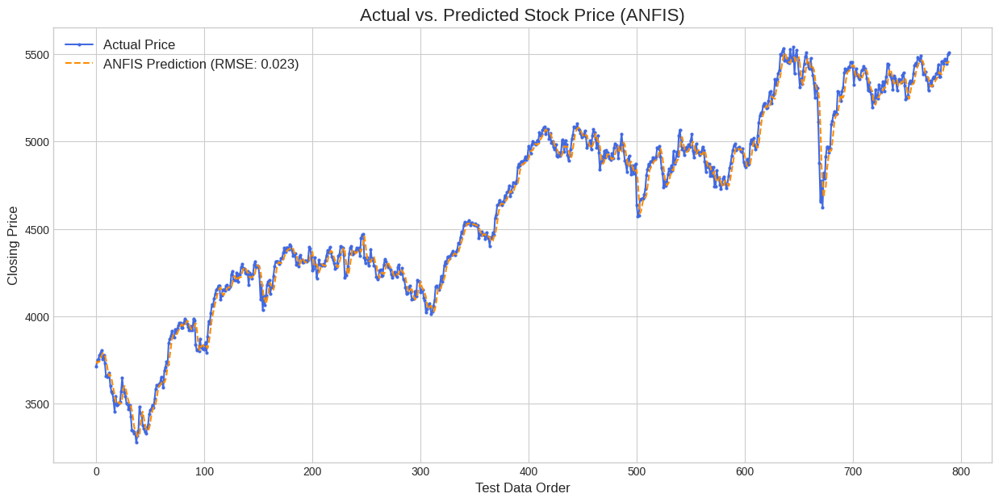

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 56.4476 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0   3715.370117     3744.593457  29.223339
1   3749.350098     3730.529402  18.820696
2   3757.050049     3739.629993  17.420056
3   3776.810059     3738.841399  37.968659
4   3789.620117     3759.504709  30.115408

--- Statistik Selisih (Error) ---
count    790.000000
mean      41.655168
std       38.118397
min        0.032307
25%       14.669211
50%       33.063400
75%       58.955619
max      433.337757
Name: Selisih, dtype: float64


### lr = 0.005

Data split chronologically:
 - Training set contains: 3156 rows
 - Testing set contains:  790 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 08 August 2022
Testing data spans from:  09 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3156, 3)
y_train_scaled shape: (3156,)
x_test_scaled shape:  (790, 3)
y_test_original shape: (790,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3156, 3), y=(3156,)
Testing data shape: X=(790, 3), y=(790,)

--- ANFIS Training Process ---
Epoch 1/150 completed.
Epoch 2/150 completed.
Epoch 3/150 completed.
Epoch 4/150 completed.
Epoch 5/150 completed.
Epoch 6/150 completed.
Epoch 7/150 completed.
Epoch 8/150 completed.
Epoch 9/150 completed.
Epoch 10/150 completed.
Epoch 11/150 completed.
Epoch 12/150 completed.
Epoch 13/150 completed.
Epoch 14/150 comple

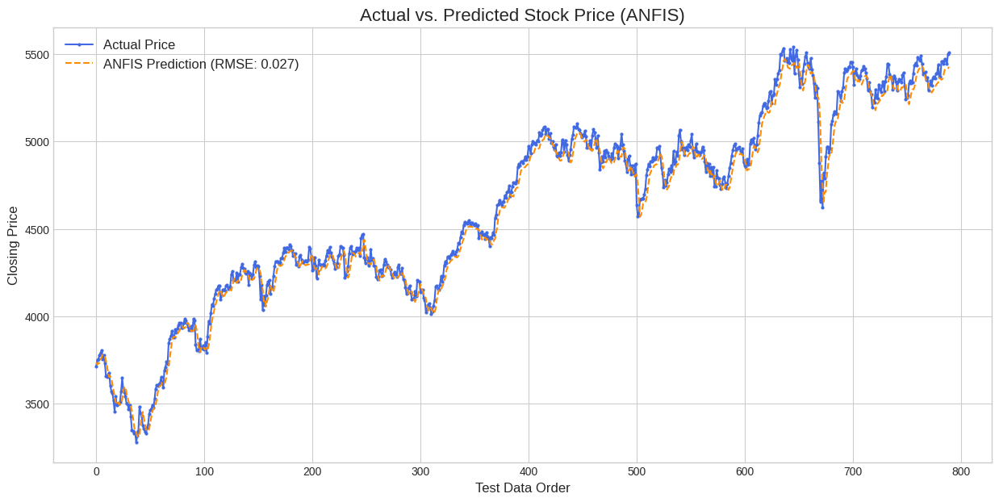

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=4,
    epochs=150,
    learning_rate= 0.005
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

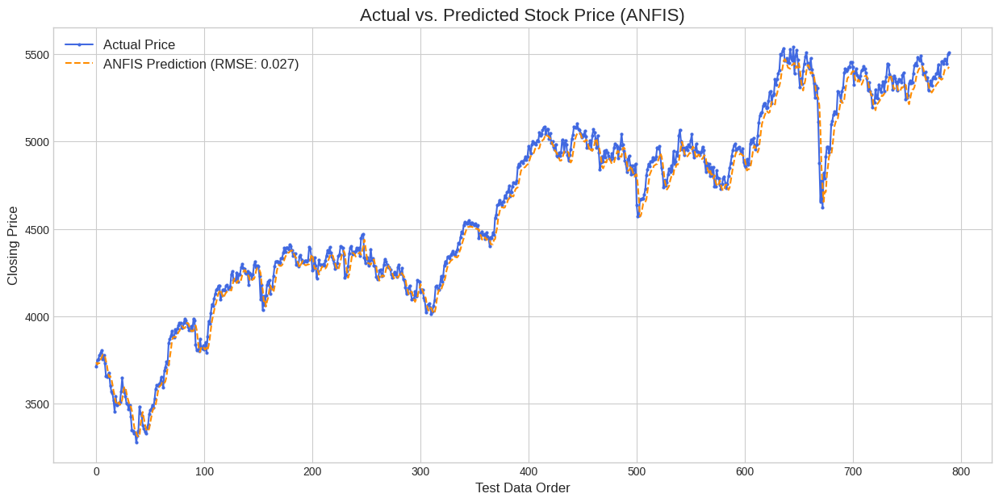

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 60.9321 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0   3715.370117     3739.342359  23.972242
1   3749.350098     3724.958477  24.391621
2   3757.050049     3734.183802  22.866247
3   3776.810059     3734.572058  42.238000
4   3789.620117     3754.660574  34.959543

--- Statistik Selisih (Error) ---
count    790.000000
mean      47.269186
std       38.473575
min        0.072369
25%       19.806784
50%       39.610463
75%       66.487110
max      400.498255
Name: Selisih, dtype: float64


### lr = 0.001

Data split chronologically:
 - Training set contains: 3156 rows
 - Testing set contains:  790 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 08 August 2022
Testing data spans from:  09 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3156, 3)
y_train_scaled shape: (3156,)
x_test_scaled shape:  (790, 3)
y_test_original shape: (790,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3156, 3), y=(3156,)
Testing data shape: X=(790, 3), y=(790,)

--- ANFIS Training Process ---
Epoch 1/150 completed.
Epoch 2/150 completed.
Epoch 3/150 completed.
Epoch 4/150 completed.
Epoch 5/150 completed.
Epoch 6/150 completed.
Epoch 7/150 completed.
Epoch 8/150 completed.
Epoch 9/150 completed.
Epoch 10/150 completed.
Epoch 11/150 completed.
Epoch 12/150 completed.
Epoch 13/150 completed.
Epoch 14/150 comple

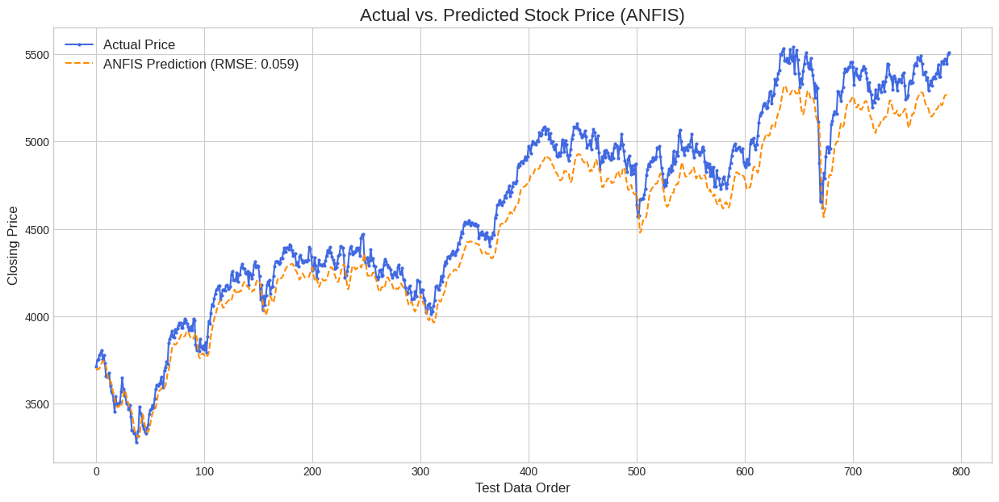

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=4,
    epochs=150,
    learning_rate=0.001
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

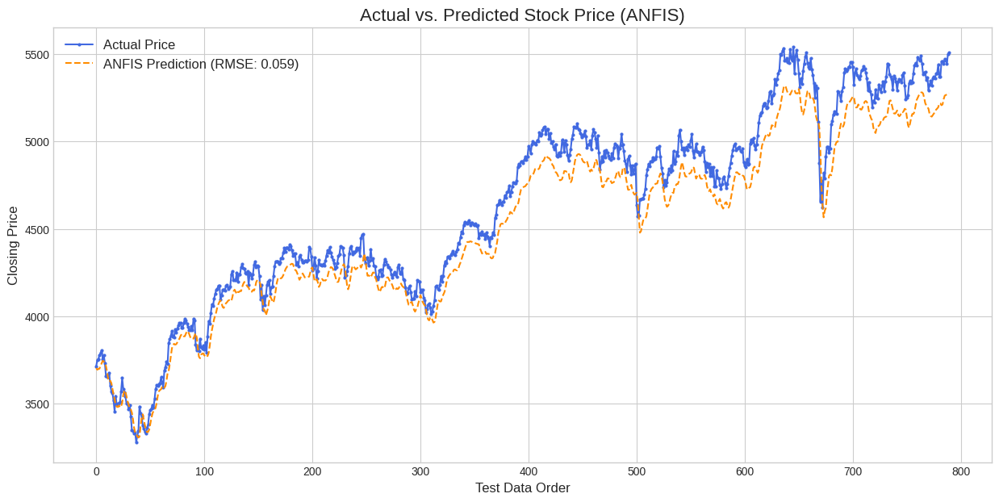

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 138.2551 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi    Selisih
0   3715.370117     3705.623424   9.746693
1   3749.350098     3695.311585  54.038512
2   3757.050049     3700.807046  56.243003
3   3776.810059     3701.891409  74.918650
4   3789.620117     3720.200002  69.420115

--- Statistik Selisih (Error) ---
count    790.000000
mean     123.250737
std       62.679252
min        0.200443
25%       75.323523
50%      122.458861
75%      166.882531
max      293.738062
Name: Selisih, dtype: float64


## GA ANFIS (`n_pop` = 10;`ngen`=10)

In [ ]:
pip install deap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 136.0/136.0 kB 4.1 MB/s eta 0:00:00


In [ ]:
# ===================================================================
# CELL 1: UNIFIED DATA PREPARATION PIPELINE
# ===================================================================

def create_modeling_pipeline(dataframe, split_ratio=0.8):
    """
    A unified function to prepare data for modeling. It splits the data,
    verifies date ranges, scales features and target, and returns
    all necessary components.
    """
    # Ensure the 'Date' column is in datetime format
    dataframe['Date'] = pd.to_datetime(dataframe['Date'])

    # --- 1. Chronological Splitting ---
    split_index = int(len(dataframe) * split_ratio)
    train_df = dataframe.iloc[:split_index]
    test_df = dataframe.iloc[split_index:]

    print(f"Data split chronologically:")
    print(f" - Training set contains: {len(train_df)} rows")
    print(f" - Testing set contains:  {len(test_df)} rows")

    # --- 2. Date Range Verification ---
    start_date_train = train_df['Date'].iloc[0].strftime('%d %B %Y')
    end_date_train = train_df['Date'].iloc[-1].strftime('%d %B %Y')
    start_date_test = test_df['Date'].iloc[0].strftime('%d %B %Y')
    end_date_test = test_df['Date'].iloc[-1].strftime('%d %B %Y')

    print("\n--- 📅 Date Range Verification (80/20 Split) ---")
    print(f"Training data spans from: {start_date_train} to {end_date_train}")
    print(f"Testing data spans from:  {start_date_test} to {end_date_test}")
    print("-" * 60)

    # --- 3. Feature and Target Separation ---
    X_train_df = train_df.drop(columns=["Close(t)", "Date"])
    y_train_original = train_df["Close(t)"].values
    X_test_df = test_df.drop(columns=["Close(t)", "Date"])
    y_test_original = test_df["Close(t)"].values

    # --- 4. Scaling ---
    scaler_x = MinMaxScaler().fit(X_train_df)
    scaler_y = MinMaxScaler().fit(y_train_original.reshape(-1, 1))
    x_train_scaled = scaler_x.transform(X_train_df)
    x_test_scaled = scaler_x.transform(X_test_df)
    y_train_scaled = scaler_y.transform(y_train_original.reshape(-1, 1)).ravel()

    # --- 5. Final Dimension Check ---
    print("\n--- Final Data Dimensions for Model ---")
    print(f"x_train_scaled shape: {x_train_scaled.shape}")
    print(f"y_train_scaled shape: {y_train_scaled.shape}")
    print(f"x_test_scaled shape:  {x_test_scaled.shape}")
    print(f"y_test_original shape: {y_test_original.shape}")
    print("\n✅ Data preparation is complete and ready for the GA-ANFIS model.")

    return x_train_scaled, x_test_scaled, y_train_scaled, y_train_original, y_test_original, scaler_y

# --- HOW TO USE ---
# Assuming 'lagged_df' is your dataframe from the previous step
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

Data split chronologically:
 - Training set contains: 3156 rows
 - Testing set contains:  790 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 08 August 2022
Testing data spans from:  09 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3156, 3)
y_train_scaled shape: (3156,)
x_test_scaled shape:  (790, 3)
y_test_original shape: (790,)

✅ Data preparation is complete and ready for the GA-ANFIS model.


In [ ]:
# ===================================================================
# CELL 2: GA FITNESS FUNCTION & CONFIGURATION
# ===================================================================
import random
from deap import base, creator, tools, algorithms
from datetime import datetime

# Create a scaled version of the test target for fitness evaluation
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

def evaluate_anfis(individual):
    """
    Fitness function for the GA. It evaluates a set of hyperparameters
    by training an ANFIS model and returning its SCALED RMSE on the test set.
    """
    n_mfs, epochs, learning_rate = int(individual[0]), int(individual[1]), individual[2]
    print(f"Trying: n_mfs={n_mfs}, epochs={epochs}, lr={learning_rate:.4f}")

    model = ANFIS(n_inputs=x_train.shape[1], n_mfs=n_mfs, epochs=epochs, learning_rate=learning_rate)
    model.fit(x_train, y_train_scaled)

    predictions_scaled = model.predict(x_test)
    rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))
    print(f"--> Resulting Scaled RMSE: {rmse_scaled:.4f}\n")
    return (rmse_scaled,) # Return as a tuple for DEAP

# --- Configure the Genetic Algorithm ---
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individual", list, fitness=creator.FitnessMin)
toolbox = base.Toolbox()

# Define the search space for hyperparameters (CHROMOSOME)
LOWER_BOUNDS = [1, 50, 0.005]
UPPER_BOUNDS = [5, 150, 0.01]

# Register attribute generators
toolbox.register("attr_n_mfs", random.randint, LOWER_BOUNDS[0], UPPER_BOUNDS[0])
toolbox.register("attr_epochs", random.randint, LOWER_BOUNDS[1], UPPER_BOUNDS[1])
toolbox.register("attr_lr", random.uniform, LOWER_BOUNDS[2], UPPER_BOUNDS[2])

# Register individual and population generators
toolbox.register("individual", tools.initCycle, creator.Individual,
                 (toolbox.attr_n_mfs, toolbox.attr_epochs, toolbox.attr_lr), n=1)
toolbox.register("population", tools.initRepeat, list, toolbox.individual)

# Custom mutation function to handle mixed integer/float types
def customMutation(individual, indpb):
    if random.random() < indpb: individual[0] = random.randint(LOWER_BOUNDS[0], UPPER_BOUNDS[0])
    if random.random() < indpb: individual[1] = random.randint(LOWER_BOUNDS[1], UPPER_BOUNDS[1])
    if random.random() < indpb: individual[2] = random.uniform(LOWER_BOUNDS[2], UPPER_BOUNDS[2])
    return individual,

# Register genetic operators
toolbox.register("evaluate", evaluate_anfis)
toolbox.register("mate", tools.cxTwoPoint)
toolbox.register("mutate", customMutation, indpb=0.2)
toolbox.register("select", tools.selTournament, tournsize=3)

In [ ]:
# ===================================================================
# CELL 3: RUN GENETIC ALGORITHM OPTIMIZATION
# ===================================================================
print("🚀 Starting ANFIS Optimization with Genetic Algorithm...")
start_time_ga = datetime.now()

# Initialize population and tools
pop = toolbox.population(n=10) # Population size
hof = tools.HallOfFame(1)      # Stores the single best individual
stats = tools.Statistics(lambda ind: ind.fitness.values)
stats.register("avg", np.mean)
stats.register("min", np.min)

# Run the evolutionary algorithm
algorithms.eaSimple(pop, toolbox, cxpb=0.6, mutpb=0.2, ngen=10, # Number of generations
                    stats=stats, halloffame=hof, verbose=True)

print(f"\nGA Optimization Time: {datetime.now() - start_time_ga}")

# --- Extract and Display Best Results ---
best_params = hof[0]
best_n_mfs, best_epochs, best_lr = int(best_params[0]), int(best_params[1]), best_params[2]
best_scaled_rmse = hof[0].fitness.values[0]

print("\n--- BEST OPTIMIZATION RESULTS ---")
print(f"Best Scaled RMSE Found: {best_scaled_rmse:.4f}")
print(f"Best Hyperparameter Combination:")
print(f"  - n_mfs: {best_n_mfs}")
print(f"  - epochs: {best_epochs}")
print(f"  - learning_rate: {best_lr:.4f}")

Streaming output truncated to the last 5000 lines.
Epoch 88/112 completed.
Epoch 89/112 completed.
Epoch 90/112 completed.
Epoch 91/112 completed.
Epoch 92/112 completed.
Epoch 93/112 completed.
Epoch 94/112 completed.
Epoch 95/112 completed.
Epoch 96/112 completed.
Epoch 97/112 completed.
Epoch 98/112 completed.
Epoch 99/112 completed.
Epoch 100/112 completed.
Epoch 101/112 completed.
Epoch 102/112 completed.
Epoch 103/112 completed.
Epoch 104/112 completed.
Epoch 105/112 completed.
Epoch 106/112 completed.
Epoch 107/112 completed.
Epoch 108/112 completed.
Epoch 109/112 completed.
Epoch 110/112 completed.
Epoch 111/112 completed.
Epoch 112/112 completed.
--> Resulting Scaled RMSE: 0.0241

3  	8     	0.0229824	0.0211707
Trying: n_mfs=2, epochs=112, lr=0.0095
Epoch 1/112 completed.
Epoch 2/112 completed.
Epoch 3/112 completed.
Epoch 4/112 completed.
Epoch 5/112 completed.
Epoch 6/112 completed.
Epoch 7/112 completed.
Epoch 8/112 completed.
Epoch 9/112 completed.
Epoch 10/112 completed.


In [ ]:
# ===================================================================
# CELL 4: TRAIN FINAL MODEL & COMPREHENSIVE EVALUATION (Corrected)
# ===================================================================
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error
import numpy as np

print("\n--- Training Final Model with Best Parameters ---")
final_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=112,
    learning_rate=0.0095
)
final_model.fit(x_train, y_train_scaled)

# Make final predictions (scaled) and revert to the original price scale (unscaled)
final_predictions_scaled = final_model.predict(x_test)
final_predictions_original = scaler_y.inverse_transform(final_predictions_scaled.reshape(-1, 1)).ravel()

# ======================= METRIC CALCULATION STARTS HERE =======================

# --- Calculate Metrics on the SCALED Data ---
# BARU: Siapkan y_test versi scaled untuk perbandingan
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, final_predictions_scaled))


# --- Calculate All Metrics on the Original (UNSCALED) Data ---
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, final_predictions_original))
mape = mean_absolute_percentage_error(y_test_original, final_predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, final_predictions_original)

# NRMSE Calculation
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# MASE Calculation
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= DISPLAY ALL METRICS =======================

# --- Display All Final Performance Metrics ---
print("\n\n--- Final Model Performance (On Normalized Scale) ---")
print(f"Test RMSE (Scaled)  : {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Final Model Performance (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


--- Training Final Model with Best Parameters ---
Epoch 1/112 completed.
Epoch 2/112 completed.
Epoch 3/112 completed.
Epoch 4/112 completed.
Epoch 5/112 completed.
Epoch 6/112 completed.
Epoch 7/112 completed.
Epoch 8/112 completed.
Epoch 9/112 completed.
Epoch 10/112 completed.
Epoch 11/112 completed.
Epoch 12/112 completed.
Epoch 13/112 completed.
Epoch 14/112 completed.
Epoch 15/112 completed.
Epoch 16/112 completed.
Epoch 17/112 completed.
Epoch 18/112 completed.
Epoch 19/112 completed.
Epoch 20/112 completed.
Epoch 21/112 completed.
Epoch 22/112 completed.
Epoch 23/112 completed.
Epoch 24/112 completed.
Epoch 25/112 completed.
Epoch 26/112 completed.
Epoch 27/112 completed.
Epoch 28/112 completed.
Epoch 29/112 completed.
Epoch 30/112 completed.
Epoch 31/112 completed.
Epoch 32/112 completed.
Epoch 33/112 completed.
Epoch 34/112 completed.
Epoch 35/112 completed.
Epoch 36/112 completed.
Epoch 37/112 completed.
Epoch 38/112 completed.
Epoch 39/112 completed.
Epoch 40/112 completed

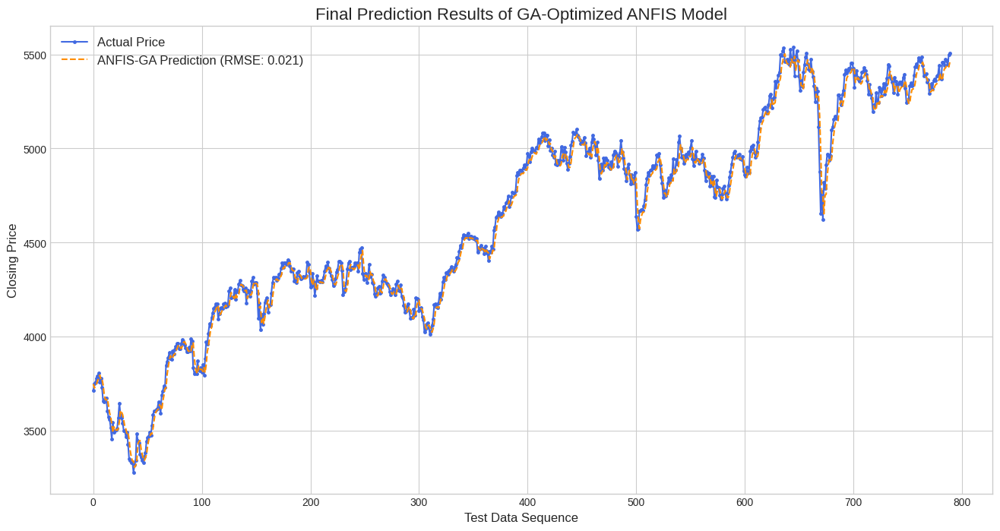

## GA ANFIS (`n_pop` = 20;`ngen`=30)

In [ ]:
pip install deap

In [ ]:
# ===================================================================
# CELL 1: UNIFIED DATA PREPARATION PIPELINE
# ===================================================================

def create_modeling_pipeline(dataframe, split_ratio=0.8):
    """
    A unified function to prepare data for modeling. It splits the data,
    verifies date ranges, scales features and target, and returns
    all necessary components.
    """
    # Ensure the 'Date' column is in datetime format
    dataframe['Date'] = pd.to_datetime(dataframe['Date'])

    # --- 1. Chronological Splitting ---
    split_index = int(len(dataframe) * split_ratio)
    train_df = dataframe.iloc[:split_index]
    test_df = dataframe.iloc[split_index:]

    print(f"Data split chronologically:")
    print(f" - Training set contains: {len(train_df)} rows")
    print(f" - Testing set contains:  {len(test_df)} rows")

    # --- 2. Date Range Verification ---
    start_date_train = train_df['Date'].iloc[0].strftime('%d %B %Y')
    end_date_train = train_df['Date'].iloc[-1].strftime('%d %B %Y')
    start_date_test = test_df['Date'].iloc[0].strftime('%d %B %Y')
    end_date_test = test_df['Date'].iloc[-1].strftime('%d %B %Y')

    print("\n--- 📅 Date Range Verification (80/20 Split) ---")
    print(f"Training data spans from: {start_date_train} to {end_date_train}")
    print(f"Testing data spans from:  {start_date_test} to {end_date_test}")
    print("-" * 60)

    # --- 3. Feature and Target Separation ---
    X_train_df = train_df.drop(columns=["Close(t)", "Date"])
    y_train_original = train_df["Close(t)"].values
    X_test_df = test_df.drop(columns=["Close(t)", "Date"])
    y_test_original = test_df["Close(t)"].values

    # --- 4. Scaling ---
    scaler_x = MinMaxScaler().fit(X_train_df)
    scaler_y = MinMaxScaler().fit(y_train_original.reshape(-1, 1))
    x_train_scaled = scaler_x.transform(X_train_df)
    x_test_scaled = scaler_x.transform(X_test_df)
    y_train_scaled = scaler_y.transform(y_train_original.reshape(-1, 1)).ravel()

    # --- 5. Final Dimension Check ---
    print("\n--- Final Data Dimensions for Model ---")
    print(f"x_train_scaled shape: {x_train_scaled.shape}")
    print(f"y_train_scaled shape: {y_train_scaled.shape}")
    print(f"x_test_scaled shape:  {x_test_scaled.shape}")
    print(f"y_test_original shape: {y_test_original.shape}")
    print("\n✅ Data preparation is complete and ready for the GA-ANFIS model.")

    return x_train_scaled, x_test_scaled, y_train_scaled, y_train_original, y_test_original, scaler_y

# --- HOW TO USE ---
# Assuming 'lagged_df' is your dataframe from the previous step
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

Data split chronologically:
 - Training set contains: 3156 rows
 - Testing set contains:  790 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 08 August 2022
Testing data spans from:  09 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3156, 3)
y_train_scaled shape: (3156,)
x_test_scaled shape:  (790, 3)
y_test_original shape: (790,)

✅ Data preparation is complete and ready for the GA-ANFIS model.


In [ ]:
# ===================================================================
# CELL 2: GA FITNESS FUNCTION & CONFIGURATION
# ===================================================================
import random
from deap import base, creator, tools, algorithms
from datetime import datetime

# Create a scaled version of the test target for fitness evaluation
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

def evaluate_anfis(individual):
    """
    Fitness function for the GA. It evaluates a set of hyperparameters
    by training an ANFIS model and returning its SCALED RMSE on the test set.
    """
    n_mfs, epochs, learning_rate = int(individual[0]), int(individual[1]), individual[2]
    print(f"Trying: n_mfs={n_mfs}, epochs={epochs}, lr={learning_rate:.4f}")

    model = ANFIS(n_inputs=x_train.shape[1], n_mfs=n_mfs, epochs=epochs, learning_rate=learning_rate)
    model.fit(x_train, y_train_scaled)

    predictions_scaled = model.predict(x_test)
    rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))
    print(f"--> Resulting Scaled RMSE: {rmse_scaled:.4f}\n")
    return (rmse_scaled,) # Return as a tuple for DEAP

# --- Configure the Genetic Algorithm ---
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individual", list, fitness=creator.FitnessMin)
toolbox = base.Toolbox()

# Define the search space for hyperparameters (CHROMOSOME)
LOWER_BOUNDS = [1, 50, 0.0005]
UPPER_BOUNDS = [5, 200, 0.01]

# Register attribute generators
toolbox.register("attr_n_mfs", random.randint, LOWER_BOUNDS[0], UPPER_BOUNDS[0])
toolbox.register("attr_epochs", random.randint, LOWER_BOUNDS[1], UPPER_BOUNDS[1])
toolbox.register("attr_lr", random.uniform, LOWER_BOUNDS[2], UPPER_BOUNDS[2])

# Register individual and population generators
toolbox.register("individual", tools.initCycle, creator.Individual,
                 (toolbox.attr_n_mfs, toolbox.attr_epochs, toolbox.attr_lr), n=1)
toolbox.register("population", tools.initRepeat, list, toolbox.individual)

# Custom mutation function to handle mixed integer/float types
def customMutation(individual, indpb):
    if random.random() < indpb: individual[0] = random.randint(LOWER_BOUNDS[0], UPPER_BOUNDS[0])
    if random.random() < indpb: individual[1] = random.randint(LOWER_BOUNDS[1], UPPER_BOUNDS[1])
    if random.random() < indpb: individual[2] = random.uniform(LOWER_BOUNDS[2], UPPER_BOUNDS[2])
    return individual,

# Register genetic operators
toolbox.register("evaluate", evaluate_anfis)
toolbox.register("mate", tools.cxTwoPoint)
toolbox.register("mutate", customMutation, indpb=0.2)
toolbox.register("select", tools.selTournament, tournsize=3)

/usr/local/lib/python3.12/dist-packages/deap/creator.py:185: RuntimeWarning: A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.
  warnings.warn("A class named '{0}' has already been created and it "
/usr/local/lib/python3.12/dist-packages/deap/creator.py:185: RuntimeWarning: A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.
  warnings.warn("A class named '{0}' has already been created and it "


In [ ]:
# ===================================================================
# CELL 3: RUN GENETIC ALGORITHM OPTIMIZATION
# ===================================================================
print("🚀 Starting ANFIS Optimization with Genetic Algorithm...")
start_time_ga = datetime.now()

# Initialize population and tools
pop = toolbox.population(n=20) # Population size
hof = tools.HallOfFame(1)      # Stores the single best individual
stats = tools.Statistics(lambda ind: ind.fitness.values)
stats.register("avg", np.mean)
stats.register("min", np.min)

# Run the evolutionary algorithm
algorithms.eaSimple(pop, toolbox, cxpb=0.6, mutpb=0.2, ngen=30, # Number of generations
                    stats=stats, halloffame=hof, verbose=True)

print(f"\nGA Optimization Time: {datetime.now() - start_time_ga}")

# --- Extract and Display Best Results ---
best_params = hof[0]
best_n_mfs, best_epochs, best_lr = int(best_params[0]), int(best_params[1]), best_params[2]
best_scaled_rmse = hof[0].fitness.values[0]

print("\n--- BEST OPTIMIZATION RESULTS ---")
print(f"Best Scaled RMSE Found: {best_scaled_rmse:.4f}")
print(f"Best Hyperparameter Combination:")
print(f"  - n_mfs: {best_n_mfs}")
print(f"  - epochs: {best_epochs}")
print(f"  - learning_rate: {best_lr:.4f}")

Streaming output truncated to the last 5000 lines.
Epoch 35/196 completed.
Epoch 36/196 completed.
Epoch 37/196 completed.
Epoch 38/196 completed.
Epoch 39/196 completed.
Epoch 40/196 completed.
Epoch 41/196 completed.
Epoch 42/196 completed.
Epoch 43/196 completed.
Epoch 44/196 completed.
Epoch 45/196 completed.
Epoch 46/196 completed.
Epoch 47/196 completed.
Epoch 48/196 completed.
Epoch 49/196 completed.
Epoch 50/196 completed.
Epoch 51/196 completed.
Epoch 52/196 completed.
Epoch 53/196 completed.
Epoch 54/196 completed.
Epoch 55/196 completed.
Epoch 56/196 completed.
Epoch 57/196 completed.
Epoch 58/196 completed.
Epoch 59/196 completed.
Epoch 60/196 completed.
Epoch 61/196 completed.
Epoch 62/196 completed.
Epoch 63/196 completed.
Epoch 64/196 completed.
Epoch 65/196 completed.
Epoch 66/196 completed.
Epoch 67/196 completed.
Epoch 68/196 completed.
Epoch 69/196 completed.
Epoch 70/196 completed.
Epoch 71/196 completed.
Epoch 72/196 completed.
Epoch 73/196 completed.
Epoch 74/196 


--- Comparison Table: Actual vs. Predicted Prices ---
    Actual_Price  Predicted_Price      Error
0    3715.370117      3748.002029  32.631912
1    3749.350098      3726.372082  22.978015
2    3757.050049      3741.316348  15.733701
3    3776.810059      3747.652913  29.157145
4    3789.620117      3766.463038  23.157080
5    3805.219971      3780.020138  25.199833
6    3756.060059      3795.408902  39.348843
7    3777.379883      3771.987817   5.392066
8    3730.320068      3775.158917  44.838849
9    3658.219971      3744.829700  86.609729
10   3652.520020      3693.973225  41.453206
11   3667.459961      3665.933034   1.526927
12   3674.540039      3662.323703  12.216336
13   3603.679932      3669.255540  65.575608
14   3570.510010      3631.231835  60.721825

--- Statistics of Prediction Error ---
count    790.000000
mean      38.452315
std       33.607794
min        0.029855
25%       14.531670
50%       29.828640
75%       53.428856
max      330.292627
Name: Error, dtype: float

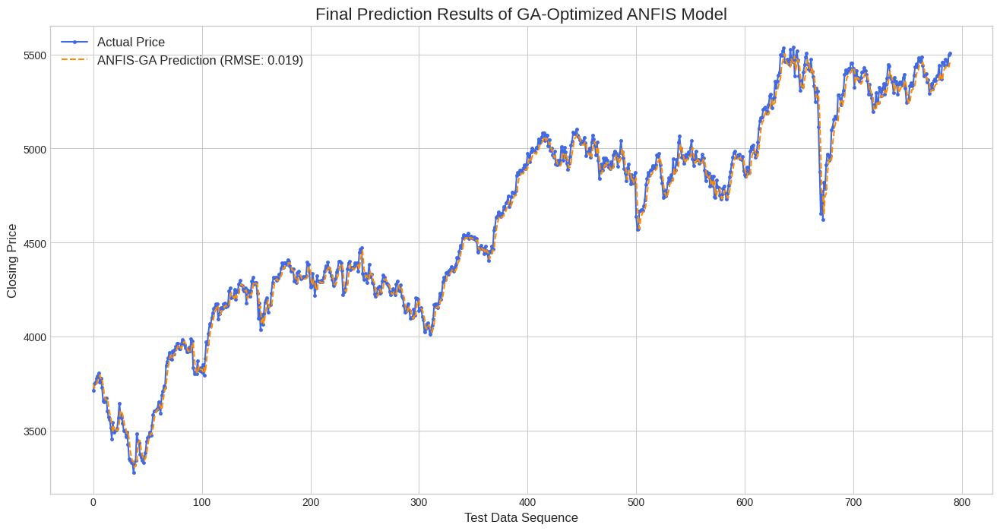

In [ ]:
# ===================================================================
# CELL 5: PREDICTION COMPARISON TABLE & PLOTTING
# ===================================================================
import matplotlib.pyplot as plt

# Create a DataFrame for easy comparison
comparison_df = pd.DataFrame({
    'Actual_Price': y_test_original,
    'Predicted_Price': final_predictions_original
})
comparison_df['Error'] = abs(comparison_df['Actual_Price'] - comparison_df['Predicted_Price'])

print("\n--- Comparison Table: Actual vs. Predicted Prices ---")
print(comparison_df.head(15))

print("\n--- Statistics of Prediction Error ---")
print(comparison_df['Error'].describe())

# --- Plot the Final Results ---
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(16, 8))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=5, linestyle='-')
plt.plot(final_predictions_original, label=f'ANFIS-GA Prediction (RMSE: {rmse_scaled:.4f})', color='darkorange', linestyle='--')
plt.title('Final Prediction Results of GA-Optimized ANFIS Model', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Sequence', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()

## 🗃️ NASDAQ Composite

In [ ]:
import yfinance as yf
import datetime

# 2. Mengambil data NASDAQ Composite
print("\nMengunduh data NASDAQ Composite...")
nasdaq_ticker = yf.Ticker('^IXIC')
nasdaq_df = nasdaq_ticker.history(start="2010-01-01", end="2025-09-30")
nasdaq_df.to_csv('NASDAQ_Composite.csv')
print("✅ Data NASDAQ Composite berhasil disimpan ke NASDAQ_Composite.csv")


Mengunduh data NASDAQ Composite...
✅ Data NASDAQ Composite berhasil disimpan ke NASDAQ_Composite.csv


#### 📈 Plot Closing Price Trends Over Time

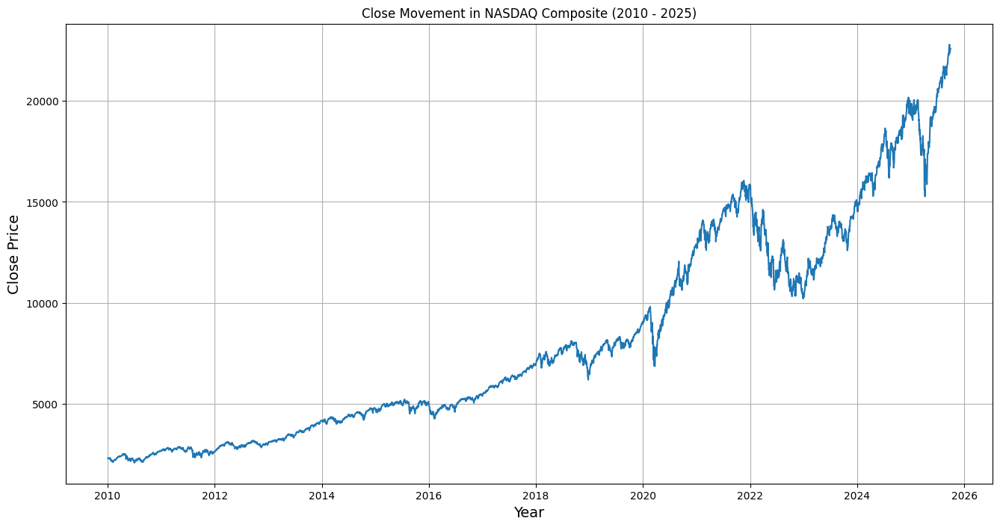

In [ ]:
plt.figure(figsize=(16, 8))
plt.title('Close Movement in NASDAQ Composite (2010 - 2025)')
plt.plot(nasdaq_df['Close'])
plt.xlabel('Year', fontsize=14)
plt.ylabel('Close Price', fontsize=14)
plt.grid(True)
plt.show()

### Lagged Features for Forecasting Model
Peramalan menggunakan data historis dalam urutan waktu tertentu untuk memperkirakan nilai di masa depan.

* (t-n), .. ,(t-2), (t-1), (t)
* Input features are (t-n), ..., (t-1)
* Output or label is (t)

In [ ]:
def create_lagged_features_with_date(data, n_lags=5):
    """
    Membuat fitur lagged dan menyimpan kolom 'Date' yang sesuai.
    """
    # ==== INI BAGIAN PERBAIKANNYA ====
    # Ubah indeks menjadi kolom 'Date'.
    df_with_date_col = data.reset_index()

    df_lagged = pd.DataFrame()
    # Membuat kolom fitur lagged (t-1, t-2, ..., t-n)
    for lag in range(1, n_lags + 1):
        df_lagged[f"Close(t-{lag})"] = df_with_date_col['Close'].shift(lag)

    # Menambahkan kolom target (t) dan kolom tanggal
    df_lagged['Close(t)'] = df_with_date_col['Close']
    df_lagged['Date'] = df_with_date_col['Date'] # Sekarang kode ini bisa berjalan

    # Buang baris NaN yang muncul akibat proses shift
    df_lagged = df_lagged.dropna().reset_index(drop=True)

    return df_lagged

# Terapkan fungsi baru
N_LAGS = 3
lagged_df = create_lagged_features_with_date(nasdaq_df, n_lags=N_LAGS)

print("\n--- Data setelah dibuat 3 fitur lagged (dengan kolom Date) ---")
print(lagged_df.head())



--- Data setelah dibuat 3 fitur lagged (dengan kolom Date) ---
    Close(t-1)   Close(t-2)   Close(t-3)     Close(t)  \
0  2301.090088  2308.709961  2308.419922  2300.050049   
1  2300.050049  2301.090088  2308.709961  2317.169922   
2  2317.169922  2300.050049  2301.090088  2312.409912   
3  2312.409912  2317.169922  2300.050049  2282.310059   
4  2282.310059  2312.409912  2317.169922  2307.899902   

                       Date  
0 2010-01-07 00:00:00-05:00  
1 2010-01-08 00:00:00-05:00  
2 2010-01-11 00:00:00-05:00  
3 2010-01-12 00:00:00-05:00  
4 2010-01-13 00:00:00-05:00  


### 🧹 Data Preprocessing & Data Splitting

In [ ]:
# ===================================================================
# FINAL DATA PREPARATION PIPELINE
# ===================================================================

def create_modeling_pipeline(dataframe, split_ratio=0.8):
    """
    A unified function to prepare data for modeling. It splits the data,
    verifies date ranges, scales features and target, and returns
    all necessary components.

    Args:
        dataframe (pd.DataFrame): The input dataframe with lagged features and a 'Date' column.
        split_ratio (float): The proportion of data to be used for the training set.

    Returns:
        tuple: A tuple containing:
            - x_train_scaled (np.array)
            - x_test_scaled (np.array)
            - y_train_scaled (np.array)
            - y_train_original (np.array)
            - y_test_original (np.array)
            - scaler_y (MinMaxScaler object)
    """
    # Ensure the 'Date' column is in datetime format
    dataframe['Date'] = pd.to_datetime(dataframe['Date'])

    # --- 1. Chronological Splitting ---
    split_index = int(len(dataframe) * split_ratio)
    train_df = dataframe.iloc[:split_index]
    test_df = dataframe.iloc[split_index:]

    print(f"Data split chronologically:")
    print(f" - Training set contains: {len(train_df)} rows")
    print(f" - Testing set contains:  {len(test_df)} rows")

    # --- 2. Date Range Verification ---
    start_date_train = train_df['Date'].iloc[0].strftime('%d %B %Y')
    end_date_train = train_df['Date'].iloc[-1].strftime('%d %B %Y')
    start_date_test = test_df['Date'].iloc[0].strftime('%d %B %Y')
    end_date_test = test_df['Date'].iloc[-1].strftime('%d %B %Y')

    print("\n--- 📅 Date Range Verification (80/20 Split) ---")
    print(f"Training data spans from: {start_date_train} to {end_date_train}")
    print(f"Testing data spans from:  {start_date_test} to {end_date_test}")
    print("-" * 60)

    # --- 3. Feature and Target Separation ---
    X_train_df = train_df.drop(columns=["Close(t)", "Date"])
    y_train_original = train_df["Close(t)"].values

    X_test_df = test_df.drop(columns=["Close(t)", "Date"])
    y_test_original = test_df["Close(t)"].values

    # --- 4. Scaling ---
    # Scalers are fitted ONLY on the training data to prevent data leakage
    scaler_x = MinMaxScaler().fit(X_train_df)
    scaler_y = MinMaxScaler().fit(y_train_original.reshape(-1, 1))

    x_train_scaled = scaler_x.transform(X_train_df)
    x_test_scaled = scaler_x.transform(X_test_df)
    y_train_scaled = scaler_y.transform(y_train_original.reshape(-1, 1)).ravel()

    # --- 5. Final Dimension Check ---
    print("\n--- Final Data Dimensions for Model ---")
    print(f"x_train_scaled shape: {x_train_scaled.shape}")
    print(f"y_train_scaled shape: {y_train_scaled.shape}")
    print(f"x_test_scaled shape:  {x_test_scaled.shape}")
    print(f"y_test_original shape: {y_test_original.shape}")
    print("\n✅ Data preparation is complete and ready for the GA-ANFIS model.")

    return x_train_scaled, x_test_scaled, y_train_scaled, y_train_original, y_test_original, scaler_y

# HOW TO USE:
# Assuming 'lagged_df' is your dataframe from the previous step
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

Data split chronologically:
 - Training set contains: 3164 rows
 - Testing set contains:  792 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 02 August 2022
Testing data spans from:  03 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3164, 3)
y_train_scaled shape: (3164,)
x_test_scaled shape:  (792, 3)
y_test_original shape: (792,)

✅ Data preparation is complete and ready for the GA-ANFIS model.


In [ ]:
from datetime import datetime

## ANFIS

### n_mfs = 1

Data split chronologically:
 - Training set contains: 3164 rows
 - Testing set contains:  792 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 02 August 2022
Testing data spans from:  03 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3164, 3)
y_train_scaled shape: (3164,)
x_test_scaled shape:  (792, 3)
y_test_original shape: (792,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3164, 3), y=(3164,)
Testing data shape: X=(792, 3), y=(792,)

--- ANFIS Training Process ---
Epoch 1/50 completed.
Epoch 2/50 completed.
Epoch 3/50 completed.
Epoch 4/50 completed.
Epoch 5/50 completed.
Epoch 6/50 completed.
Epoch 7/50 completed.
Epoch 8/50 completed.
Epoch 9/50 completed.
Epoch 10/50 completed.
Epoch 11/50 completed.
Epoch 12/50 completed.
Epoch 13/50 completed.
Epoch 14/50 completed.
Epoch 15/

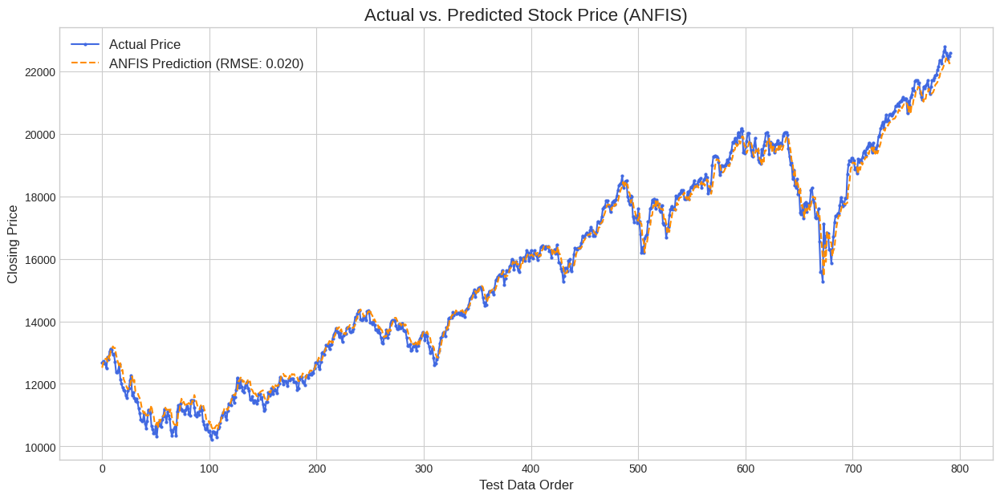

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=1,
    epochs=50,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

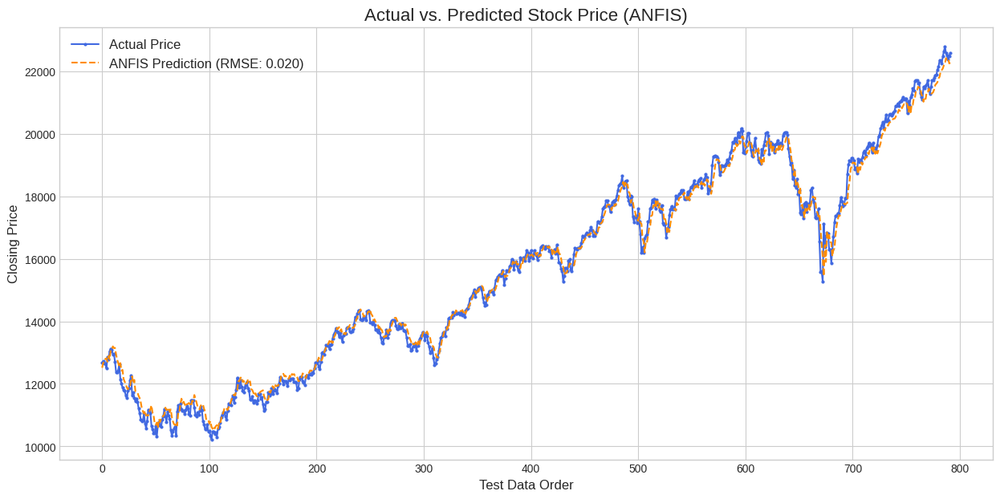

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 275.6993 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi     Selisih
0  12668.160156    12514.500384  153.659772
1  12720.580078    12673.967054   46.613024
2  12657.549805    12692.732106   35.182301
3  12644.459961    12798.429901  153.969940
4  12493.929688    12814.359468  320.429781

--- Statistik Selisih (Error) ---
count     792.000000
mean      211.802460
std       176.604639
min         0.698466
25%        76.876601
50%       178.626868
75%       296.576187
max      1676.381997
Name: Selisih, dtype: float64


### n_mfs = 2

Data split chronologically:
 - Training set contains: 3164 rows
 - Testing set contains:  792 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 02 August 2022
Testing data spans from:  03 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3164, 3)
y_train_scaled shape: (3164,)
x_test_scaled shape:  (792, 3)
y_test_original shape: (792,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3164, 3), y=(3164,)
Testing data shape: X=(792, 3), y=(792,)

--- ANFIS Training Process ---
Epoch 1/50 completed.
Epoch 2/50 completed.
Epoch 3/50 completed.
Epoch 4/50 completed.
Epoch 5/50 completed.
Epoch 6/50 completed.
Epoch 7/50 completed.
Epoch 8/50 completed.
Epoch 9/50 completed.
Epoch 10/50 completed.
Epoch 11/50 completed.
Epoch 12/50 completed.
Epoch 13/50 completed.
Epoch 14/50 completed.
Epoch 15/

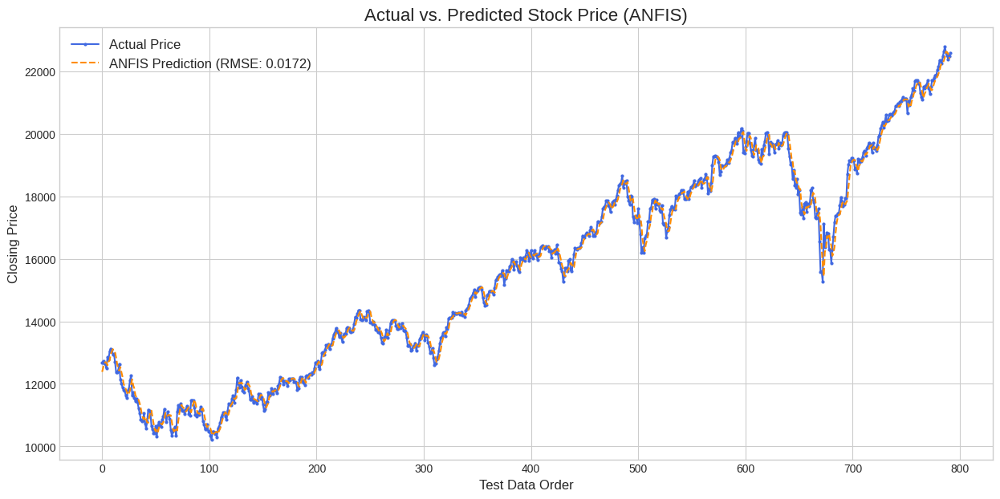

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=50,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.4f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

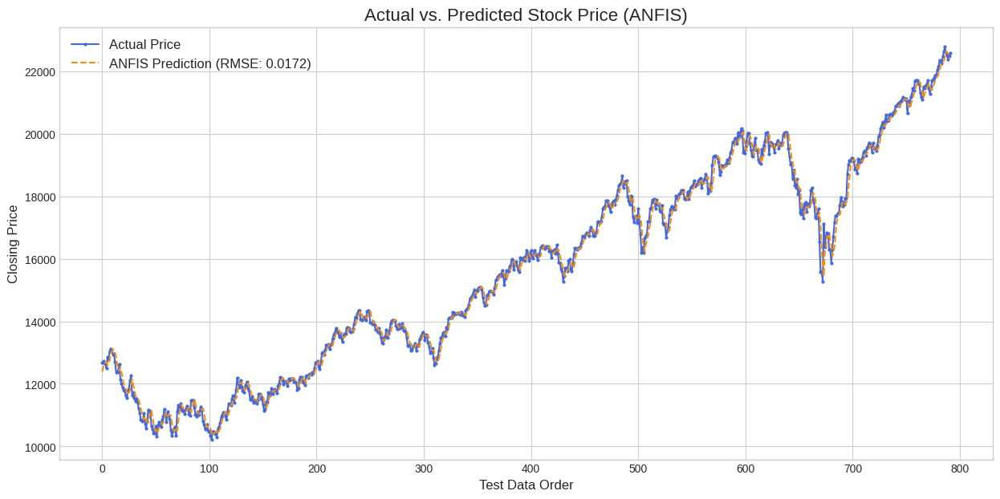

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 244.5929 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi     Selisih
0  12668.160156    12383.764252  284.395904
1  12720.580078    12497.515789  223.064289
2  12657.549805    12640.341121   17.208683
3  12644.459961    12701.384836   56.924875
4  12493.929688    12682.004930  188.075242

--- Statistik Selisih (Error) ---
count     792.000000
mean      184.747016
std       160.395446
min         0.712590
25%        79.442822
50%       149.783012
75%       245.421113
max      1656.758150
Name: Selisih, dtype: float64


### n_mfs = 3

Data split chronologically:
 - Training set contains: 3164 rows
 - Testing set contains:  792 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 02 August 2022
Testing data spans from:  03 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3164, 3)
y_train_scaled shape: (3164,)
x_test_scaled shape:  (792, 3)
y_test_original shape: (792,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3164, 3), y=(3164,)
Testing data shape: X=(792, 3), y=(792,)

--- ANFIS Training Process ---
Epoch 1/50 completed.
Epoch 2/50 completed.
Epoch 3/50 completed.
Epoch 4/50 completed.
Epoch 5/50 completed.
Epoch 6/50 completed.
Epoch 7/50 completed.
Epoch 8/50 completed.
Epoch 9/50 completed.
Epoch 10/50 completed.
Epoch 11/50 completed.
Epoch 12/50 completed.
Epoch 13/50 completed.
Epoch 14/50 completed.
Epoch 15/

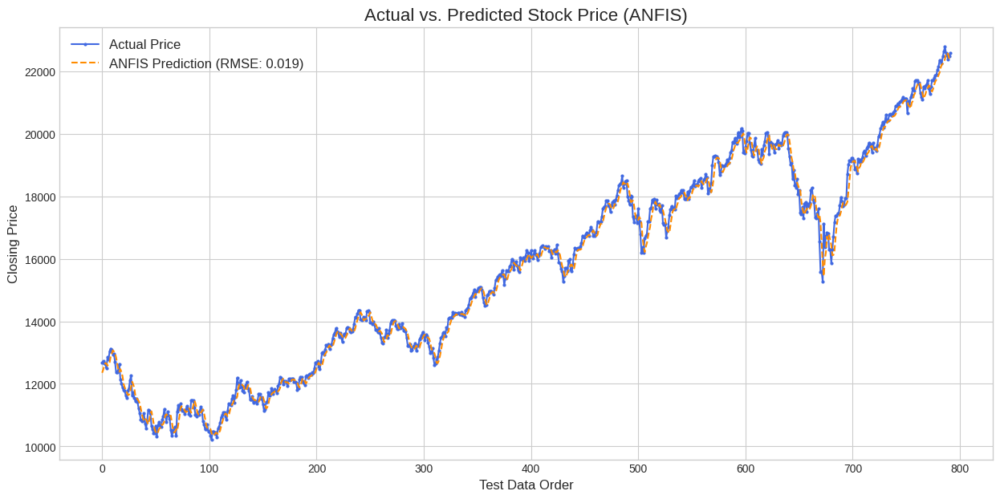

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=3,
    epochs=50,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 260.7958 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi     Selisih
0  12668.160156    12353.492862  314.667295
1  12720.580078    12451.602556  268.977522
2  12657.549805    12563.691692   93.858113
3  12644.459961    12663.732915   19.272954
4  12493.929688    12656.663552  162.733865

--- Statistik Selisih (Error) ---
count     792.000000
mean      201.319373
std       165.890644
min         0.291463
25%        90.539132
50%       171.983561
75%       266.527499
max      1677.024773
Name: Selisih, dtype: float64


### n_mfs = 4

Data split chronologically:
 - Training set contains: 3164 rows
 - Testing set contains:  792 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 02 August 2022
Testing data spans from:  03 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3164, 3)
y_train_scaled shape: (3164,)
x_test_scaled shape:  (792, 3)
y_test_original shape: (792,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3164, 3), y=(3164,)
Testing data shape: X=(792, 3), y=(792,)

--- ANFIS Training Process ---
Epoch 1/50 completed.
Epoch 2/50 completed.
Epoch 3/50 completed.
Epoch 4/50 completed.
Epoch 5/50 completed.
Epoch 6/50 completed.
Epoch 7/50 completed.
Epoch 8/50 completed.
Epoch 9/50 completed.
Epoch 10/50 completed.
Epoch 11/50 completed.
Epoch 12/50 completed.
Epoch 13/50 completed.
Epoch 14/50 completed.
Epoch 15/

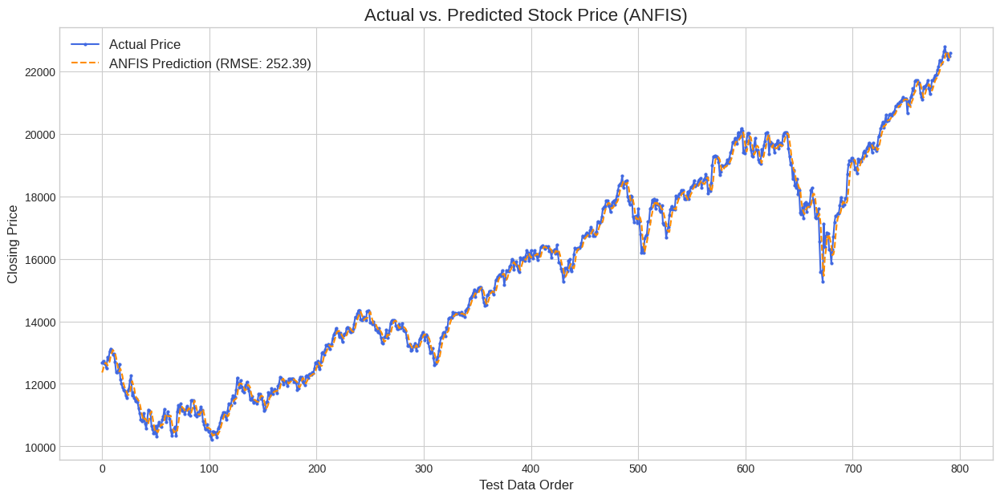

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=4,
    epochs=50,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

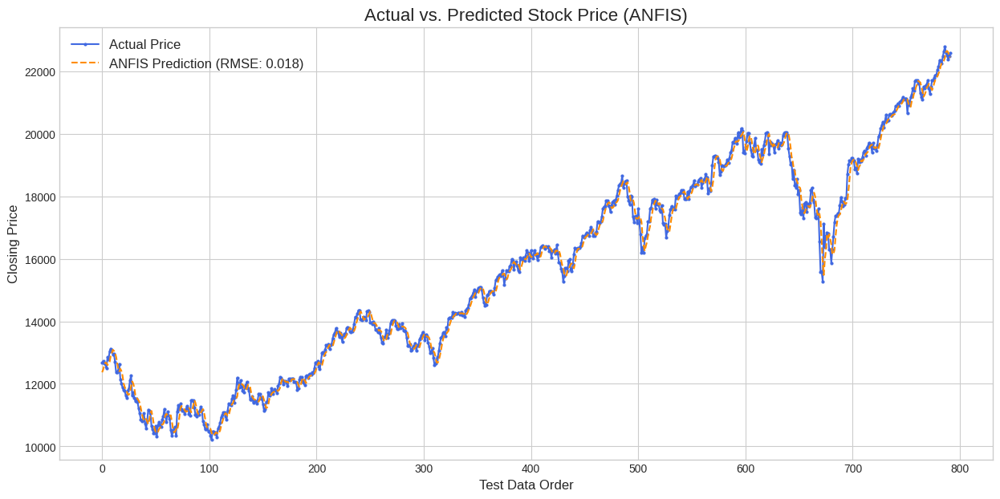

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 252.3907 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi     Selisih
0  12668.160156    12360.544419  307.615737
1  12720.580078    12468.150571  252.429507
2  12657.549805    12583.647274   73.902531
3  12644.459961    12672.714047   28.254086
4  12493.929688    12663.465464  169.535777

--- Statistik Selisih (Error) ---
count     792.000000
mean      192.362427
std       163.497804
min         0.448217
25%        85.391386
50%       161.206961
75%       252.130120
max      1669.057584
Name: Selisih, dtype: float64


### n_mfs = 5

Data split chronologically:
 - Training set contains: 3164 rows
 - Testing set contains:  792 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 02 August 2022
Testing data spans from:  03 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3164, 3)
y_train_scaled shape: (3164,)
x_test_scaled shape:  (792, 3)
y_test_original shape: (792,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3164, 3), y=(3164,)
Testing data shape: X=(792, 3), y=(792,)

--- ANFIS Training Process ---
Epoch 1/50 completed.
Epoch 2/50 completed.
Epoch 3/50 completed.
Epoch 4/50 completed.
Epoch 5/50 completed.
Epoch 6/50 completed.
Epoch 7/50 completed.
Epoch 8/50 completed.
Epoch 9/50 completed.
Epoch 10/50 completed.
Epoch 11/50 completed.
Epoch 12/50 completed.
Epoch 13/50 completed.
Epoch 14/50 completed.
Epoch 15/

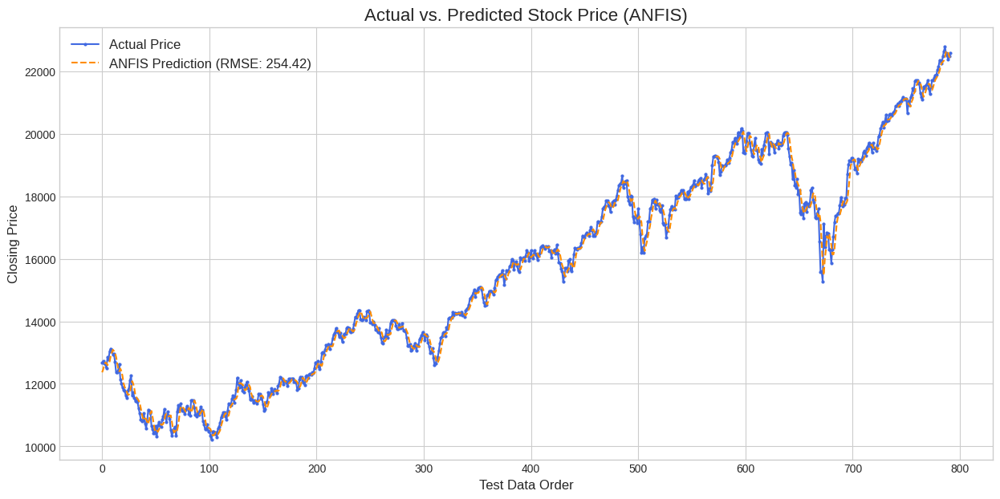

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=5,
    epochs=50,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

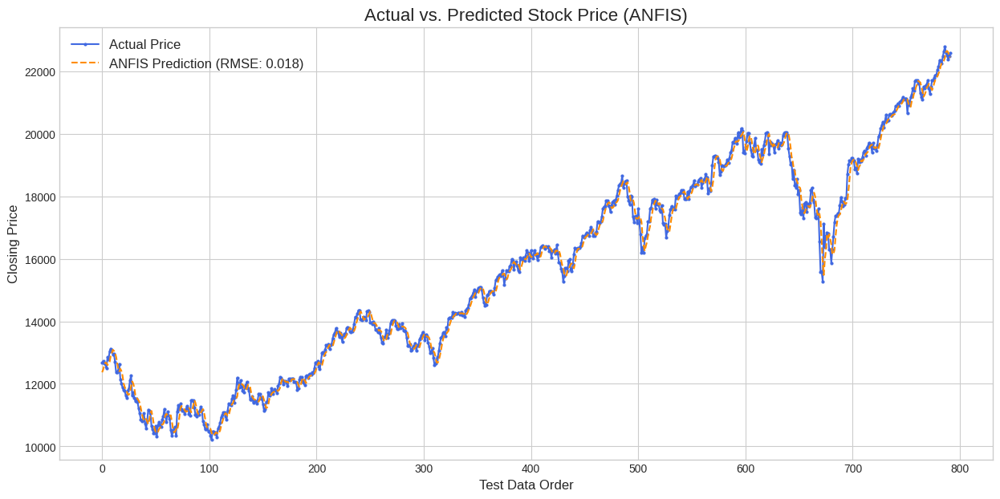

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 254.4192 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi     Selisih
0  12668.160156    12368.052290  300.107867
1  12720.580078    12463.959300  256.620778
2  12657.549805    12586.696641   70.853164
3  12644.459961    12681.665289   37.205328
4  12493.929688    12671.420367  177.490680

--- Statistik Selisih (Error) ---
count     792.000000
mean      192.580312
std       166.363693
min         0.733929
25%        83.545867
50%       154.766291
75%       253.575234
max      1646.470193
Name: Selisih, dtype: float64


## Pengujian Nilai Epoch
Menentukan seberapa "keras" atau seberapa lama model ANFIS berlatih.

### epoch = 50

Data split chronologically:
 - Training set contains: 3164 rows
 - Testing set contains:  792 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 02 August 2022
Testing data spans from:  03 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3164, 3)
y_train_scaled shape: (3164,)
x_test_scaled shape:  (792, 3)
y_test_original shape: (792,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3164, 3), y=(3164,)
Testing data shape: X=(792, 3), y=(792,)

--- ANFIS Training Process ---
Epoch 1/50 completed.
Epoch 2/50 completed.
Epoch 3/50 completed.
Epoch 4/50 completed.
Epoch 5/50 completed.
Epoch 6/50 completed.
Epoch 7/50 completed.
Epoch 8/50 completed.
Epoch 9/50 completed.
Epoch 10/50 completed.
Epoch 11/50 completed.
Epoch 12/50 completed.
Epoch 13/50 completed.
Epoch 14/50 completed.
Epoch 15/

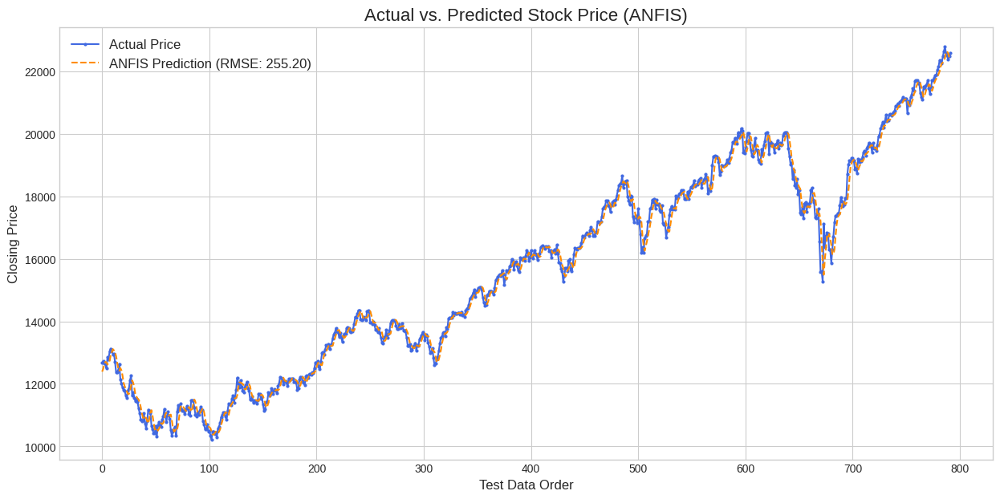

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=50,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

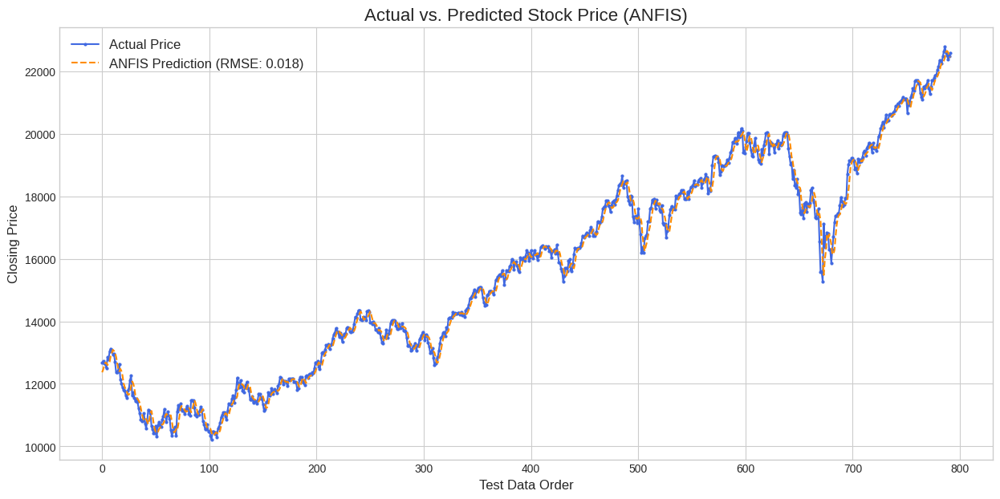

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 255.2031 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi     Selisih
0  12668.160156    12389.225418  278.934739
1  12720.580078    12481.297566  239.282512
2  12657.549805    12609.376928   48.172876
3  12644.459961    12702.622353   58.162392
4  12493.929688    12690.840281  196.910594

--- Statistik Selisih (Error) ---
count     792.000000
mean      192.980498
std       167.100009
min         0.533043
25%        82.799496
50%       156.034769
75%       255.767003
max      1635.049597
Name: Selisih, dtype: float64


### epoch = 100



Data split chronologically:
 - Training set contains: 3164 rows
 - Testing set contains:  792 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 02 August 2022
Testing data spans from:  03 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3164, 3)
y_train_scaled shape: (3164,)
x_test_scaled shape:  (792, 3)
y_test_original shape: (792,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3164, 3), y=(3164,)
Testing data shape: X=(792, 3), y=(792,)

--- ANFIS Training Process ---
Epoch 1/100 completed.
Epoch 2/100 completed.
Epoch 3/100 completed.
Epoch 4/100 completed.
Epoch 5/100 completed.
Epoch 6/100 completed.
Epoch 7/100 completed.
Epoch 8/100 completed.
Epoch 9/100 completed.
Epoch 10/100 completed.
Epoch 11/100 completed.
Epoch 12/100 completed.
Epoch 13/100 completed.
Epoch 14/100 comple

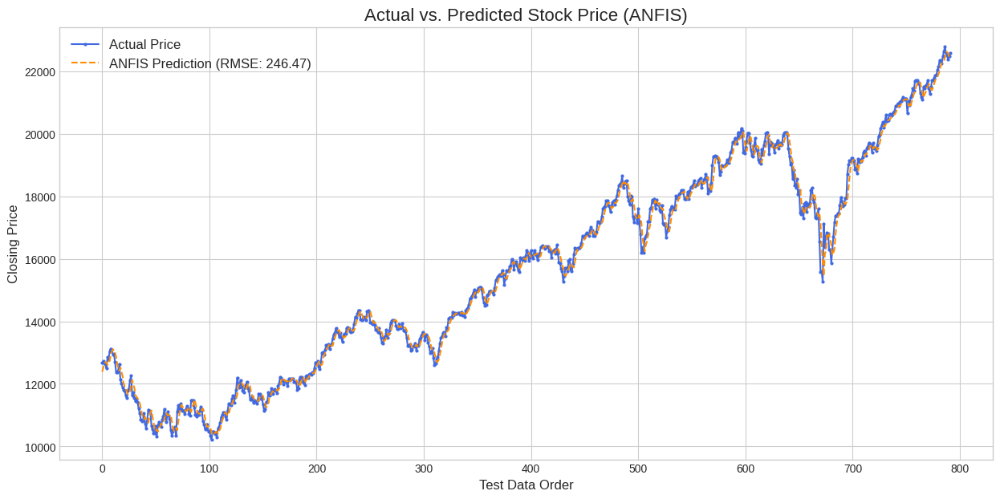

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=100,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

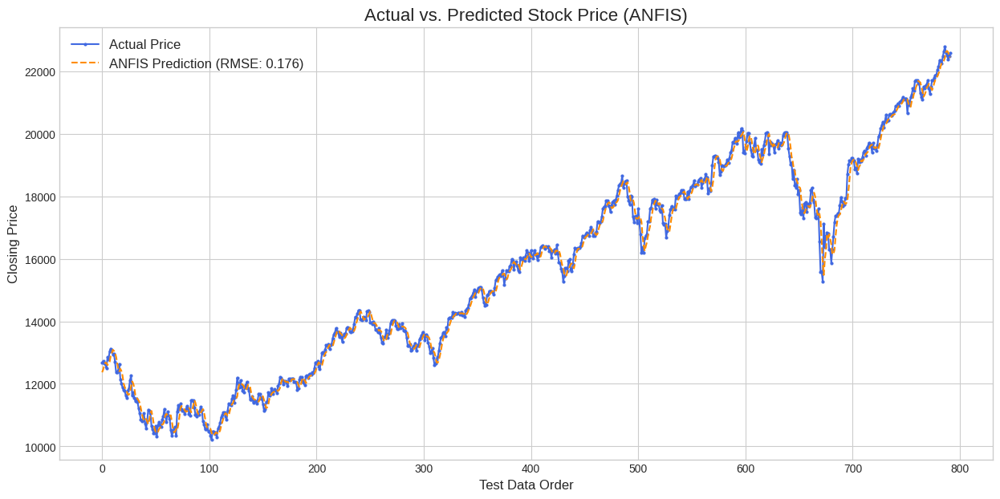

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 246.4660 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi     Selisih
0  12668.160156    12386.432926  281.727231
1  12720.580078    12509.567373  211.012705
2  12657.549805    12612.123973   45.425832
3  12644.459961    12695.722414   51.262453
4  12493.929688    12688.890198  194.960510

--- Statistik Selisih (Error) ---
count     792.000000
mean      186.114172
std       161.678690
min         0.206383
25%        79.211453
50%       151.535367
75%       246.946161
max      1666.240396
Name: Selisih, dtype: float64


### epoch = 150

Data split chronologically:
 - Training set contains: 3164 rows
 - Testing set contains:  792 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 02 August 2022
Testing data spans from:  03 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3164, 3)
y_train_scaled shape: (3164,)
x_test_scaled shape:  (792, 3)
y_test_original shape: (792,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3164, 3), y=(3164,)
Testing data shape: X=(792, 3), y=(792,)

--- ANFIS Training Process ---
Epoch 1/150 completed.
Epoch 2/150 completed.
Epoch 3/150 completed.
Epoch 4/150 completed.
Epoch 5/150 completed.
Epoch 6/150 completed.
Epoch 7/150 completed.
Epoch 8/150 completed.
Epoch 9/150 completed.
Epoch 10/150 completed.
Epoch 11/150 completed.
Epoch 12/150 completed.
Epoch 13/150 completed.
Epoch 14/150 comple

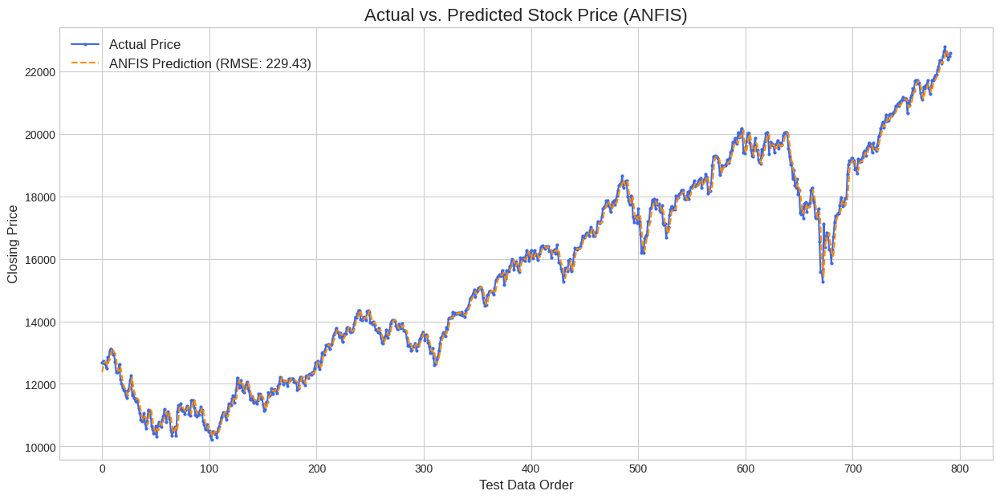

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=150,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

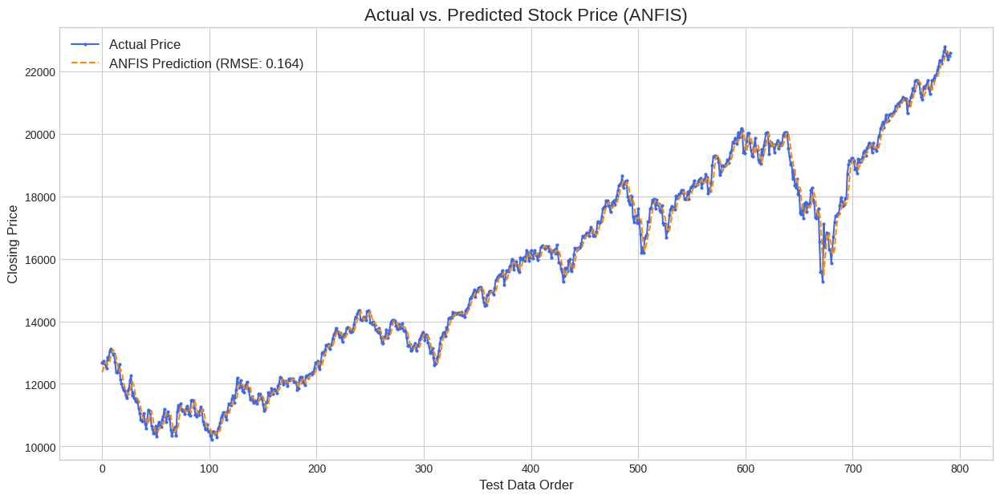

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 229.4329 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi     Selisih
0  12668.160156    12373.542949  294.617207
1  12720.580078    12528.868094  191.711985
2  12657.549805    12697.641183   40.091378
3  12644.459961    12698.755650   54.295689
4  12493.929688    12665.596630  171.666943

--- Statistik Selisih (Error) ---
count     792.000000
mean      172.140645
std       151.776558
min         0.008152
25%        70.341253
50%       141.442476
75%       231.181654
max      1698.392017
Name: Selisih, dtype: float64


## Pengujian Nilai Learning Rate
Pengaturan seberapa cepat model ANFIS belajar di setiap langkah.

[0.1, 0.05, 0.01, 0.005, 0.001]

### lr = 0.1

Data split chronologically:
 - Training set contains: 3164 rows
 - Testing set contains:  792 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 02 August 2022
Testing data spans from:  03 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3164, 3)
y_train_scaled shape: (3164,)
x_test_scaled shape:  (792, 3)
y_test_original shape: (792,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3164, 3), y=(3164,)
Testing data shape: X=(792, 3), y=(792,)

--- ANFIS Training Process ---
Epoch 1/150 completed.
Epoch 2/150 completed.
Epoch 3/150 completed.
Epoch 4/150 completed.
Epoch 5/150 completed.
Epoch 6/150 completed.
Epoch 7/150 completed.
Epoch 8/150 completed.
Epoch 9/150 completed.
Epoch 10/150 completed.
Epoch 11/150 completed.
Epoch 12/150 completed.
Epoch 13/150 completed.
Epoch 14/150 comple

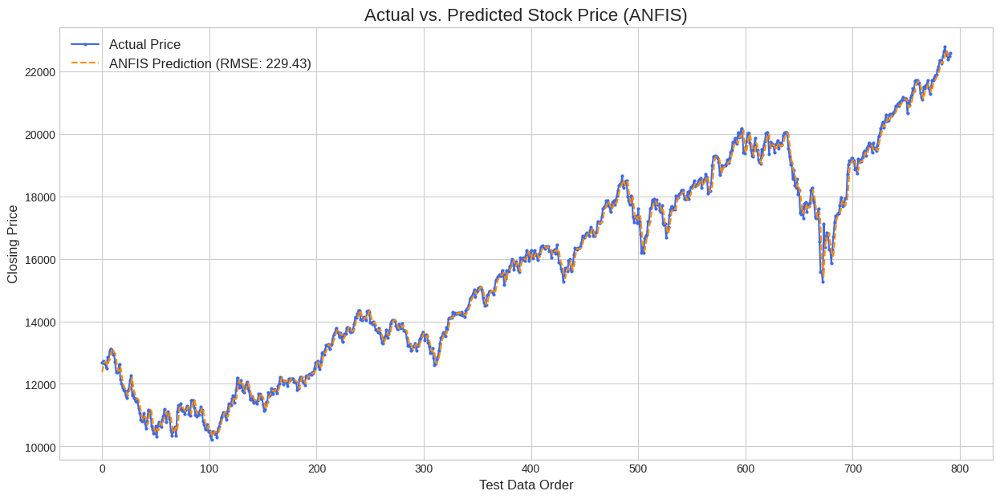

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=150,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

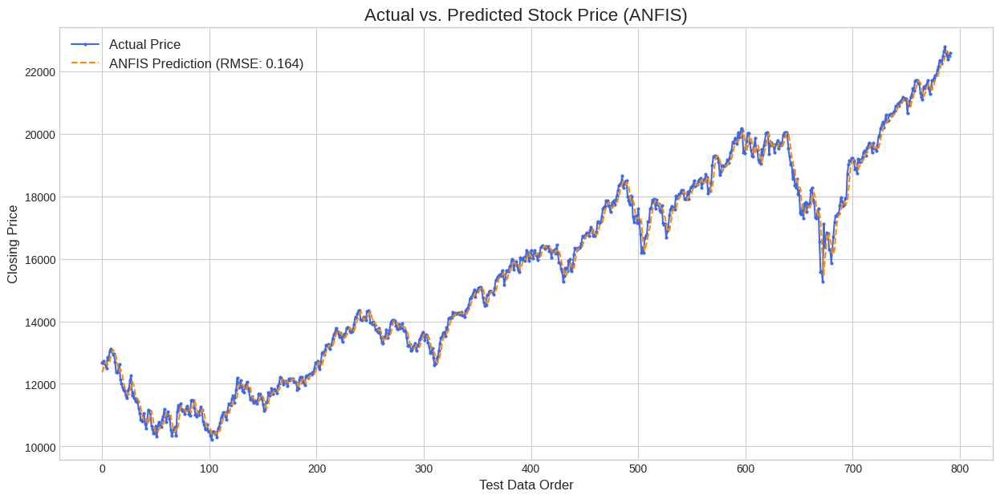

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 229.4329 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi     Selisih
0  12668.160156    12373.542949  294.617207
1  12720.580078    12528.868094  191.711985
2  12657.549805    12697.641183   40.091378
3  12644.459961    12698.755650   54.295689
4  12493.929688    12665.596630  171.666943

--- Statistik Selisih (Error) ---
count     792.000000
mean      172.140645
std       151.776558
min         0.008152
25%        70.341253
50%       141.442476
75%       231.181654
max      1698.392017
Name: Selisih, dtype: float64


Data split chronologically:
 - Training set contains: 3164 rows
 - Testing set contains:  792 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 02 August 2022
Testing data spans from:  03 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3164, 3)
y_train_scaled shape: (3164,)
x_test_scaled shape:  (792, 3)
y_test_original shape: (792,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3164, 3), y=(3164,)
Testing data shape: X=(792, 3), y=(792,)

--- ANFIS Training Process ---
Epoch 1/150 completed.
Epoch 2/150 completed.
Epoch 3/150 completed.
Epoch 4/150 completed.
Epoch 5/150 completed.
Epoch 6/150 completed.
Epoch 7/150 completed.
Epoch 8/150 completed.
Epoch 9/150 completed.
Epoch 10/150 completed.
Epoch 11/150 completed.
Epoch 12/150 completed.
Epoch 13/150 completed.
Epoch 14/150 comple

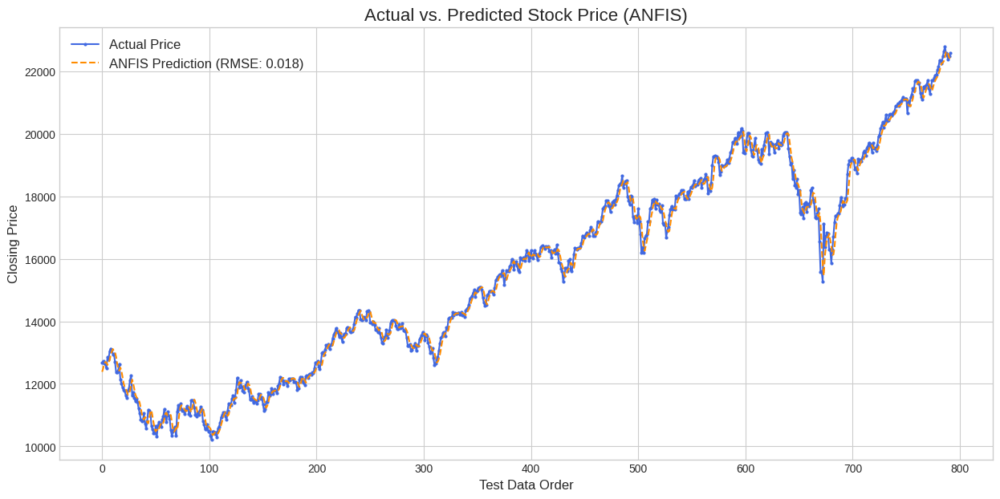

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=150,
    learning_rate=0.1
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 245.6621 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi     Selisih
0  12668.160156    12384.784884  283.375273
1  12720.580078    12498.799851  221.780228
2  12657.549805    12631.727619   25.822186
3  12644.459961    12700.262388   55.802427
4  12493.929688    12684.210803  190.281115

--- Statistik Selisih (Error) ---
count     792.000000
mean      185.566666
std       161.082779
min         0.066253
25%        80.305340
50%       150.235952
75%       246.915976
max      1657.040665
Name: Selisih, dtype: float64


### lr = 0.05

Data split chronologically:
 - Training set contains: 3164 rows
 - Testing set contains:  792 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 02 August 2022
Testing data spans from:  03 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3164, 3)
y_train_scaled shape: (3164,)
x_test_scaled shape:  (792, 3)
y_test_original shape: (792,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3164, 3), y=(3164,)
Testing data shape: X=(792, 3), y=(792,)

--- ANFIS Training Process ---
Epoch 1/150 completed.
Epoch 2/150 completed.
Epoch 3/150 completed.
Epoch 4/150 completed.
Epoch 5/150 completed.
Epoch 6/150 completed.
Epoch 7/150 completed.
Epoch 8/150 completed.
Epoch 9/150 completed.
Epoch 10/150 completed.
Epoch 11/150 completed.
Epoch 12/150 completed.
Epoch 13/150 completed.
Epoch 14/150 comple

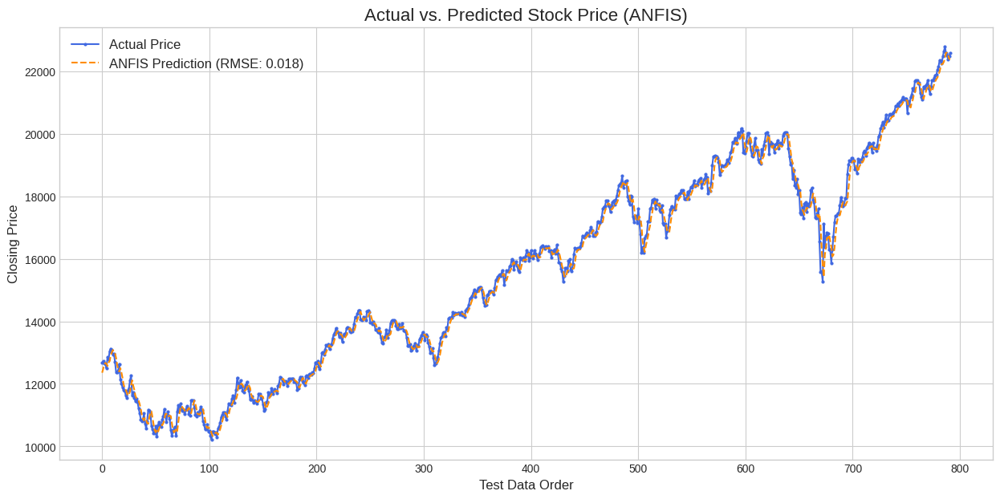

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=150,
    learning_rate=0.05
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

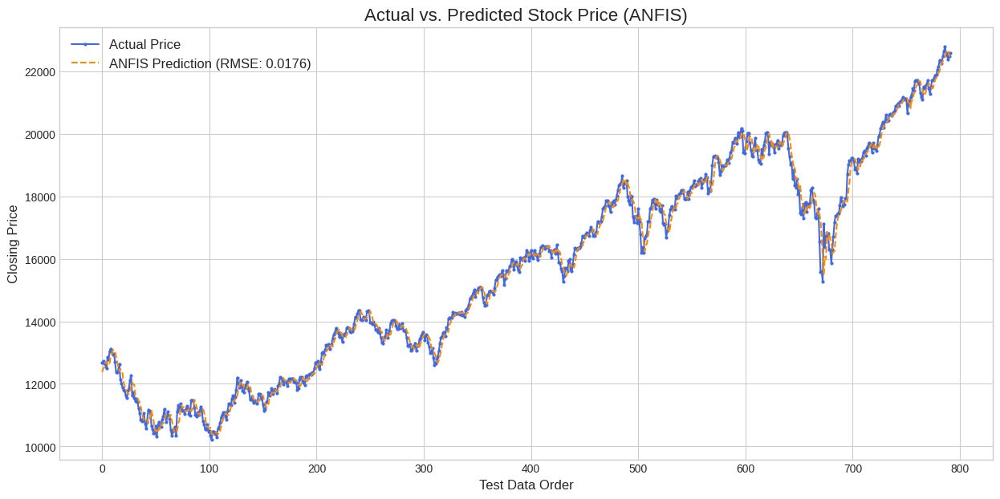

In [ ]:
# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.4f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 246.0156 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi     Selisih
0  12668.160156    12355.713021  312.447135
1  12720.580078    12484.731402  235.848676
2  12657.549805    12605.853315   51.696490
3  12644.459961    12669.206536   24.746575
4  12493.929688    12655.351350  161.421663

--- Statistik Selisih (Error) ---
count     792.000000
mean      188.995347
std       157.593687
min         0.462658
25%        82.977676
50%       163.319323
75%       245.365543
max      1701.050691
Name: Selisih, dtype: float64


### lr = 0.01

Data split chronologically:
 - Training set contains: 3164 rows
 - Testing set contains:  792 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 02 August 2022
Testing data spans from:  03 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3164, 3)
y_train_scaled shape: (3164,)
x_test_scaled shape:  (792, 3)
y_test_original shape: (792,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3164, 3), y=(3164,)
Testing data shape: X=(792, 3), y=(792,)

--- ANFIS Training Process ---
Epoch 1/150 completed.
Epoch 2/150 completed.
Epoch 3/150 completed.
Epoch 4/150 completed.
Epoch 5/150 completed.
Epoch 6/150 completed.
Epoch 7/150 completed.
Epoch 8/150 completed.
Epoch 9/150 completed.
Epoch 10/150 completed.
Epoch 11/150 completed.
Epoch 12/150 completed.
Epoch 13/150 completed.
Epoch 14/150 comple

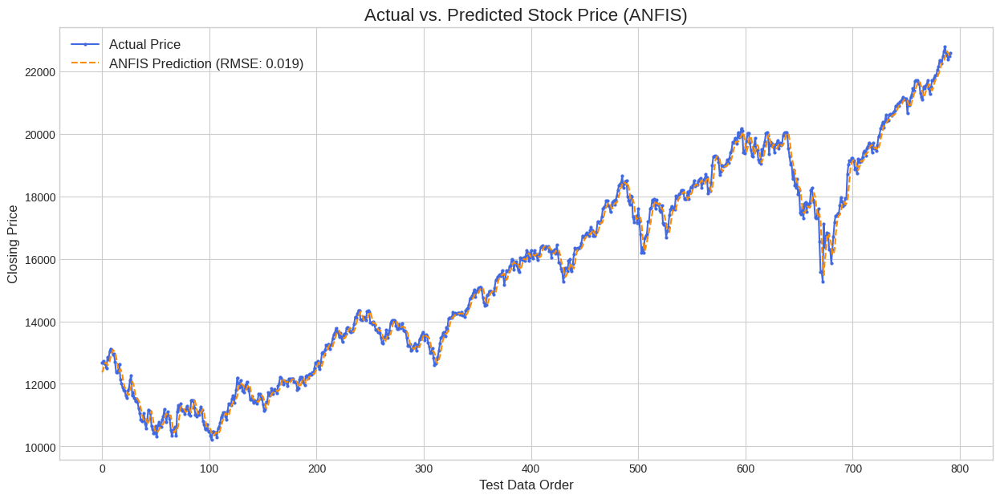

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=150,
    learning_rate= 0.01
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

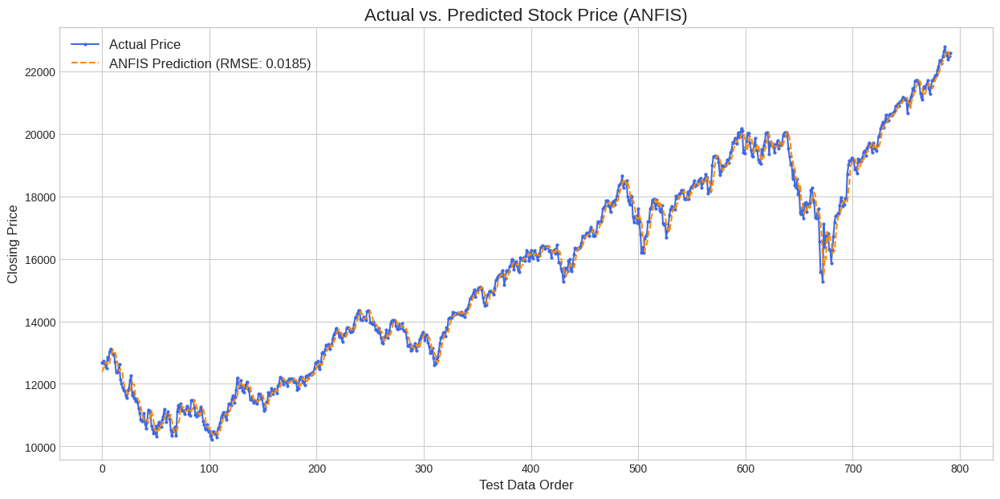

In [ ]:
# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.4f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 258.8117 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi     Selisih
0  12668.160156    12364.577794  303.582362
1  12720.580078    12452.302688  268.277390
2  12657.549805    12576.285180   81.264625
3  12644.459961    12677.835284   33.375323
4  12493.929688    12668.108871  174.179183

--- Statistik Selisih (Error) ---
count     792.000000
mean      196.974178
std       167.988954
min         0.535421
25%        85.667205
50%       161.457675
75%       262.147573
max      1645.815732
Name: Selisih, dtype: float64


### lr = 0.005

Data split chronologically:
 - Training set contains: 3164 rows
 - Testing set contains:  792 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 02 August 2022
Testing data spans from:  03 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3164, 3)
y_train_scaled shape: (3164,)
x_test_scaled shape:  (792, 3)
y_test_original shape: (792,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3164, 3), y=(3164,)
Testing data shape: X=(792, 3), y=(792,)

--- ANFIS Training Process ---
Epoch 1/150 completed.
Epoch 2/150 completed.
Epoch 3/150 completed.
Epoch 4/150 completed.
Epoch 5/150 completed.
Epoch 6/150 completed.
Epoch 7/150 completed.
Epoch 8/150 completed.
Epoch 9/150 completed.
Epoch 10/150 completed.
Epoch 11/150 completed.
Epoch 12/150 completed.
Epoch 13/150 completed.
Epoch 14/150 comple

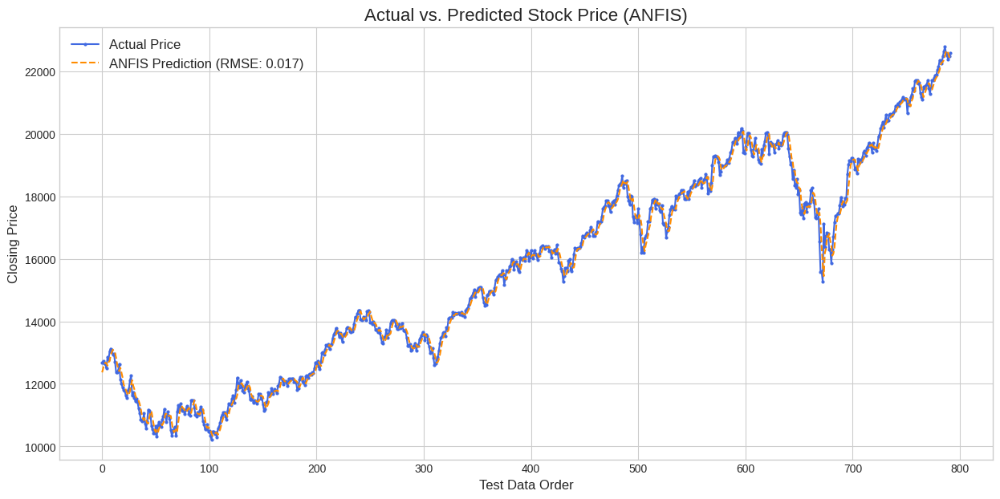

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=150,
    learning_rate= 0.005
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 241.1466 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi     Selisih
0  12668.160156    12366.279659  301.880498
1  12720.580078    12498.517333  222.062745
2  12657.549805    12610.351771   47.198034
3  12644.459961    12679.272441   34.812480
4  12493.929688    12668.393319  174.463632

--- Statistik Selisih (Error) ---
count     792.000000
mean      181.452131
std       158.929805
min         0.039792
25%        77.992647
50%       148.737443
75%       242.359681
max      1678.732402
Name: Selisih, dtype: float64


### lr = 0.001

Data split chronologically:
 - Training set contains: 3164 rows
 - Testing set contains:  792 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 02 August 2022
Testing data spans from:  03 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3164, 3)
y_train_scaled shape: (3164,)
x_test_scaled shape:  (792, 3)
y_test_original shape: (792,)

✅ Data preparation is complete and ready for the GA-ANFIS model.
Training data shape: X=(3164, 3), y=(3164,)
Testing data shape: X=(792, 3), y=(792,)

--- ANFIS Training Process ---
Epoch 1/150 completed.
Epoch 2/150 completed.
Epoch 3/150 completed.
Epoch 4/150 completed.
Epoch 5/150 completed.
Epoch 6/150 completed.
Epoch 7/150 completed.
Epoch 8/150 completed.
Epoch 9/150 completed.
Epoch 10/150 completed.
Epoch 11/150 completed.
Epoch 12/150 completed.
Epoch 13/150 completed.
Epoch 14/150 comple

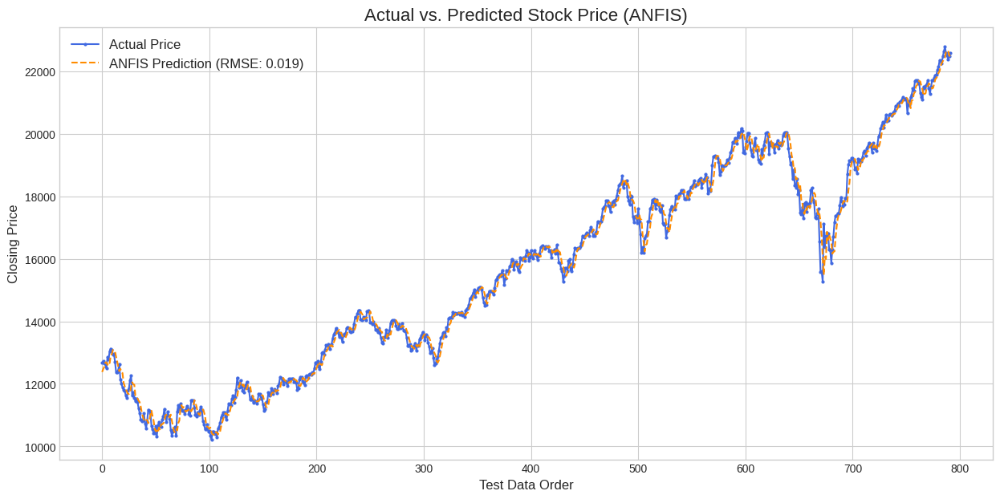

In [ ]:
# ===================================================================
# STEP 4: ANFIS MODEL TRAINING AND EVALUATION (WITH DUAL-SCALE COMPARISON)
# ===================================================================
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt

# 1. Get Ready-to-Use Data from the Pipeline (unchanged)
# Ensure GetData() function and lagged_df variable exist from previous cells
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

print(f"Training data shape: X={x_train.shape}, y={y_train_scaled.shape}")
print(f"Testing data shape: X={x_test.shape}, y={y_test_original.shape}")


# 2. Initialize and Train the ANFIS Model (unchanged)
print("\n--- ANFIS Training Process ---")
start_time = datetime.now()

anfis_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=150,
    learning_rate=0.001
)
anfis_model.fit(x_train, y_train_scaled)
print(f"Training Time: {datetime.now() - start_time}")


# ===================================================================
# MODIFIED EVALUATION SECTION
# ===================================================================
print("\n--- Evaluation Process ---")

# 3. Make Predictions (output is still in the normalized scale)
predictions_scaled = anfis_model.predict(x_test)

# 4. Inverse Transform Predictions to Original Scale
predictions_original = scaler_y.inverse_transform(predictions_scaled.reshape(-1, 1)).ravel()

# 5. Prepare the Scaled y_test for Comparison
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

# ======================= NEW CODE STARTS HERE =======================

# 6. Calculate RMSE on the Normalized Scale (Scaled)
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))

# 7. Calculate All Evaluation Metrics on the Original Scale (Unscaled)
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, predictions_original))
mape = mean_absolute_percentage_error(y_test_original, predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, predictions_original)

# 7.1. Calculate NRMSE (Normalized Root Mean Squared Error) on original data
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# 7.2. Calculate MASE (Mean Absolute Scaled Error) on original data
# The denominator is the MAE of the naive model on the training set
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= NEW CODE ENDS HERE =======================

# 8. Display all results clearly
print("\n\n--- Performance Results (On Normalized Scale) ---")
print(f"Test RMSE (Scaled): {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Performance Results (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


# 9. Plot the Results (unchanged)
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(15, 7))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=4, linestyle='-')
plt.plot(predictions_original, label=f'ANFIS Prediction (RMSE: {rmse_scaled:.3f})', color='darkorange', linestyle='--')
plt.title('Actual vs. Predicted Stock Price (ANFIS)', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Order', fontsize=12)
plt.legend(fontsize=12)
plt.show()

In [ ]:
# 4. Hitung Error dalam Skala Asli
rmse = np.sqrt(mean_squared_error(y_test_original, predictions_original))
print(f"Test RMSE (dalam skala harga saham): {rmse:.4f} Poin")


# ===================================================================
# BARU: Buat DataFrame untuk membandingkan hasil
# ===================================================================
hasil_perbandingan = pd.DataFrame({
    'Harga Aktual': y_test_original,
    'Harga Prediksi': predictions_original
})

hasil_perbandingan['Selisih'] = abs(hasil_perbandingan['Harga Aktual'] - hasil_perbandingan['Harga Prediksi'])

print("\n--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---")
print(hasil_perbandingan.head())

print("\n--- Statistik Selisih (Error) ---")
print(hasil_perbandingan['Selisih'].describe())

Test RMSE (dalam skala harga saham): 265.4196 Poin

--- Perbandingan Hasil Prediksi vs. Data Aktual (5 Data Pertama) ---
   Harga Aktual  Harga Prediksi     Selisih
0  12668.160156    12379.105230  289.054926
1  12720.580078    12472.886196  247.693882
2  12657.549805    12539.160601  118.389204
3  12644.459961    12680.664052   36.204091
4  12493.929688    12689.891988  195.962301

--- Statistik Selisih (Error) ---
count     792.000000
mean      199.834176
std       174.792643
min         1.321235
25%        80.009807
50%       163.611843
75%       262.290930
max      1636.026091
Name: Selisih, dtype: float64


## GA ANFIS (`n_pop` = 10;`ngen`=10)

In [ ]:
pip install deap

In [ ]:
# ===================================================================
# CELL 1: UNIFIED DATA PREPARATION PIPELINE
# ===================================================================

def create_modeling_pipeline(dataframe, split_ratio=0.8):
    """
    A unified function to prepare data for modeling. It splits the data,
    verifies date ranges, scales features and target, and returns
    all necessary components.
    """
    # Ensure the 'Date' column is in datetime format
    dataframe['Date'] = pd.to_datetime(dataframe['Date'])

    # --- 1. Chronological Splitting ---
    split_index = int(len(dataframe) * split_ratio)
    train_df = dataframe.iloc[:split_index]
    test_df = dataframe.iloc[split_index:]

    print(f"Data split chronologically:")
    print(f" - Training set contains: {len(train_df)} rows")
    print(f" - Testing set contains:  {len(test_df)} rows")

    # --- 2. Date Range Verification ---
    start_date_train = train_df['Date'].iloc[0].strftime('%d %B %Y')
    end_date_train = train_df['Date'].iloc[-1].strftime('%d %B %Y')
    start_date_test = test_df['Date'].iloc[0].strftime('%d %B %Y')
    end_date_test = test_df['Date'].iloc[-1].strftime('%d %B %Y')

    print("\n--- 📅 Date Range Verification (80/20 Split) ---")
    print(f"Training data spans from: {start_date_train} to {end_date_train}")
    print(f"Testing data spans from:  {start_date_test} to {end_date_test}")
    print("-" * 60)

    # --- 3. Feature and Target Separation ---
    X_train_df = train_df.drop(columns=["Close(t)", "Date"])
    y_train_original = train_df["Close(t)"].values
    X_test_df = test_df.drop(columns=["Close(t)", "Date"])
    y_test_original = test_df["Close(t)"].values

    # --- 4. Scaling ---
    scaler_x = MinMaxScaler().fit(X_train_df)
    scaler_y = MinMaxScaler().fit(y_train_original.reshape(-1, 1))
    x_train_scaled = scaler_x.transform(X_train_df)
    x_test_scaled = scaler_x.transform(X_test_df)
    y_train_scaled = scaler_y.transform(y_train_original.reshape(-1, 1)).ravel()

    # --- 5. Final Dimension Check ---
    print("\n--- Final Data Dimensions for Model ---")
    print(f"x_train_scaled shape: {x_train_scaled.shape}")
    print(f"y_train_scaled shape: {y_train_scaled.shape}")
    print(f"x_test_scaled shape:  {x_test_scaled.shape}")
    print(f"y_test_original shape: {y_test_original.shape}")
    print("\n✅ Data preparation is complete and ready for the GA-ANFIS model.")

    return x_train_scaled, x_test_scaled, y_train_scaled, y_train_original, y_test_original, scaler_y

# --- HOW TO USE ---
# Assuming 'lagged_df' is your dataframe from the previous step
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

Data split chronologically:
 - Training set contains: 3164 rows
 - Testing set contains:  792 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 02 August 2022
Testing data spans from:  03 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3164, 3)
y_train_scaled shape: (3164,)
x_test_scaled shape:  (792, 3)
y_test_original shape: (792,)

✅ Data preparation is complete and ready for the GA-ANFIS model.


In [ ]:
# ===================================================================
# CELL 2: GA FITNESS FUNCTION & CONFIGURATION
# ===================================================================
import random
from deap import base, creator, tools, algorithms
from datetime import datetime

# Create a scaled version of the test target for fitness evaluation
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

def evaluate_anfis(individual):
    """
    Fitness function for the GA. It evaluates a set of hyperparameters
    by training an ANFIS model and returning its SCALED RMSE on the test set.
    """
    n_mfs, epochs, learning_rate = int(individual[0]), int(individual[1]), individual[2]
    print(f"Trying: n_mfs={n_mfs}, epochs={epochs}, lr={learning_rate:.4f}")

    model = ANFIS(n_inputs=x_train.shape[1], n_mfs=n_mfs, epochs=epochs, learning_rate=learning_rate)
    model.fit(x_train, y_train_scaled)

    predictions_scaled = model.predict(x_test)
    rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))
    print(f"--> Resulting Scaled RMSE: {rmse_scaled:.4f}\n")
    return (rmse_scaled,) # Return as a tuple for DEAP

# --- Configure the Genetic Algorithm ---
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individual", list, fitness=creator.FitnessMin)
toolbox = base.Toolbox()

# Define the search space for hyperparameters (CHROMOSOME)
LOWER_BOUNDS = [1, 200, 0.1]
UPPER_BOUNDS = [3, 300, 0.2]

# Register attribute generators
toolbox.register("attr_n_mfs", random.randint, LOWER_BOUNDS[0], UPPER_BOUNDS[0])
toolbox.register("attr_epochs", random.randint, LOWER_BOUNDS[1], UPPER_BOUNDS[1])
toolbox.register("attr_lr", random.uniform, LOWER_BOUNDS[2], UPPER_BOUNDS[2])

# Register individual and population generators
toolbox.register("individual", tools.initCycle, creator.Individual,
                 (toolbox.attr_n_mfs, toolbox.attr_epochs, toolbox.attr_lr), n=1)
toolbox.register("population", tools.initRepeat, list, toolbox.individual)

# Custom mutation function to handle mixed integer/float types
def customMutation(individual, indpb):
    if random.random() < indpb: individual[0] = random.randint(LOWER_BOUNDS[0], UPPER_BOUNDS[0])
    if random.random() < indpb: individual[1] = random.randint(LOWER_BOUNDS[1], UPPER_BOUNDS[1])
    if random.random() < indpb: individual[2] = random.uniform(LOWER_BOUNDS[2], UPPER_BOUNDS[2])
    return individual,

# Register genetic operators
toolbox.register("evaluate", evaluate_anfis)
toolbox.register("mate", tools.cxTwoPoint)
toolbox.register("mutate", customMutation, indpb=0.2)
toolbox.register("select", tools.selTournament, tournsize=3)

/usr/local/lib/python3.12/dist-packages/deap/creator.py:185: RuntimeWarning: A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.
  warnings.warn("A class named '{0}' has already been created and it "
/usr/local/lib/python3.12/dist-packages/deap/creator.py:185: RuntimeWarning: A class named 'Individual' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.
  warnings.warn("A class named '{0}' has already been created and it "


In [ ]:
# ===================================================================
# CELL 3: RUN GENETIC ALGORITHM OPTIMIZATION
# ===================================================================
print("🚀 Starting ANFIS Optimization with Genetic Algorithm...")
start_time_ga = datetime.now()

# Initialize population and tools
pop = toolbox.population(n=10) # Population size
hof = tools.HallOfFame(1)      # Stores the single best individual
stats = tools.Statistics(lambda ind: ind.fitness.values)
stats.register("avg", np.mean)
stats.register("min", np.min)

# Run the evolutionary algorithm
algorithms.eaSimple(pop, toolbox, cxpb=0.6, mutpb=0.2, ngen=10, # Number of generations
                    stats=stats, halloffame=hof, verbose=True)

print(f"\nGA Optimization Time: {datetime.now() - start_time_ga}")

# --- Extract and Display Best Results ---
best_params = hof[0]
best_n_mfs, best_epochs, best_lr = int(best_params[0]), int(best_params[1]), best_params[2]
best_scaled_rmse = hof[0].fitness.values[0]

print("\n--- BEST OPTIMIZATION RESULTS ---")
print(f"Best Scaled RMSE Found: {best_scaled_rmse:.4f}")
print(f"Best Hyperparameter Combination:")
print(f"  - n_mfs: {best_n_mfs}")
print(f"  - epochs: {best_epochs}")
print(f"  - learning_rate: {best_lr:.4f}")

Streaming output truncated to the last 5000 lines.
Epoch 23/277 completed.
Epoch 24/277 completed.
Epoch 25/277 completed.
Epoch 26/277 completed.
Epoch 27/277 completed.
Epoch 28/277 completed.
Epoch 29/277 completed.
Epoch 30/277 completed.
Epoch 31/277 completed.
Epoch 32/277 completed.
Epoch 33/277 completed.
Epoch 34/277 completed.
Epoch 35/277 completed.
Epoch 36/277 completed.
Epoch 37/277 completed.
Epoch 38/277 completed.
Epoch 39/277 completed.
Epoch 40/277 completed.
Epoch 41/277 completed.
Epoch 42/277 completed.
Epoch 43/277 completed.
Epoch 44/277 completed.
Epoch 45/277 completed.
Epoch 46/277 completed.
Epoch 47/277 completed.
Epoch 48/277 completed.
Epoch 49/277 completed.
Epoch 50/277 completed.
Epoch 51/277 completed.
Epoch 52/277 completed.
Epoch 53/277 completed.
Epoch 54/277 completed.
Epoch 55/277 completed.
Epoch 56/277 completed.
Epoch 57/277 completed.
Epoch 58/277 completed.
Epoch 59/277 completed.
Epoch 60/277 completed.
Epoch 61/277 completed.
Epoch 62/277 

In [ ]:
# ===================================================================
# CELL 4: TRAIN FINAL MODEL & COMPREHENSIVE EVALUATION (Corrected)
# ===================================================================
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error
import numpy as np

print("\n--- Training Final Model with Best Parameters ---")
final_model = ANFIS(
    n_inputs=x_train.shape[1],
    n_mfs=2,
    epochs=277,
    learning_rate=0.1705
)
final_model.fit(x_train, y_train_scaled)

# Make final predictions (scaled) and revert to the original price scale (unscaled)
final_predictions_scaled = final_model.predict(x_test)
final_predictions_original = scaler_y.inverse_transform(final_predictions_scaled.reshape(-1, 1)).ravel()

# ======================= METRIC CALCULATION STARTS HERE =======================

# --- Calculate Metrics on the SCALED Data ---
# BARU: Siapkan y_test versi scaled untuk perbandingan
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))
rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, final_predictions_scaled))


# --- Calculate All Metrics on the Original (UNSCALED) Data ---
rmse_unscaled = np.sqrt(mean_squared_error(y_test_original, final_predictions_original))
mape = mean_absolute_percentage_error(y_test_original, final_predictions_original)
mae_unscaled = mean_absolute_error(y_test_original, final_predictions_original)

# NRMSE Calculation
data_range = y_test_original.max() - y_test_original.min()
nrmse = rmse_unscaled / data_range if data_range != 0 else np.inf

# MASE Calculation
naive_mae_on_train = np.mean(np.abs(np.diff(y_train_original)))
mase = mae_unscaled / naive_mae_on_train if naive_mae_on_train != 0 else np.inf

# ======================= DISPLAY ALL METRICS =======================

# --- Display All Final Performance Metrics ---
print("\n\n--- Final Model Performance (On Normalized Scale) ---")
print(f"Test RMSE (Scaled)  : {rmse_scaled:.4f} (For comparison across datasets)")

print("\n--- Final Model Performance (On Original Price Scale) ---")
print(f"Test RMSE (Unscaled): {rmse_unscaled:.4f} Points")
print(f"Test NRMSE          : {nrmse:.2%} (Error is ~{nrmse:.2%} of the data range)")
print(f"Test MAPE           : {mape:.2%}")
print(f"Test MASE           : {mase:.4f} (Value < 1 is better than naive forecast)")


--- Training Final Model with Best Parameters ---
Epoch 1/277 completed.
Epoch 2/277 completed.
Epoch 3/277 completed.
Epoch 4/277 completed.
Epoch 5/277 completed.
Epoch 6/277 completed.
Epoch 7/277 completed.
Epoch 8/277 completed.
Epoch 9/277 completed.
Epoch 10/277 completed.
Epoch 11/277 completed.
Epoch 12/277 completed.
Epoch 13/277 completed.
Epoch 14/277 completed.
Epoch 15/277 completed.
Epoch 16/277 completed.
Epoch 17/277 completed.
Epoch 18/277 completed.
Epoch 19/277 completed.
Epoch 20/277 completed.
Epoch 21/277 completed.
Epoch 22/277 completed.
Epoch 23/277 completed.
Epoch 24/277 completed.
Epoch 25/277 completed.
Epoch 26/277 completed.
Epoch 27/277 completed.
Epoch 28/277 completed.
Epoch 29/277 completed.
Epoch 30/277 completed.
Epoch 31/277 completed.
Epoch 32/277 completed.
Epoch 33/277 completed.
Epoch 34/277 completed.
Epoch 35/277 completed.
Epoch 36/277 completed.
Epoch 37/277 completed.
Epoch 38/277 completed.
Epoch 39/277 completed.
Epoch 40/277 completed


--- Comparison Table: Actual vs. Predicted Prices ---
    Actual_Price  Predicted_Price       Error
0   12668.160156     12397.607235  270.552922
1   12720.580078     12605.548268  115.031810
2   12657.549805     12713.979824   56.430019
3   12644.459961     12711.951387   67.491426
4   12493.929688     12692.956514  199.026827
5   12854.799805     12583.220196  271.579608
6   12779.910156     12789.186104    9.275948
7   13047.190430     12810.390841  236.799589
8   13128.049805     13004.033161  124.016644
9   13102.549805     13114.541092   11.991288
10  12938.120117     13139.833426  201.713309
11  12965.339844     13030.464650   65.124806
12  12705.219727     13007.912651  302.692924
13  12381.570312     12825.117823  443.547511
14  12381.299805     12548.989211  167.689407

--- Statistics of Prediction Error ---
count     792.000000
mean      160.578969
std       148.687993
min         0.398823
25%        60.968860
50%       126.310680
75%       215.984084
max      1726.391443
N

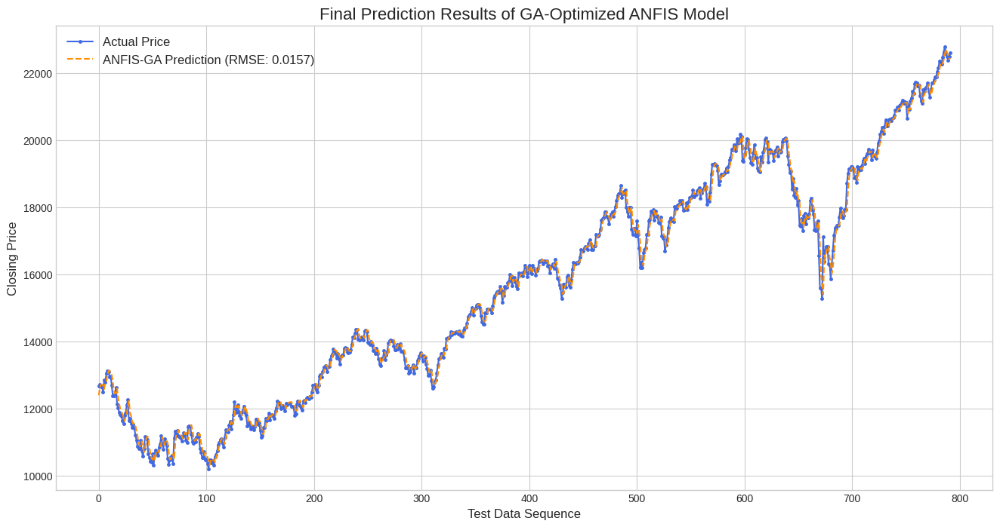

In [ ]:
# ===================================================================
# CELL 5: PREDICTION COMPARISON TABLE & PLOTTING
# ===================================================================
import matplotlib.pyplot as plt

# Create a DataFrame for easy comparison
comparison_df = pd.DataFrame({
    'Actual_Price': y_test_original,
    'Predicted_Price': final_predictions_original
})
comparison_df['Error'] = abs(comparison_df['Actual_Price'] - comparison_df['Predicted_Price'])

print("\n--- Comparison Table: Actual vs. Predicted Prices ---")
print(comparison_df.head(15))

print("\n--- Statistics of Prediction Error ---")
print(comparison_df['Error'].describe())

# --- Plot the Final Results ---
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(16, 8))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=5, linestyle='-')
plt.plot(final_predictions_original, label=f'ANFIS-GA Prediction (RMSE: {rmse_scaled:.4f})', color='darkorange', linestyle='--')
plt.title('Final Prediction Results of GA-Optimized ANFIS Model', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Sequence', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()

## GA ANFIS (`n_pop` = 20;`ngen`=30)

In [ ]:
pip install deap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 136.0/136.0 kB 3.5 MB/s eta 0:00:00


In [ ]:
# ===================================================================
# CELL 1: UNIFIED DATA PREPARATION PIPELINE
# ===================================================================

def create_modeling_pipeline(dataframe, split_ratio=0.8):
    """
    A unified function to prepare data for modeling. It splits the data,
    verifies date ranges, scales features and target, and returns
    all necessary components.
    """
    # Ensure the 'Date' column is in datetime format
    dataframe['Date'] = pd.to_datetime(dataframe['Date'])

    # --- 1. Chronological Splitting ---
    split_index = int(len(dataframe) * split_ratio)
    train_df = dataframe.iloc[:split_index]
    test_df = dataframe.iloc[split_index:]

    print(f"Data split chronologically:")
    print(f" - Training set contains: {len(train_df)} rows")
    print(f" - Testing set contains:  {len(test_df)} rows")

    # --- 2. Date Range Verification ---
    start_date_train = train_df['Date'].iloc[0].strftime('%d %B %Y')
    end_date_train = train_df['Date'].iloc[-1].strftime('%d %B %Y')
    start_date_test = test_df['Date'].iloc[0].strftime('%d %B %Y')
    end_date_test = test_df['Date'].iloc[-1].strftime('%d %B %Y')

    print("\n--- 📅 Date Range Verification (80/20 Split) ---")
    print(f"Training data spans from: {start_date_train} to {end_date_train}")
    print(f"Testing data spans from:  {start_date_test} to {end_date_test}")
    print("-" * 60)

    # --- 3. Feature and Target Separation ---
    X_train_df = train_df.drop(columns=["Close(t)", "Date"])
    y_train_original = train_df["Close(t)"].values
    X_test_df = test_df.drop(columns=["Close(t)", "Date"])
    y_test_original = test_df["Close(t)"].values

    # --- 4. Scaling ---
    scaler_x = MinMaxScaler().fit(X_train_df)
    scaler_y = MinMaxScaler().fit(y_train_original.reshape(-1, 1))
    x_train_scaled = scaler_x.transform(X_train_df)
    x_test_scaled = scaler_x.transform(X_test_df)
    y_train_scaled = scaler_y.transform(y_train_original.reshape(-1, 1)).ravel()

    # --- 5. Final Dimension Check ---
    print("\n--- Final Data Dimensions for Model ---")
    print(f"x_train_scaled shape: {x_train_scaled.shape}")
    print(f"y_train_scaled shape: {y_train_scaled.shape}")
    print(f"x_test_scaled shape:  {x_test_scaled.shape}")
    print(f"y_test_original shape: {y_test_original.shape}")
    print("\n✅ Data preparation is complete and ready for the GA-ANFIS model.")

    return x_train_scaled, x_test_scaled, y_train_scaled, y_train_original, y_test_original, scaler_y

# --- HOW TO USE ---
# Assuming 'lagged_df' is your dataframe from the previous step
x_train, x_test, y_train_scaled, y_train_original, y_test_original, scaler_y = create_modeling_pipeline(lagged_df)

Data split chronologically:
 - Training set contains: 3164 rows
 - Testing set contains:  792 rows

--- 📅 Date Range Verification (80/20 Split) ---
Training data spans from: 07 January 2010 to 02 August 2022
Testing data spans from:  03 August 2022 to 29 September 2025
------------------------------------------------------------

--- Final Data Dimensions for Model ---
x_train_scaled shape: (3164, 3)
y_train_scaled shape: (3164,)
x_test_scaled shape:  (792, 3)
y_test_original shape: (792,)

✅ Data preparation is complete and ready for the GA-ANFIS model.


In [ ]:
# ===================================================================
# CELL 2: GA FITNESS FUNCTION & CONFIGURATION
# ===================================================================
import random
from deap import base, creator, tools, algorithms
from datetime import datetime

# Create a scaled version of the test target for fitness evaluation
y_test_scaled = scaler_y.transform(y_test_original.reshape(-1, 1))

def evaluate_anfis(individual):
    """
    Fitness function for the GA. It evaluates a set of hyperparameters
    by training an ANFIS model and returning its SCALED RMSE on the test set.
    """
    n_mfs, epochs, learning_rate = int(individual[0]), int(individual[1]), individual[2]
    print(f"Trying: n_mfs={n_mfs}, epochs={epochs}, lr={learning_rate:.4f}")

    model = ANFIS(n_inputs=x_train.shape[1], n_mfs=n_mfs, epochs=epochs, learning_rate=learning_rate)
    model.fit(x_train, y_train_scaled)

    predictions_scaled = model.predict(x_test)
    rmse_scaled = np.sqrt(mean_squared_error(y_test_scaled, predictions_scaled))
    print(f"--> Resulting Scaled RMSE: {rmse_scaled:.4f}\n")
    return (rmse_scaled,) # Return as a tuple for DEAP

# --- Configure the Genetic Algorithm ---
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individual", list, fitness=creator.FitnessMin)
toolbox = base.Toolbox()

# Define the search space for hyperparameters (CHROMOSOME)
LOWER_BOUNDS = [1, 200, 0.1]
UPPER_BOUNDS = [3, 300, 0.2]

# Register attribute generators
toolbox.register("attr_n_mfs", random.randint, LOWER_BOUNDS[0], UPPER_BOUNDS[0])
toolbox.register("attr_epochs", random.randint, LOWER_BOUNDS[1], UPPER_BOUNDS[1])
toolbox.register("attr_lr", random.uniform, LOWER_BOUNDS[2], UPPER_BOUNDS[2])

# Register individual and population generators
toolbox.register("individual", tools.initCycle, creator.Individual,
                 (toolbox.attr_n_mfs, toolbox.attr_epochs, toolbox.attr_lr), n=1)
toolbox.register("population", tools.initRepeat, list, toolbox.individual)

# Custom mutation function to handle mixed integer/float types
def customMutation(individual, indpb):
    if random.random() < indpb: individual[0] = random.randint(LOWER_BOUNDS[0], UPPER_BOUNDS[0])
    if random.random() < indpb: individual[1] = random.randint(LOWER_BOUNDS[1], UPPER_BOUNDS[1])
    if random.random() < indpb: individual[2] = random.uniform(LOWER_BOUNDS[2], UPPER_BOUNDS[2])
    return individual,

# Register genetic operators
toolbox.register("evaluate", evaluate_anfis)
toolbox.register("mate", tools.cxTwoPoint)
toolbox.register("mutate", customMutation, indpb=0.2)
toolbox.register("select", tools.selTournament, tournsize=3)

In [ ]:
# ===================================================================
# CELL 3: RUN GENETIC ALGORITHM OPTIMIZATION
# ===================================================================
print("🚀 Starting ANFIS Optimization with Genetic Algorithm...")
start_time_ga = datetime.now()

# Initialize population and tools
pop = toolbox.population(n=20) # Population size
hof = tools.HallOfFame(1)      # Stores the single best individual
stats = tools.Statistics(lambda ind: ind.fitness.values)
stats.register("avg", np.mean)
stats.register("min", np.min)

# Run the evolutionary algorithm
algorithms.eaSimple(pop, toolbox, cxpb=0.6, mutpb=0.2, ngen=30, # Number of generations
                    stats=stats, halloffame=hof, verbose=True)

print(f"\nGA Optimization Time: {datetime.now() - start_time_ga}")

# --- Extract and Display Best Results ---
best_params = hof[0]
best_n_mfs, best_epochs, best_lr = int(best_params[0]), int(best_params[1]), best_params[2]
best_scaled_rmse = hof[0].fitness.values[0]

print("\n--- BEST OPTIMIZATION RESULTS ---")
print(f"Best Scaled RMSE Found: {best_scaled_rmse:.4f}")
print(f"Best Hyperparameter Combination:")
print(f"  - n_mfs: {best_n_mfs}")
print(f"  - epochs: {best_epochs}")
print(f"  - learning_rate: {best_lr:.4f}")

Streaming output truncated to the last 5000 lines.
Epoch 157/289 completed.
Epoch 158/289 completed.
Epoch 159/289 completed.
Epoch 160/289 completed.
Epoch 161/289 completed.
Epoch 162/289 completed.
Epoch 163/289 completed.
Epoch 164/289 completed.
Epoch 165/289 completed.
Epoch 166/289 completed.
Epoch 167/289 completed.
Epoch 168/289 completed.
Epoch 169/289 completed.
Epoch 170/289 completed.
Epoch 171/289 completed.
Epoch 172/289 completed.
Epoch 173/289 completed.
Epoch 174/289 completed.
Epoch 175/289 completed.
Epoch 176/289 completed.
Epoch 177/289 completed.
Epoch 178/289 completed.
Epoch 179/289 completed.
Epoch 180/289 completed.
Epoch 181/289 completed.
Epoch 182/289 completed.
Epoch 183/289 completed.
Epoch 184/289 completed.
Epoch 185/289 completed.
Epoch 186/289 completed.
Epoch 187/289 completed.
Epoch 188/289 completed.
Epoch 189/289 completed.
Epoch 190/289 completed.
Epoch 191/289 completed.
Epoch 192/289 completed.
Epoch 193/289 completed.
Epoch 194/289 completed.

GA Optimization Time: 11:26:54.014287

--- BEST OPTIMIZATION RESULTS ---

Best Scaled RMSE Found: 0.0155
Best Hyperparameter Combination:
  - n_mfs: 2
  - epochs: 289
  - learning_rate: 0.1876


--- Comparison Table: Actual vs. Predicted Prices ---
    Actual_Price  Predicted_Price       Error
0   12668.160156     12405.120842  263.039315
1   12720.580078     12597.555407  123.024671
2   12657.549805     12719.293090   61.743286
3   12644.459961     12721.539625   77.079665
4   12493.929688     12699.866939  205.937251
5   12854.799805     12596.600374  258.199431
6   12779.910156     12778.757261    1.152896
7   13047.190430     12821.592702  225.597728
8   13128.049805     12998.033780  130.016024
9   13102.549805     13118.198331   15.648527
10  12938.120117     13147.632958  209.512841
11  12965.339844     13044.234704   78.894860
12  12705.219727     13012.486971  307.267244
13  12381.570312     12843.513983  461.943670
14  12381.299805     12569.349304  188.049499

--- Statistics of Prediction Error ---
count     792.000000
mean      162.841606
std       150.423031
min         0.309472
25%        63.157860
50%       126.827195
75%       222.941825
max      1705.751212
N

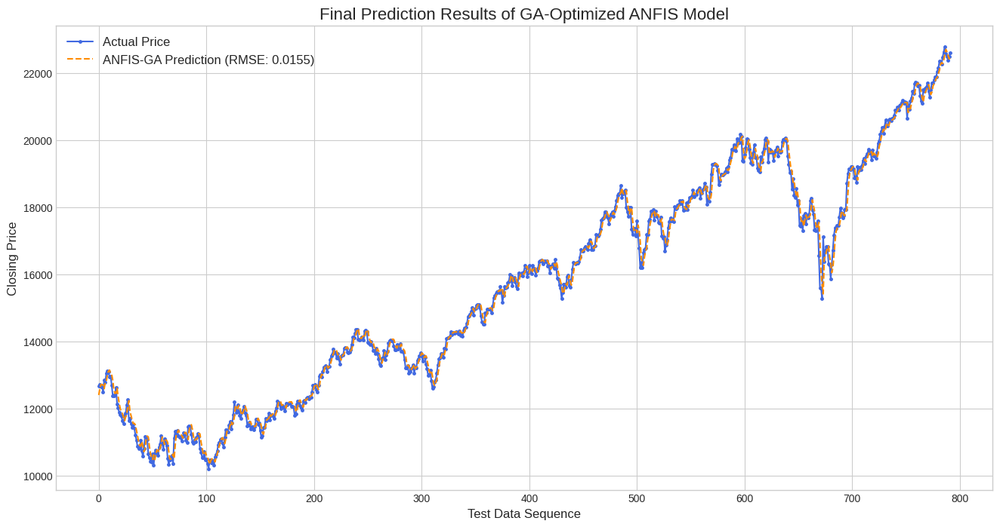

In [ ]:
# ===================================================================
# CELL 5: PREDICTION COMPARISON TABLE & PLOTTING
# ===================================================================
import matplotlib.pyplot as plt

# Create a DataFrame for easy comparison
comparison_df = pd.DataFrame({
    'Actual_Price': y_test_original,
    'Predicted_Price': final_predictions_original
})
comparison_df['Error'] = abs(comparison_df['Actual_Price'] - comparison_df['Predicted_Price'])

print("\n--- Comparison Table: Actual vs. Predicted Prices ---")
print(comparison_df.head(15))

print("\n--- Statistics of Prediction Error ---")
print(comparison_df['Error'].describe())

# --- Plot the Final Results ---
plt.style.use('seaborn-v0_8-whitegrid')
plt.figure(figsize=(16, 8))
plt.plot(y_test_original, label='Actual Price', color='royalblue', marker='.', markersize=5, linestyle='-')
plt.plot(final_predictions_original, label=f'ANFIS-GA Prediction (RMSE: {rmse_scaled:.4f})', color='darkorange', linestyle='--')
plt.title('Final Prediction Results of GA-Optimized ANFIS Model', fontsize=16)
plt.ylabel('Closing Price', fontsize=12)
plt.xlabel('Test Data Sequence', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True)
plt.show()

# Conclusion


*   ANFIS membutuhkan serangkaian pengujian untuk mendapatkan hasil yang maksimal. Namun, setiap data indeks harga saham di berbagai negara memiliki skala yang berbeda beda. Setiap data tersebut akan menghasilkan parameter yang berbeda di bagian pengujiannya. Ketika model ANFIS diaplikasikan ke real world namun parameternya tidak bisa menyesuaikan skala data yang berbeda di setiap negara, maka model tersebut menjadi tidak efektif dan efisien untuk digunakan oleh praktisi keuangan. (Misalnya dijelasin kalo dalam perspektif keuangan, praktisi keuangan kaya investor dan lain lain itu butuh model yang seperti apa)
    * Contohnya hasil pengujian model ANFIS dari Euro Stoxx 50 menunjukkan bahwa parameter yang terbaik adalah mebership function bernilai 4, akan tetapi, parameter model ANFIS data LQ45 yang terbaik justru dengan membership function bernilai 2. Nilai
    * Hal ini membuktikan bahwa dibutuhkan model yang dapat menyesuaikan parameter model ANFIS ke dalam data indeks harga saham yang berbeda-beda.
*  Penelitian GA ANFIS ini tidak hanya bertujuan untuk menciptakan model yang efektif dan efisien dalam meramalkan indeks harga saham, namun juga membuktikan bahwa optimasi model ANFIS dengan GA lebih adaptif untuk diaplikasikan ke berbagai indeks harga saham di negara negara yang berbeda, tidak hanya terpaku oleh satu data saja. Karna pastinya praktisi keuangan tidak hanya melihat peramalan harga saham untuk negara Indonesia saja namun yang mampu untuk meramalkan berebagai indeks harga saham negara lain.
* Meskipun proses optimasi menggunakan GA-ANFIS membutuhkan waktu komputasi yang signifikan (misalnya, 11 jam 15 menit), biaya ini sepadan dengan peningkatan akurasi yang dicapai dibandingkan dengan metode tuning manual.

